In [3]:
import PeterChurchillFunctions as Function
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.special import erf
import statsmodels.api as sm
from scipy.odr import ODR, Model, RealData
from matplotlib.colors import LogNorm
from sklearn.cluster import KMeans
from scipy import optimize
import pylab as pl

In [2]:
NorPath = "/share/pech2273/combined.nc"
ds = xr.open_dataset(NorPath, chunks={})


In [4]:
ds = ds.CDNC

In [4]:
import numpy as np
import xarray as xr
from scipy import stats
from pathlib import Path
from joblib import Parallel, delayed

N_BINS         = 100
MIN_BIN_POINTS = 2
N_JOBS         = 4
BINNING        = 'Equal Number'

In [5]:
def compute_cell_no_updraft(CCN_data, CDNC_data, n_radii):
    """
    CCN_data:  (time, radius)
    CDNC_data: (time,)
    No updraft splitting — Total only.
    """
    out = {k: np.full(n_radii, np.nan)
           for k in ['slope', 'r_value', 'std_err', 'intercept']}

    valid  = np.isfinite(CCN_data).any(axis=1) & np.isfinite(CDNC_data)
    
    for r_idx in range(n_radii):
        CCN_r  = CCN_data[:, r_idx]
        v      = np.isfinite(CCN_r) & np.isfinite(CDNC_data)
        CCN_v  = CCN_r[v]
        CDNC_v = CDNC_data[v]

        if CCN_v.size < 2:
            continue

        positive = (CCN_v > 0) & (CDNC_v > 0)
        CCN_v  = CCN_v[positive]
        CDNC_v = CDNC_v[positive]

        if CCN_v.size < 2:
            continue
        
        lx = np.log10(CCN_v)
        ly = np.log10(CDNC_v)

        if BINNING == 'Equal Number':
            bins = np.unique(np.quantile(lx, np.linspace(0, 1, N_BINS + 1)))
        else:
            try:
                bins = np.linspace(lx.min(), lx.max(), N_BINS + 1)
            except ValueError:
                continue

        if len(bins) < 3:
            continue

        lx_mean, ly_mean = [], []
        for b in range(len(bins) - 1):
            if b == len(bins) - 2:
                mask_bin = (lx >= bins[b]) & (lx <= bins[b+1])
            else:
                mask_bin = (lx >= bins[b]) & (lx < bins[b+1])
            if np.sum(mask_bin) >= MIN_BIN_POINTS:
                lx_mean.append(np.median(lx[mask_bin]))
                ly_mean.append(np.median(ly[mask_bin]))

        lx_mean = np.array(lx_mean)
        ly_mean = np.array(ly_mean)
        finite  = np.isfinite(lx_mean) & np.isfinite(ly_mean)

        if finite.sum() < MIN_BIN_POINTS:
            continue

        slope, intercept, r_value, _, std_err = stats.linregress(
            lx_mean[finite], ly_mean[finite]
        )
        out['slope'][r_idx]     = slope
        out['r_value'][r_idx]   = r_value
        out['std_err'][r_idx]   = std_err
        out['intercept'][r_idx] = intercept

    return out


def process_lat_row_no_updraft(i, CCN_lev, CDNC_lev, n_lons, n_radii):
    """Process all longitude points for a single latitude row."""
    row = {k: np.full((n_lons, n_radii), np.nan)
           for k in ['slope', 'r_value', 'std_err', 'intercept']}

    for j in range(n_lons):
        CCN_data  = CCN_lev[:, :, i, j]   # (time, radius)
        CDNC_data = CDNC_lev[:, i, j]     # (time,)

        res = compute_cell_no_updraft(CCN_data, CDNC_data, n_radii)
        for k in row:
            row[k][j] = res[k]

    return i, row


def make_output_dataset_no_updraft(lats, lons, radii):
    shape = (len(lats), len(lons), len(radii))
    return xr.Dataset(
        data_vars={
            'slope':     (['lat', 'lon', 'radius'], np.full(shape, np.nan)),
            'r_value':   (['lat', 'lon', 'radius'], np.full(shape, np.nan)),
            'std_err':   (['lat', 'lon', 'radius'], np.full(shape, np.nan)),
            'intercept': (['lat', 'lon', 'radius'], np.full(shape, np.nan)),
        },
        coords={'lat': lats, 'lon': lons, 'radius': radii}
    )

In [6]:
# ds is already open in your notebook
radii  = ds.radius.values
lats   = ds.lat.values
lons   = ds.lon.values
levs   = ds.lev.values
n_radii = len(radii)
n_lats  = len(lats)
n_lons  = len(lons)

print(f"Grid: {n_lats} lat x {n_lons} lon, {len(levs)} levels, {n_radii} radii")

Grid: 96 lat x 144 lon, 10 levels, 21 radii


In [7]:
import warnings
warnings.filterwarnings('ignore', message='divide by zero encountered in log10')
warnings.filterwarnings('ignore', message='invalid value encountered in subtract')

In [8]:
results_per_lev = {}

for lev_idx, lev in enumerate(levs):
    print(f"\nProcessing level {lev:.1f} hPa ({lev_idx+1}/{len(levs)})...")

    CCN_lev  = ds['CCN'].isel(lev=lev_idx).transpose('time', 'radius', 'lat', 'lon').load().values
    CDNC_lev = ds['CDNC'].isel(lev=lev_idx).transpose('time', 'lat', 'lon').load().values

    results = Parallel(n_jobs=N_JOBS, verbose=5)(
        delayed(process_lat_row_no_updraft)(i, CCN_lev, CDNC_lev, n_lons, n_radii)
        for i in range(n_lats)
    )

    ds_out = make_output_dataset_no_updraft(lats, lons, radii)
    for i, row in results:
        for k in ['slope', 'r_value', 'std_err', 'intercept']:
            ds_out[k].values[i] = row[k]

    results_per_lev[f'{lev:.1f}hPa'] = ds_out
    print(f"Done: {lev:.1f} hPa")

print("\nAll levels done!")


Processing level 691.4 hPa (1/10)...


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   38.5s
Process LokyProcess-2:
Traceback (most recent call last):
  File "/home/pech2273/.conda/envs/thesis_env/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/pech2273/.conda/envs/thesis_env/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/pech2273/.conda/envs/thesis_env/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py", line 481, in _process_worker
    if time() - _last_memory_leak_check > _MEMORY_LEAK_CHECK_DELAY:
       ^^^^^^
KeyboardInterrupt


KeyboardInterrupt: 

In [ ]:
# Save per level
for lev_label, ds_lev in results_per_lev.items():
    ds_lev.to_netcdf(f'susceptibility_lev{lev_label}.nc')

In [ ]:
ds_l

In [ ]:
results_per_lev.items()

In [ ]:
print(ds)
print(ds['CDNC'].isel(time=0, lev=0).values[~np.isnan(ds['CDNC'].isel(time=0, lev=0).values)].size)

In [ ]:
print(ds['CCN'].isel(lev=0).transpose('time', 'radius', 'lat', 'lon').shape)



In [ ]:
test = ds['CCN'].isel(lev=0).transpose('time', 'radius', 'lat', 'lon')
print(test.shape)
print(test.isel(lat=48, lon=72).values.shape)  # should be (time, radius)

In [ ]:
import numpy as np

CCN_lev  = ds['CCN'].isel(lev=0).transpose('time', 'radius', 'lat', 'lon').load().values
CDNC_lev = ds['CDNC'].isel(lev=0).transpose('time', 'lat', 'lon').load().values

# Check a specific grid cell
i, j = 48, 72  # middle of the grid
CCN_data  = CCN_lev[:, :, i, j]   # (time, radius)
CDNC_data = CDNC_lev[:, i, j]     # (time,)

print(f"CCN non-nan: {np.isfinite(CCN_data).sum()}")
print(f"CDNC non-nan: {np.isfinite(CDNC_data).sum()}")
print(f"Both non-nan at r=0: {(np.isfinite(CCN_data[:,0]) & np.isfinite(CDNC_data)).sum()}")

In [ ]:
N_BINS = 20
MIN_BIN_POINTS = 2

res = compute_cell_no_updraft(CCN_data, CDNC_data, n_radii)
print(res['slope'])

In [ ]:
res = compute_cell_no_updraft(CCN_data, CDNC_data, n_radii)
print(res['slope'])

In [ ]:
import numpy as np

r_idx = 10  # try a middle radius
CCN_r  = CCN_data[:, r_idx]

valid  = np.isfinite(CCN_r) & np.isfinite(CDNC_data)
CCN_v  = CCN_r[valid]
CDNC_v = CDNC_data[valid]

print(f"Valid pairs: {CCN_v.size}")
print(f"CCN range: {CCN_v.min():.3e} to {CCN_v.max():.3e}")
print(f"CDNC range: {CDNC_v.min():.3e} to {CDNC_v.max():.3e}")

positive = (CCN_v > 0) & (CDNC_v > 0)
CCN_v  = CCN_v[positive]
CDNC_v = CDNC_v[positive]
print(f"After positive filter: {CCN_v.size}")

lx = np.log10(CCN_v)
ly = np.log10(CDNC_v)
print(f"lx range: {lx.min():.3f} to {lx.max():.3f}")
print(f"ly range: {ly.min():.3f} to {ly.max():.3f}")

bins = np.unique(np.quantile(lx, np.linspace(0, 1, 20 + 1)))
print(f"Number of bins: {len(bins)}")

In [ ]:
# Try a cloudy region - mid-latitude ocean
i, j = 60, 72  # ~33N, 180E

CCN_data  = CCN_lev[:, :, i, j]
CDNC_data = CDNC_lev[:, i, j]

print(f"CCN non-nan: {np.isfinite(CCN_data).sum()}")
print(f"CDNC non-nan: {np.isfinite(CDNC_data).sum()}")
print(f"CCN > 0: {(CCN_data > 0).sum()}")
print(f"CCN range at r=10: {CCN_data[:,10].min():.3e} to {CCN_data[:,10].max():.3e}")

In [ ]:
# Check which timesteps have valid CDNC
cdnc_valid_times = np.where(np.isfinite(CDNC_data))[0]
print(f"CDNC valid timesteps: {cdnc_valid_times[:10]}")

# Check CCN at those same timesteps
ccn_at_cdnc_times = CCN_data[cdnc_valid_times, 10]
print(f"CCN at CDNC valid times (r=10): {ccn_at_cdnc_times[:10]}")
print(f"CCN > 0 at CDNC valid times: {(ccn_at_cdnc_times > 0).sum()}")

In [ ]:
# Find where CDNC is valid and check raw CCN
lev_idx = 5  # ~887 hPa, most cloud
cdnc_slice = ds['CDNC'].isel(lev=lev_idx).values
ccn_slice  = ds['CCN'].isel(lev=lev_idx, radius=10).values

# Find any location where CDNC > 0
cloudy = np.where(cdnc_slice > 0)
if len(cloudy[0]) > 0:
    t, la, lo = cloudy[0][0], cloudy[1][0], cloudy[2][0]
    print(f"Cloudy point: time={t}, lat={la}, lon={lo}")
    print(f"CDNC: {cdnc_slice[t, la, lo]:.3e}")
    print(f"CCN:  {ccn_slice[t, la, lo]:.3e}")

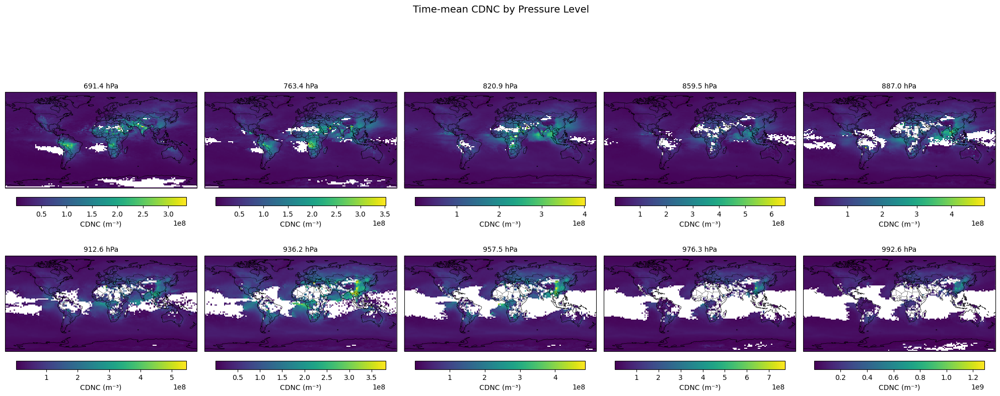

In [25]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Load data ────────────────────────────────────────────────
# ds already open
ds = ds.persist()

# ── Compute time-mean CDNC per level ────────────────────────
cdnc_mean = ds.mean('time')

# ── Plot ─────────────────────────────────────────────────────
levs = ds.lev.values
n_levs = len(levs)

fig, axes = plt.subplots(
    2, 5, figsize=(20, 8),
    subplot_kw={'projection': ccrs.PlateCarree()}
)
axes = axes.flatten()

for ax, lev_idx, lev in zip(axes, range(n_levs), levs):
    data = cdnc_mean.isel(lev=lev_idx).values

    # Mask zeros
    data = np.where(data > 0, data, np.nan)

    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='viridis',
        transform=ccrs.PlateCarree()
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10)

    plt.colorbar(im, ax=ax, orientation='horizontal',
                 pad=0.05, label='CDNC (m⁻³)', fraction=0.046)

fig.suptitle('Time-mean CDNC by Pressure Level', fontsize=14)
plt.tight_layout()
plt.show()

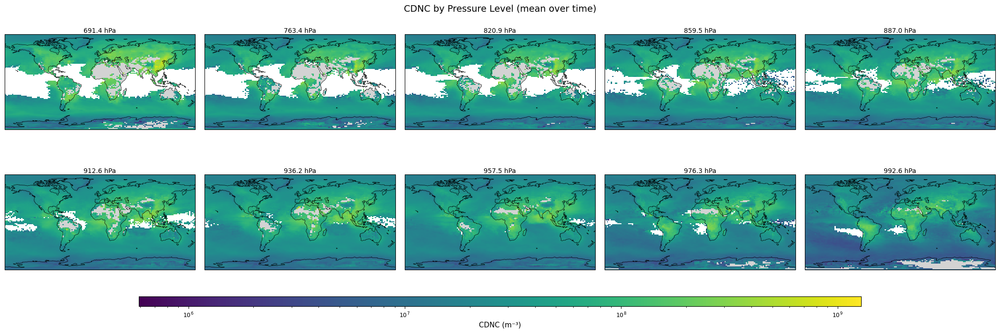

In [26]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Compute time-mean CDNC per level ────────────────────────
cdnc_mean = ds.mean('time')
levs = ds.lev.values

# ── Find global min/max for consistent colorbar ──────────────
vmin = float(cdnc_mean.where(cdnc_mean > 0).min())
vmax = float(cdnc_mean.where(cdnc_mean > 0).max())
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# ── Plot ─────────────────────────────────────────────────────
fig = plt.figure(figsize=(22, 7))

# Leave space at bottom for colorbar
gs = fig.add_gridspec(
    2, 5,
    hspace=0.15,    # vertical spacing between rows
    wspace=0.05,    # horizontal spacing between columns
    left=0.02, right=0.98,
    top=0.92, bottom=0.12
)

axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]

for ax, lev_idx, lev in zip(axes, range(len(levs)), levs):
    data = cdnc_mean.isel(lev=-lev_idx-1).values
    data = np.where(data > 0, data, np.nan)

    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='viridis',
        norm=norm,
        transform=ccrs.PlateCarree()
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

# ── Single shared colorbar ───────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.03])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal', norm=norm)
cb.set_label('CDNC (m⁻³)', fontsize=11)
cb.ax.tick_params(labelsize=9)

fig.suptitle('CDNC by Pressure Level (mean over time)', fontsize=14, y=0.97)
plt.show()

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Compute cloud frequency per grid cell ────────────────────
# Fraction of timesteps where CDNC is valid (non-NaN) per level
cloud_freq = ds.notnull().mean('time')  # (lev, lat, lon)

# Average frequency across all levels
cloud_freq_mean = cloud_freq.mean('lev')

# ── Plot per level + mean ────────────────────────────────────
fig = plt.figure(figsize=(22, 12))

gs = fig.add_gridspec(
    3, 5,
    hspace=0.15,
    wspace=0.05,
    left=0.02, right=0.98,
    top=0.92, bottom=0.10
)

# 10 level plots + 1 mean plot
axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]

# Add mean plot in centre of third row
ax_mean = fig.add_subplot(gs[2, 1:4], projection=ccrs.PlateCarree())

norm = plt.Normalize(vmin=0, vmax=1)

for ax, lev_idx, lev in zip(axes, range(len(levs)), levs):
    data = cloud_freq.isel(lev=lev_idx).values

    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='Blues',
        norm=norm,
        transform=ccrs.PlateCarree()
    )
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

# Mean across all levels
im = ax_mean.pcolormesh(
    ds.lon.values, ds.lat.values, cloud_freq_mean.values,
    cmap='Blues',
    norm=norm,
    transform=ccrs.PlateCarree()
)
ax_mean.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax_mean.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax_mean.set_title('Mean across all levels', fontsize=11, pad=3)

# ── Shared colorbar ──────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.7, 0.025])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cb.set_label('Cloud Droplet Frequency (fraction of time)', fontsize=11)
cb.ax.tick_params(labelsize=9)

fig.suptitle('Liquid Cloud Droplet Frequency by Pressure Level', fontsize=14, y=0.97)
plt.show()

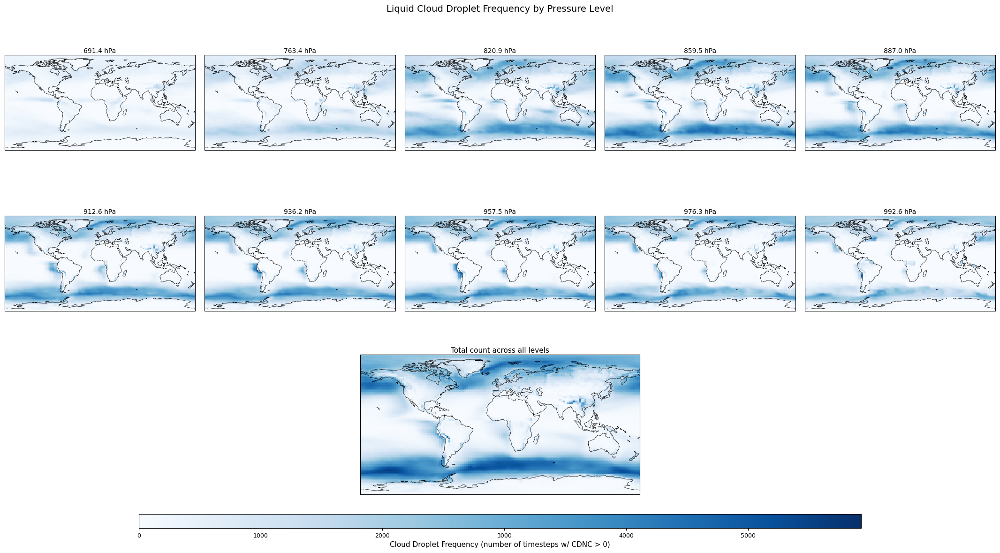

In [28]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Compute cloud frequency per grid cell ────────────────────
cloud_freq = ds.notnull().sum('time')  # (lev, lat, lon)
cloud_freq_mean = cloud_freq.sum('lev')

# ── Plot per level + mean ────────────────────────────────────
fig = plt.figure(figsize=(22, 12))
gs = fig.add_gridspec(
    3, 5,
    hspace=0.15, wspace=0.05,
    left=0.02, right=0.98,
    top=0.92, bottom=0.10
)

axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]
ax_mean = fig.add_subplot(gs[2, 1:4], projection=ccrs.PlateCarree())

# ── Fix: norm based on actual data range ────────────────────
vmax = int(cloud_freq.values.max())
norm = plt.Normalize(vmin=0, vmax=vmax)

for ax, lev_idx, lev in zip(axes, range(len(levs)), levs):
    data = cloud_freq.isel(lev=lev_idx).values
    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='Blues', norm=norm,
        transform=ccrs.PlateCarree()
    )
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

im = ax_mean.pcolormesh(
    ds.lon.values, ds.lat.values, cloud_freq_mean.values,
    cmap='Blues',
    norm=plt.Normalize(vmin=0, vmax=int(cloud_freq_mean.values.max())),  # separate norm for sum-across-levels
    transform=ccrs.PlateCarree()
)
ax_mean.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax_mean.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax_mean.set_title('Total count across all levels', fontsize=11, pad=3)

# ── Shared colorbar (uses per-level norm) ────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.7, 0.025])
sm = plt.cm.ScalarMappable(cmap='Blues', norm=norm)
cb = plt.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cb.set_label('Cloud Droplet Frequency (number of timesteps w/ CDNC > 0)', fontsize=11)
cb.ax.tick_params(labelsize=9)

fig.suptitle('Liquid Cloud Droplet Frequency by Pressure Level', fontsize=14, y=0.97)
plt.show()

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Binary mask: 1 where count > 200, 0 otherwise ───────────
cloud_freq = ds.notnull().sum('time')  # (lev, lat, lon)
cloud_freq_binary = (cloud_freq >= 200).astype(float)  # (lev, lat, lon)
cloud_freq_mean_binary = (cloud_freq.sum('lev') > 200).astype(float)

# ── Binary colormap ──────────────────────────────────────────
cmap = mcolors.ListedColormap(['#d0e7f9', '#08519c'])  # light blue / dark blue
norm = mcolors.BoundaryNorm([0, 0.5, 1], ncolors=2)

fig = plt.figure(figsize=(22, 12))
gs = fig.add_gridspec(
    3, 5,
    hspace=0.15, wspace=0.05,
    left=0.02, right=0.98,
    top=0.92, bottom=0.10
)
axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]
ax_mean = fig.add_subplot(gs[2, 1:4], projection=ccrs.PlateCarree())

for ax, lev_idx, lev in zip(axes, range(len(levs)), levs):
    data = cloud_freq_binary.isel(lev=lev_idx).values
    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap=cmap, norm=norm,
        transform=ccrs.PlateCarree()
    )
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

im = ax_mean.pcolormesh(
    ds.lon.values, ds.lat.values, cloud_freq_mean_binary.values,
    cmap=cmap, norm=norm,
    transform=ccrs.PlateCarree()
)
ax_mean.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax_mean.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax_mean.set_title('Total count > 200 across all levels', fontsize=11, pad=3)

# ── Binary colorbar ──────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.7, 0.025])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal', ticks=[0.25, 0.75])
cb.ax.set_xticklabels(['≤ 200 timesteps', '> 200 timesteps'], fontsize=10)
cb.set_label('CDNC occurrence threshold', fontsize=11)

fig.suptitle('Liquid Cloud Droplet Frequency by Pressure Level (threshold: 200 timesteps)',
             fontsize=14, y=0.97)
plt.show()

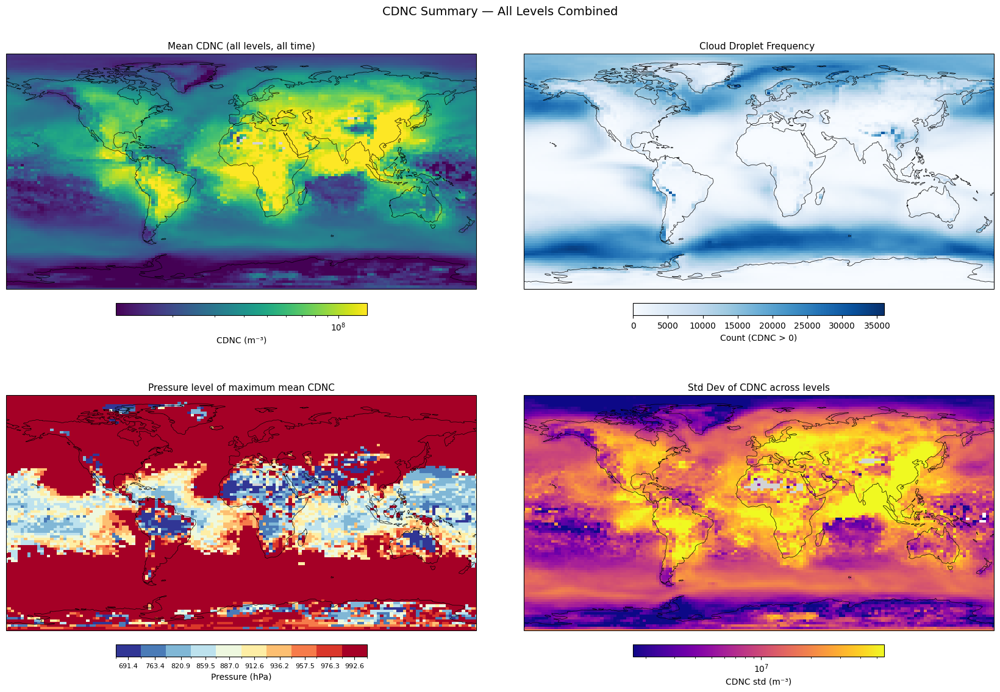

In [30]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(
    2, 2,
    hspace=0.25, wspace=0.1,
    left=0.05, right=0.95,
    top=0.92, bottom=0.08
)

axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(2)]

# ── 1. Mean CDNC across all levels and time ──────────────────
cdnc_mean_all = ds.mean('time').mean('lev')
data = cdnc_mean_all.values
data = np.where(data > 0, data, np.nan)

im1 = axes[0].pcolormesh(
    ds.lon.values, ds.lat.values, data,
    cmap='viridis',
    norm=mcolors.LogNorm(vmin=np.nanpercentile(data, 5),
                         vmax=np.nanpercentile(data, 95)),
    transform=ccrs.PlateCarree()
)
axes[0].add_feature(cfeature.COASTLINE, linewidth=0.5)
axes[0].add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
axes[0].set_title('Mean CDNC (all levels, all time)', fontsize=11)
plt.colorbar(im1, ax=axes[0], orientation='horizontal',
             pad=0.05, label='CDNC (m⁻³)', fraction=0.046)

# ── 2. Cloud frequency across all levels ─────────────────────
cloud_freq_all = ds.notnull().sum('time').sum('lev')
vmax = int(cloud_freq_all.values.max())

im2 = axes[1].pcolormesh(
    ds.lon.values, ds.lat.values, cloud_freq_all.values,
    cmap='Blues',
    vmin=0, vmax=vmax,
    transform=ccrs.PlateCarree()
)
axes[1].add_feature(cfeature.COASTLINE, linewidth=0.5)
axes[1].add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
axes[1].set_title('Cloud Droplet Frequency ', fontsize=11)
plt.colorbar(im2, ax=axes[1], orientation='horizontal',
             pad=0.05, label='Count (CDNC > 0)', fraction=0.046)

# ── 3. Level of maximum CDNC ─────────────────────────────────
cdnc_mean_time = ds.mean('time')  # (lev, lat, lon)
lev_max_idx = cdnc_mean_time.fillna(0).argmax('lev')
lev_max = ds.lev.values[lev_max_idx.values]
lev_max = np.where(cdnc_mean_time.max('lev').values > 0, lev_max, np.nan)

# ── Discrete colormap with one colour per level ──────────────
levs = ds.lev.values  # your 10 pressure levels
n = len(levs)
cmap = plt.get_cmap('RdYlBu_r', n)

# Boundaries sit between levels (plus outer edges)
boundaries = np.concatenate([
    [levs[0] - (levs[1] - levs[0]) / 2],
    (levs[:-1] + levs[1:]) / 2,
    [levs[-1] + (levs[-1] - levs[-2]) / 2]
])
norm = mcolors.BoundaryNorm(boundaries, ncolors=n)

im3 = axes[2].pcolormesh(
    ds.lon.values, ds.lat.values, lev_max,
    cmap=cmap, norm=norm,
    transform=ccrs.PlateCarree()
)
axes[2].add_feature(cfeature.COASTLINE, linewidth=0.5)
axes[2].add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
axes[2].set_title('Pressure level of maximum mean CDNC', fontsize=11)

cb = plt.colorbar(im3, ax=axes[2], orientation='horizontal',
                  pad=0.05, fraction=0.046, ticks=levs)
cb.set_label('Pressure (hPa)')
cb.ax.set_xticklabels([f'{l:.1f}' for l in levs], fontsize=8)

# ── 4. Standard deviation of CDNC across levels ──────────────
cdnc_std = ds.mean('time').std('lev')
data_std = cdnc_std.values
data_std = np.where(data_std > 0, data_std, np.nan)

im4 = axes[3].pcolormesh(
    ds.lon.values, ds.lat.values, data_std,
    cmap='plasma',
    norm=mcolors.LogNorm(vmin=np.nanpercentile(data_std, 5),
                         vmax=np.nanpercentile(data_std, 95)),
    transform=ccrs.PlateCarree()
)
axes[3].add_feature(cfeature.COASTLINE, linewidth=0.5)
axes[3].add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
axes[3].set_title('Std Dev of CDNC across levels', fontsize=11)
plt.colorbar(im4, ax=axes[3], orientation='horizontal',
             pad=0.05, label='CDNC std (m⁻³)', fraction=0.046)

fig.suptitle('CDNC Summary — All Levels Combined', fontsize=14, y=0.97)
plt.show()

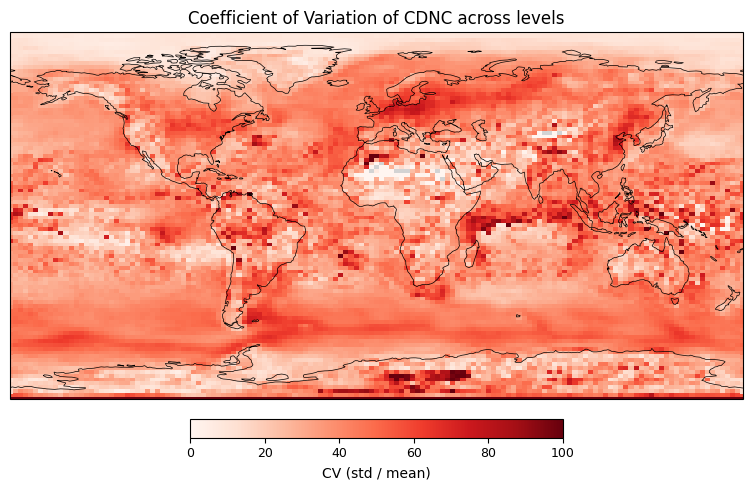

In [49]:
# ── Coefficient of variation (std / mean) across levels ──────
cdnc_time_mean = ds.mean('time')      # (lev, lat, lon)
cdnc_lev_mean  = cdnc_time_mean.mean('lev')   # (lat, lon)
cdnc_lev_std   = cdnc_time_mean.std('lev')    # (lat, lon)

cv = (cdnc_lev_std / cdnc_lev_mean).values*100
cv = np.where(cdnc_lev_mean.values > 0, cv, np.nan)

fig, ax = plt.subplots(figsize=(10, 5),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = ax.pcolormesh(
    ds.lon.values, ds.lat.values, cv,
    cmap='Reds',
    vmin=0, vmax=100,
    transform=ccrs.PlateCarree()
)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax.set_title('Coefficient of Variation of CDNC across levels', fontsize=12)

cb = plt.colorbar(im, ax=ax, orientation='horizontal',
                  pad=0.05, fraction=0.046, label='CV (std / mean)')
cb.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()

In [37]:
from pathlib import Path
SUSC_DIR = Path('/share/pech2273/susceptibility')

ds_combined = xr.open_dataset(SUSC_DIR / 'susceptibility_all_levels_combined.nc')
ds_alllevels = xr.open_dataset(SUSC_DIR/'susceptibility_all_levels.nc')

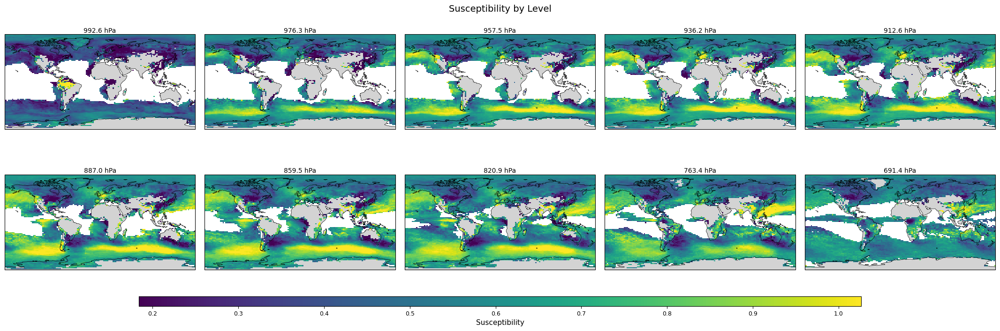

In [33]:
fig = plt.figure(figsize=(22, 7))
ds4graph = ds_combined.sel(radius = 40, method = 'nearest').isel(updraft_q = 3)
SUSCEPTIBILITY = ds4graph.slope
# ── Compute shared norm across all levels ────────────────────
all_data = SUSCEPTIBILITY.values
vmin = np.nanpercentile(all_data.ravel(), 2)
vmax = np.nanpercentile(all_data.ravel(), 98)
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

gs = fig.add_gridspec(
    2, 5,
    hspace=0.15, wspace=0.05,
    left=0.02, right=0.98,
    top=0.92, bottom=0.12
)

axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]

# Reverse levs so we start from the highest index (lowest level) and count down
levs_reversed = levs[::-1]

for ax, lev_idx, lev in zip(axes, range(len(levs_reversed)), levs_reversed):
    data = SUSCEPTIBILITY.isel(lev=-(lev_idx+1)).values.astype(float)
    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='viridis',
        norm=norm,
        transform=ccrs.PlateCarree()
    )
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

# ── Single shared colorbar ───────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.03])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cb.set_label('Susceptibility', fontsize=11)
cb.ax.tick_params(labelsize=9)

fig.suptitle('Susceptibility by Level', fontsize=14, y=0.97)
plt.show()

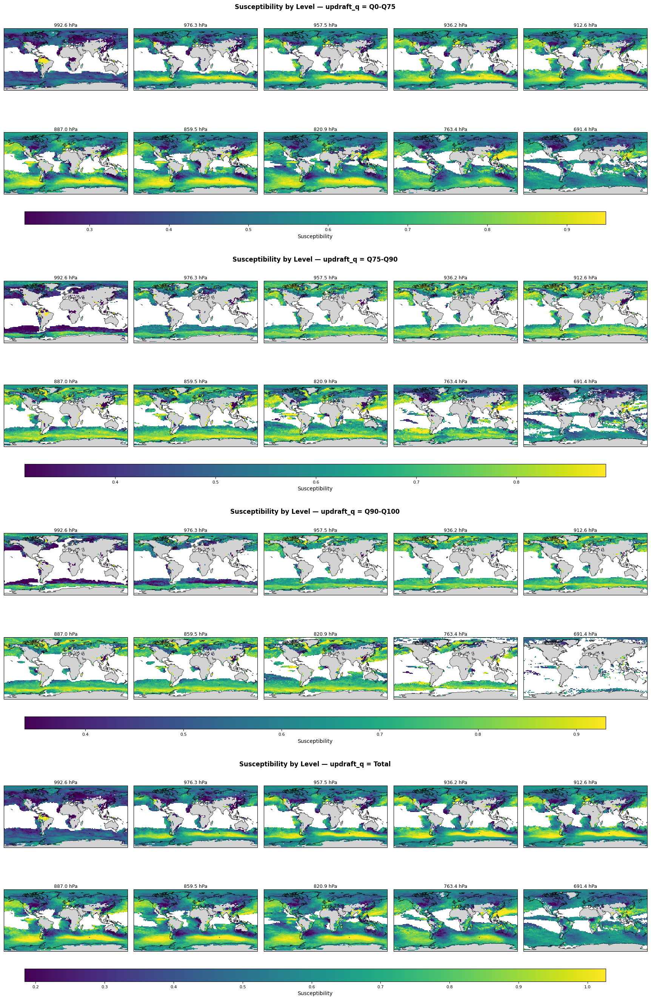

In [34]:
fig = plt.figure(figsize=(22, 28))
ds4graph_base = ds_combined.sel(radius=40, method='nearest')

updraft_labels = ds_combined.updraft_q.values  # get all updraft_q values

outer_gs = fig.add_gridspec(4, 1, hspace=0.3, top=0.95, bottom=0.05)

for q_idx, updraft_val in enumerate(updraft_labels):
    ds4graph = ds4graph_base.isel(updraft_q=q_idx)
    SUSCEPTIBILITY = ds4graph.slope

    all_data = SUSCEPTIBILITY.values
    vmin = np.nanpercentile(all_data.ravel(), 2)
    vmax = np.nanpercentile(all_data.ravel(), 98)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    inner_gs = outer_gs[q_idx].subgridspec(
        2, 5, hspace=0.15, wspace=0.05
    )
    axes = [fig.add_subplot(inner_gs[i, j], projection=ccrs.PlateCarree())
            for i in range(2) for j in range(5)]

    levs_reversed = levs[::-1]
    for ax, lev_idx, lev in zip(axes, range(len(levs_reversed)), levs_reversed):
        data = SUSCEPTIBILITY.isel(lev=-(lev_idx+1)).values.astype(float)
        im = ax.pcolormesh(
            ds.lon.values, ds.lat.values, data,
            cmap='viridis', norm=norm,
            transform=ccrs.PlateCarree()
        )
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
        ax.set_title(f'{lev:.1f} hPa', fontsize=9, pad=3)

    # Colorbar per row
    cbar_ax = fig.add_axes([
        0.15,
        outer_gs[q_idx].get_position(fig).y0 - 0.015,
        0.7, 0.012
    ])
    cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cb.set_label('Susceptibility', fontsize=10)
    cb.ax.tick_params(labelsize=8)

    fig.text(0.5,
             outer_gs[q_idx].get_position(fig).y1 + 0.005,
             f'Susceptibility by Level — updraft_q = {updraft_val}',
             ha='center', fontsize=12, fontweight='bold')

plt.show()


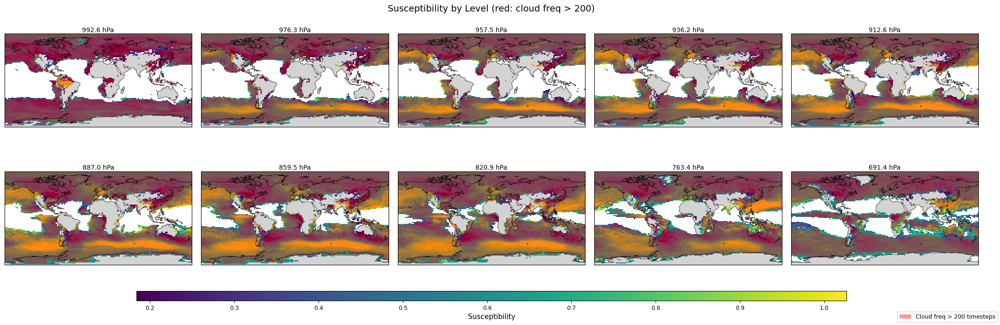

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fig = plt.figure(figsize=(22, 7))
ds4graph = ds_combined.sel(radius=40, method='nearest').isel(updraft_q=3)
SUSCEPTIBILITY = ds4graph.slope

# ── Cloud frequency mask ─────────────────────────────────────
cloud_freq = ds.notnull().sum('time')  # (lev, lat, lon)

# ── Shared norm for susceptibility ───────────────────────────
all_data = SUSCEPTIBILITY.values.astype(float)
vmin = np.nanpercentile(all_data.ravel(), 2)
vmax = np.nanpercentile(all_data.ravel(), 98)
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

gs = fig.add_gridspec(
    2, 5,
    hspace=0.15, wspace=0.05,
    left=0.02, right=0.98,
    top=0.92, bottom=0.12
)
axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(5)]

levs_reversed = levs[::-1]

for ax, lev_idx, lev in zip(axes, range(len(levs_reversed)), levs_reversed):
    data = SUSCEPTIBILITY.isel(lev=-(lev_idx+1)).values.astype(float)

    im = ax.pcolormesh(
        ds.lon.values, ds.lat.values, data,
        cmap='viridis', norm=norm,
        transform=ccrs.PlateCarree()
    )

    # ── Red overlay where cloud_freq > 200 ──────────────────
    freq_data = cloud_freq.isel(lev=-(lev_idx+1)).values.astype(float)
    mask = np.where(freq_data >= 200, 1.0, np.nan)
    ax.pcolormesh(
        ds.lon.values, ds.lat.values, mask,
        cmap=mcolors.ListedColormap(['red']),
        vmin=0.5, vmax=1.5,
        alpha=0.4,
        transform=ccrs.PlateCarree()
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'{lev:.1f} hPa', fontsize=10, pad=3)

# ── Shared colorbar ──────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.03])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cb.set_label('Susceptibility', fontsize=11)
cb.ax.tick_params(labelsize=9)

# ── Legend ───────────────────────────────────────────────────
fig.legend(
    handles=[mpatches.Patch(facecolor='red', alpha=0.4,
                            label='Cloud freq > 200 timesteps')],
    loc='lower right', fontsize=9, framealpha=0.8
)

fig.suptitle('Susceptibility by Level (red: cloud freq > 200)', fontsize=14, y=0.97)
plt.show()

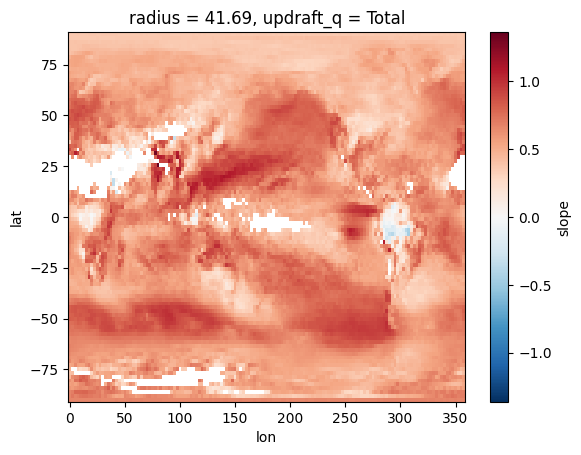

In [42]:
.plot()

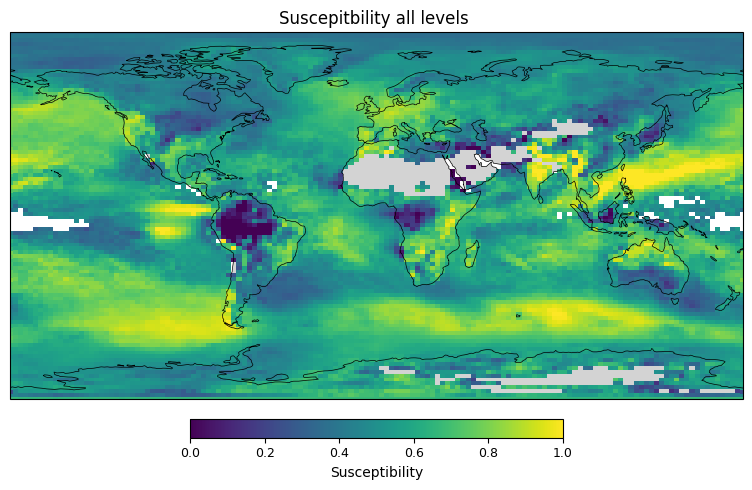

In [45]:
# ── Total Susceptibility ──────
graphing = ds_alllevels.slope.sel(radius=40, method='nearest').sel(updraft_q='Total')

fig, ax = plt.subplots(figsize=(10, 5),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = ax.pcolormesh(
    graphing.lon.values, graphing.lat.values, graphing,
    cmap='viridis',
    vmin=0, vmax=1,
    transform=ccrs.PlateCarree()
)
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax.set_title('Suscepitbility all levels ', fontsize=12)

cb = plt.colorbar(im, ax=ax, orientation='horizontal',
                  pad=0.05, fraction=0.046, label='Susceptibility')
cb.ax.tick_params(labelsize=9)

plt.tight_layout()
plt.show()

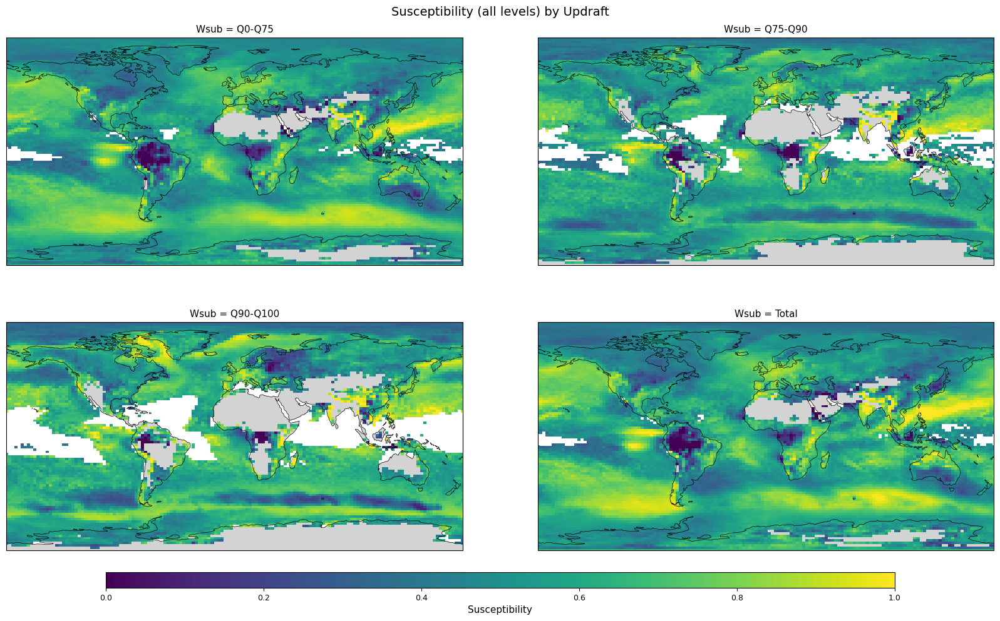

In [47]:
fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(2, 2, hspace=0.25, wspace=0.1,
                      left=0.05, right=0.95, top=0.92, bottom=0.1)

updraft_vals = ds_alllevels.updraft_q.values

axes = [fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        for i in range(2) for j in range(2)]

for ax, uq in zip(axes, updraft_vals):
    graphing = ds_alllevels.slope.sel(radius=40, method='nearest').sel(updraft_q=uq)

    im = ax.pcolormesh(
        graphing.lon.values, graphing.lat.values, graphing,
        cmap='viridis',
        vmin=0, vmax=1,
        transform=ccrs.PlateCarree()
    )
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    ax.set_title(f'Wsub = {uq}', fontsize=11)

# ── Shared colorbar ──────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.7, 0.025])
cb = plt.colorbar(im, cax=cbar_ax, orientation='horizontal')
cb.set_label('Susceptibility', fontsize=11)
cb.ax.tick_params(labelsize=9)

fig.suptitle('Susceptibility (all levels) by Updraft', fontsize=14, y=0.97)
plt.show()

In [57]:
print(ds_alllevels.slope.sel(updraft_q = 'Total'))

<xarray.DataArray 'slope' (lat: 96, lon: 144, radius: 21)> Size: 2MB
[290304 values with dtype=float64]
Coordinates:
  * lat        (lat) float64 768B -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * lon        (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * radius     (radius) float64 168B 1.0 1.365 1.862 2.541 ... 269.2 367.3 501.2
    updraft_q  <U8 32B 'Total'


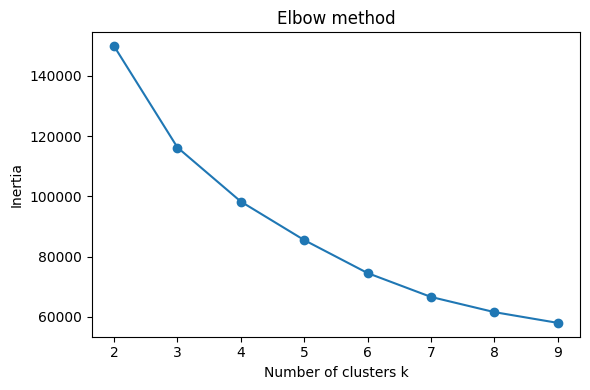

In [58]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Extract data ─────────────────────────────────────────────
data = ds_alllevels.slope.sel(updraft_q='Total')  # (lat, lon, radius)

lat = data.lat.values
lon = data.lon.values
radius = data.radius.values

# Reshape to (n_gridpoints, n_radius) = (96*144, 21)
vals = data.values.reshape(-1, len(radius))  # (13824, 21)

# ── Handle NaNs ──────────────────────────────────────────────
nan_mask = np.any(np.isnan(vals), axis=1)  # True where any radius is NaN
valid_mask = ~nan_mask

vals_valid = vals[valid_mask]  # only non-NaN grid points

# ── Standardize features (optional but recommended) ──────────
scaler = StandardScaler()
vals_scaled = scaler.fit_transform(vals_valid)

# ── Choose k with elbow method ───────────────────────────────
inertias = []
k_range = range(2, 10)
for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(vals_scaled)
    inertias.append(km.inertia_)

plt.figure(figsize=(6, 4))
plt.plot(k_range, inertias, 'o-')
plt.xlabel('Number of clusters k')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.tight_layout()
plt.show()

k=2: silhouette=0.3915
k=3: silhouette=0.2954
k=4: silhouette=0.2931
k=5: silhouette=0.2928
k=6: silhouette=0.2761
k=7: silhouette=0.2819
k=8: silhouette=0.2529
k=9: silhouette=0.2504


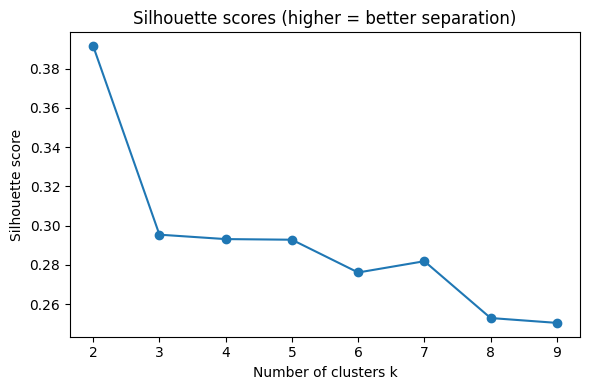

In [59]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
k_range = range(2, 10)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(vals_scaled)
    score = silhouette_score(vals_scaled, labels, sample_size=5000)  # sample for speed
    silhouette_scores.append(score)
    print(f"k={k}: silhouette={score:.4f}")

plt.figure(figsize=(6, 4))
plt.plot(k_range, silhouette_scores, 'o-')
plt.xlabel('Number of clusters k')
plt.ylabel('Silhouette score')
plt.title('Silhouette scores (higher = better separation)')
plt.tight_layout()
plt.show()

/tmp/ipykernel_459229/526624974.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', k)
/tmp/ipykernel_459229/526624974.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', k)


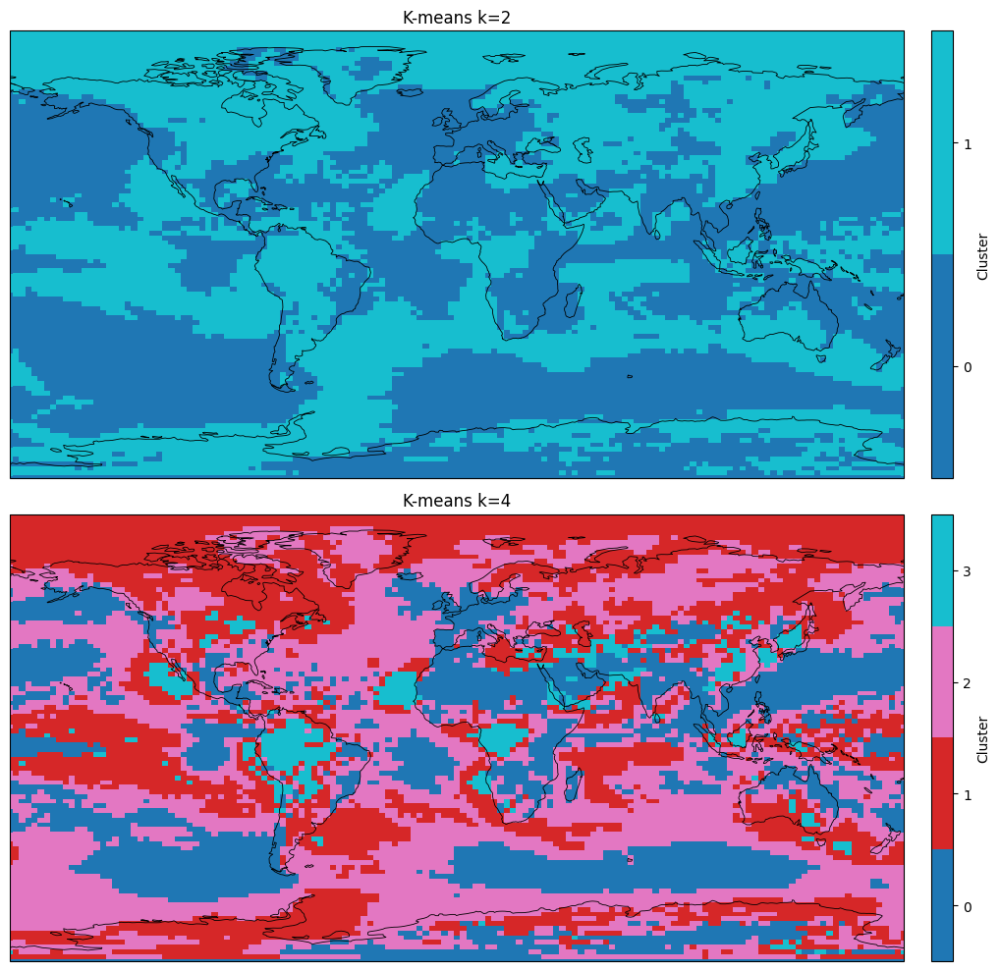

In [60]:
fig, axes = plt.subplots(2, 1, figsize=(14, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})

for ax, k in zip(axes, [2, 4]):
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels_valid = km.fit_predict(vals_scaled)

    labels_full = np.full(len(nan_mask), -1)
    labels_full[valid_mask] = labels_valid
    labels_2d = labels_full.reshape(len(lat), len(lon))

    cmap = plt.cm.get_cmap('tab10', k)
    im = ax.pcolormesh(lon, lat, labels_2d,
                       cmap=cmap, vmin=-0.5, vmax=k - 0.5,
                       transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    cb = plt.colorbar(im, ax=ax, ticks=range(k), pad=0.02)
    cb.set_label('Cluster')
    ax.set_title(f'K-means k={k}')

plt.tight_layout()
plt.show()

Total grid points:         13824
All-NaN grid points:         560 (4.1%)
Partially-NaN points:          0 (0.0%)
Fully valid grid points:   13264 (95.9%)


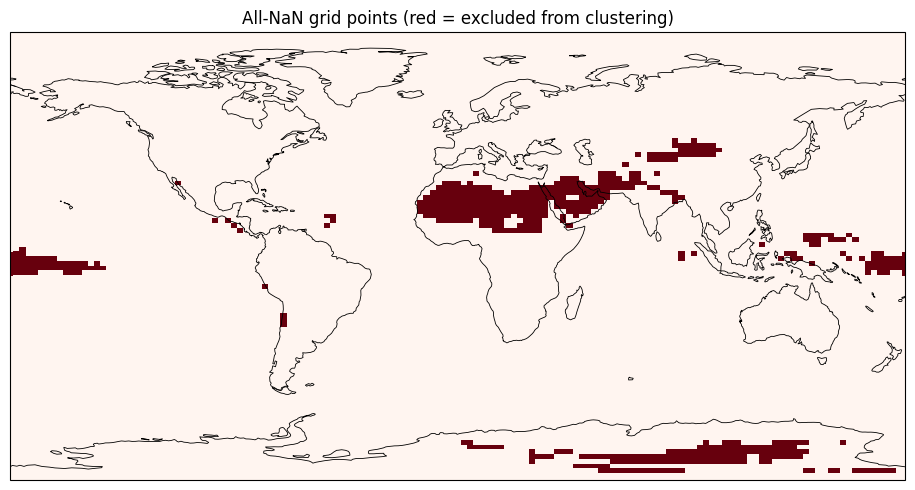

In [61]:
# ── Count NaN grid points ─────────────────────────────────────
data = ds_alllevels.slope.sel(updraft_q='Total')
vals = data.values.reshape(-1, len(radius))  # (13824, 21)

# Different NaN categories
all_nan = np.all(np.isnan(vals), axis=1)       # ALL radius values are NaN
any_nan = np.any(np.isnan(vals), axis=1)       # ANY radius value is NaN
fully_valid = ~any_nan                          # No NaNs at all

print(f"Total grid points:        {len(vals):>6}")
print(f"All-NaN grid points:      {all_nan.sum():>6} ({100*all_nan.mean():.1f}%)")
print(f"Partially-NaN points:     {(any_nan & ~all_nan).sum():>6} ({100*(any_nan & ~all_nan).mean():.1f}%)")
print(f"Fully valid grid points:  {fully_valid.sum():>6} ({100*fully_valid.mean():.1f}%)")

# ── Where are the all-NaN points spatially? ───────────────────
all_nan_2d = all_nan.reshape(len(lat), len(lon))

fig, ax = plt.subplots(figsize=(12, 5),
                       subplot_kw={'projection': ccrs.PlateCarree()})
ax.pcolormesh(lon, lat, all_nan_2d.astype(float),
              cmap='Reds', vmin=0, vmax=1,
              transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax.set_title('All-NaN grid points (red = excluded from clustering)')
plt.tight_layout()
plt.show()

In [63]:
from shapely.geometry import Point
from shapely.ops import unary_union
import cartopy.feature as cfeature

# ── Build land mask using cartopy geometries ──────────────────
land_geom = unary_union(list(cfeature.LAND.geometries()))

all_nan_2d = all_nan.reshape(len(lat), len(lon))

# Check each NaN grid point
nan_lat_idx, nan_lon_idx = np.where(all_nan_2d)
nan_lats = lat[nan_lat_idx]
nan_lons = lon[nan_lon_idx]

# Adjust lons from 0-360 to -180-180 for shapely
nan_lons_180 = np.where(nan_lons > 180, nan_lons - 360, nan_lons)

over_land  = np.array([land_geom.contains(Point(lo, la)) 
                       for lo, la in zip(nan_lons_180, nan_lats)])
over_ocean = ~over_land

print(f"Total NaN grid points: {len(nan_lats)}")
print(f"Over land:  {over_land.sum():>4} ({100*over_land.mean():.1f}%)")
print(f"Over ocean: {over_ocean.sum():>4} ({100*over_ocean.mean():.1f}%)")

Total NaN grid points: 560
Over land:   436 (77.9%)
Over ocean:  124 (22.1%)


In [65]:
# ── Check what's happening with NaN points ────────────────────
labels_full = np.full(len(nan_mask), -1)  # initialise all as -1
labels_full[valid_mask] = labels_valid    # only fill valid points

labels_2d = labels_full.reshape(len(lat), len(lon))

# Verify NaN points are truly -1
print("Labels at NaN locations:", np.unique(labels_2d[all_nan_2d]))
print("Labels at valid locations:", np.unique(labels_2d[~all_nan_2d]))

Labels at NaN locations: [-1]
Labels at valid locations: [0 1 2 3]


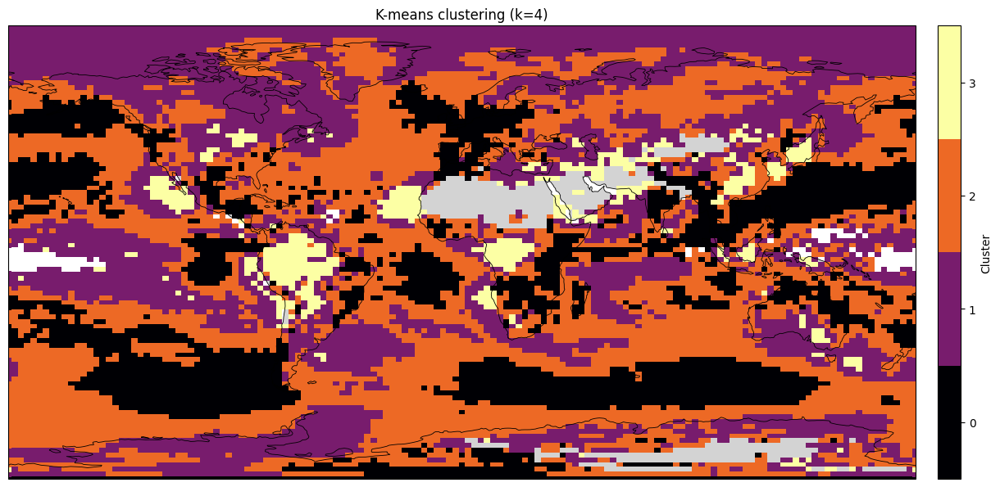

In [98]:
import matplotlib as mpl

# Fix 1: updated get_cmap syntax
cmap = mpl.colormaps['inferno'].resampled(k)

# Fix 2: set bad color with full transparency for cartopy compatibility
cmap.set_bad(alpha=0)  # fully transparent instead of white

fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

labels_2d_masked = np.ma.masked_where(labels_2d == -1, labels_2d)

im = ax.pcolormesh(lon, lat, labels_2d_masked,
                   cmap=cmap, vmin=-0.5, vmax=k - 0.5,
                   transform=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

cb = plt.colorbar(im, ax=ax, ticks=range(k), pad=0.02)
cb.set_label('Cluster')
ax.set_title(f'K-means clustering (k={k})')
plt.tight_layout()
plt.show()

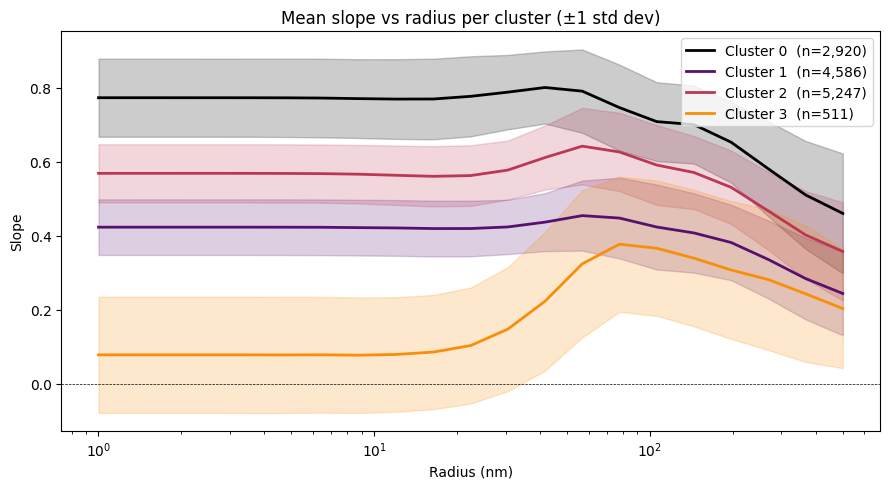

In [99]:
fig, ax = plt.subplots(figsize=(9, 5))

for i in range(k):
    # Get original (unscaled) values for this cluster
    cluster_vals = vals_valid[labels_valid == i]  # (n_points_in_cluster, 21)
    
    mean = cluster_vals.mean(axis=0)
    std  = cluster_vals.std(axis=0)
    n    = (labels_valid == i).sum()
    
    color = mpl.colormaps['inferno'](i / k)
    
    ax.plot(radius, mean, color=color, linewidth=2,
            label=f'Cluster {i}  (n={n:,})')
    ax.fill_between(radius, mean - std, mean + std,
                    color=color, alpha=0.2)

ax.set_xscale('log')
ax.set_xlabel('Radius (nm)')
ax.set_ylabel('Slope')
ax.set_title('Mean slope vs radius per cluster (±1 std dev)')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

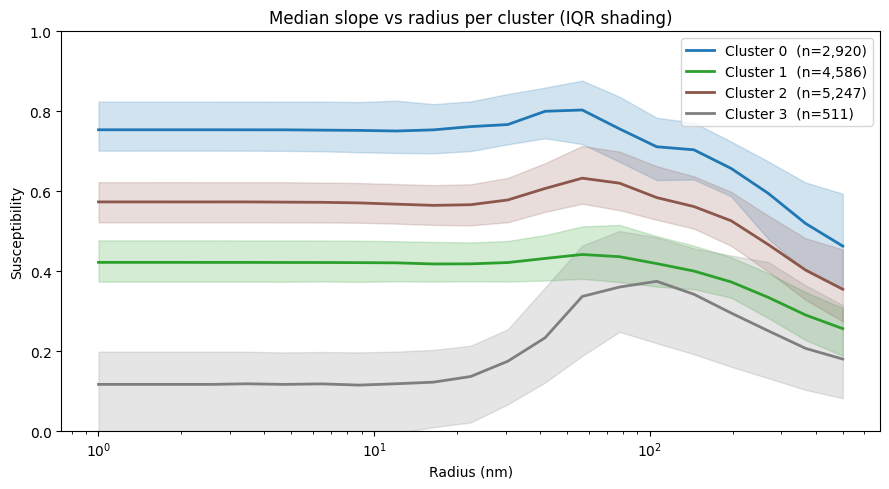

In [80]:
fig, ax = plt.subplots(figsize=(9, 5))

for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]  # (n_points_in_cluster, 21)
    
    median = np.median(cluster_vals, axis=0)
    q25  = np.percentile(cluster_vals, 25, axis=0)
    q75  = np.percentile(cluster_vals, 75, axis=0)
    n    = (labels_valid == i).sum()
    
    color = mpl.colormaps['tab10'](i / k)
    
    ax.plot(radius, median, color=color, linewidth=2,
            label=f'Cluster {i}  (n={n:,})')
    ax.fill_between(radius, q25, q75,
                    color=color, alpha=0.2)
ax.set_ylim([0,1])
ax.set_xscale('log')
ax.set_xlabel('Radius (nm)')
ax.set_ylabel('Susceptibility')
ax.set_title('Median slope vs radius per cluster (IQR shading)')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

Optimal diameter maximizing mean slope:

  Cluster 0 (n=2,920): diameter = 83.4 nm, slope = 0.8009
  Cluster 1 (n=4,586): diameter = 113.8 nm, slope = 0.4543
  Cluster 2 (n=5,247): diameter = 113.8 nm, slope = 0.6422
  Cluster 3 (n=511): diameter = 155.2 nm, slope = 0.3770

  Overall (n=13,264): diameter = 113.8 nm, slope = 0.5977


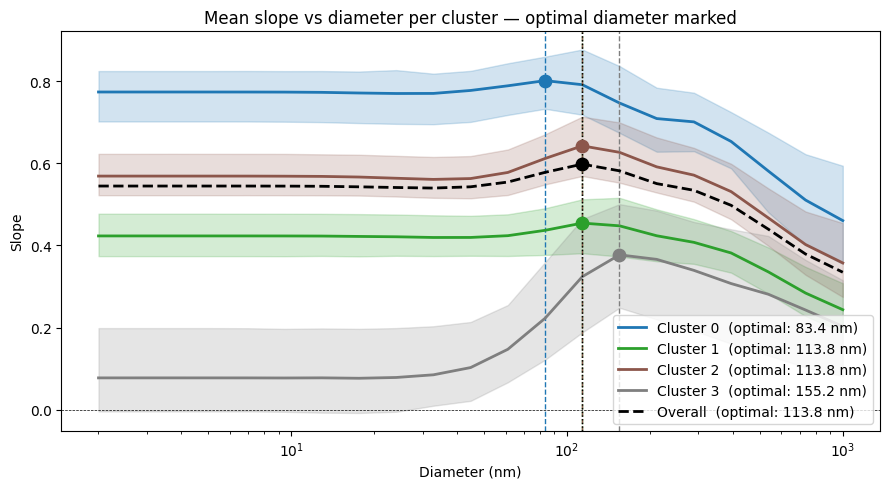

In [107]:
diameter = radius * 2  # nm

print("Optimal diameter maximizing mean slope:\n")

fig, ax = plt.subplots(figsize=(9, 5))

for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean = cluster_vals.mean(axis=0)
    q25  = np.percentile(cluster_vals, 25, axis=0)
    q75  = np.percentile(cluster_vals, 75, axis=0)

    optimal_idx      = np.argmax(mean)
    optimal_diameter = diameter[optimal_idx]
    optimal_slope    = mean[optimal_idx]

    print(f"  Cluster {i} (n={(labels_valid==i).sum():,}): "
          f"diameter = {optimal_diameter:.1f} nm, slope = {optimal_slope:.4f}")

    color = mpl.colormaps['tab10'](i / k)
    ax.plot(diameter, mean, color=color, linewidth=2,
            label=f'Cluster {i}  (optimal: {optimal_diameter:.1f} nm)')
    ax.fill_between(diameter, q25, q75, color=color, alpha=0.2)
    ax.axvline(optimal_diameter, color=color, linewidth=1, linestyle='--')
    ax.scatter(optimal_diameter, optimal_slope, color=color, s=80, zorder=5)

# ── Overall ───────────────────────────────────────────────────
overall_mean      = vals_valid.mean(axis=0)
overall_opt_idx   = np.argmax(overall_mean)
overall_opt_diam  = diameter[overall_opt_idx]
overall_opt_slope = overall_mean[overall_opt_idx]

print(f"\n  Overall (n={len(vals_valid):,}): "
      f"diameter = {overall_opt_diam:.1f} nm, slope = {overall_opt_slope:.4f}")

ax.plot(diameter, overall_mean, color='black', linewidth=2,
        linestyle='--', label=f'Overall  (optimal: {overall_opt_diam:.1f} nm)')
ax.axvline(overall_opt_diam, color='black', linewidth=1, linestyle=':')
ax.scatter(overall_opt_diam, overall_opt_slope, color='black', s=80, zorder=5)

ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Slope')
ax.set_title('Mean slope vs diameter per cluster — optimal diameter marked')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

In [109]:
mean

array([0.07756679, 0.07756711, 0.07758257, 0.07755296, 0.07752388,
       0.07732372, 0.07765721, 0.07664585, 0.07854873, 0.08506046,
       0.10268815, 0.14717558, 0.22262392, 0.32382389, 0.37696537,
       0.36597336, 0.33918522, 0.30708836, 0.28107675, 0.2427195 ,
       0.20292127])

In [84]:
for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean = cluster_vals.mean(axis=0)
    q25  = np.percentile(cluster_vals, 25, axis=0)
    q75  = np.percentile(cluster_vals, 75, axis=0)
    iqr  = q75 - q25

    optimal_idx      = np.argmax(mean)
    optimal_diameter = diameter[optimal_idx]

    print(f"Cluster {i}: optimal diameter = {optimal_diameter:.1f} nm, "
          f"IQR at peak = {iqr[optimal_idx]:.4f}, "
          f"mean IQR across all diameters = {iqr.mean():.4f}")

Cluster 0: optimal diameter = 83.4 nm, IQR at peak = 0.1268, mean IQR across all diameters = 0.1441
Cluster 1: optimal diameter = 113.8 nm, IQR at peak = 0.1312, mean IQR across all diameters = 0.1095
Cluster 2: optimal diameter = 113.8 nm, IQR at peak = 0.1444, mean IQR across all diameters = 0.1191
Cluster 3: optimal diameter = 155.2 nm, IQR at peak = 0.2521, mean IQR across all diameters = 0.2266


Optimal diameter maximizing mean slope:

  Cluster 0 (n=2,920): diameter = 61.1 nm, slope = 0.7884
  Cluster 1 (n=4,586): diameter = 113.8 nm, slope = 0.4543
  Cluster 2 (n=5,247): diameter = 113.8 nm, slope = 0.6422
  Cluster 3 (n=511): diameter = 211.9 nm, slope = 0.3660

  Overall (n=13,264): diameter = 113.8 nm, slope = 0.5977


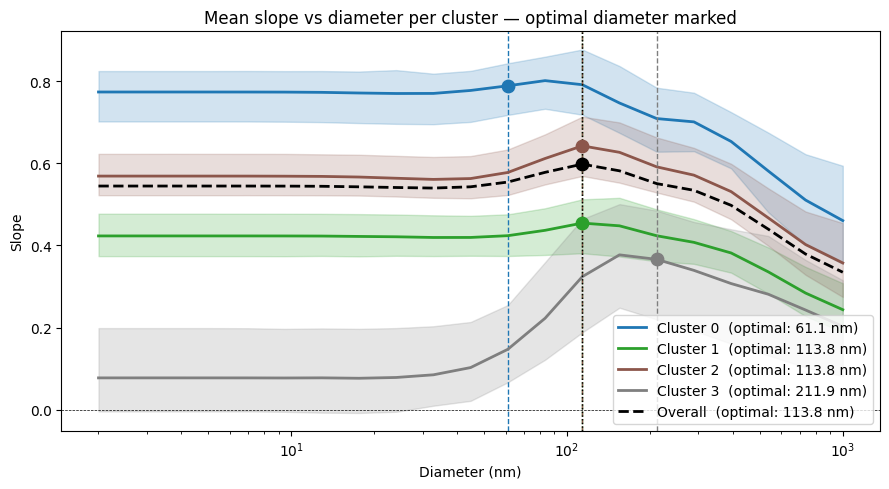

In [86]:
from scipy.ndimage import gaussian_filter1d

print("Optimal diameter maximizing mean slope:\n")

fig, ax = plt.subplots(figsize=(9, 5))

for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean         = cluster_vals.mean(axis=0)
    q25          = np.percentile(cluster_vals, 25, axis=0)
    q75          = np.percentile(cluster_vals, 75, axis=0)

    # Smooth BEFORE finding optimum
    mean_smooth      = gaussian_filter1d(mean, sigma=1.5)
    optimal_idx      = np.argmax(mean_smooth)       # uses smoothed
    optimal_diameter = diameter[optimal_idx]
    optimal_slope    = mean[optimal_idx]            # report raw value at that point

    print(f"  Cluster {i} (n={(labels_valid==i).sum():,}): "
          f"diameter = {optimal_diameter:.1f} nm, slope = {optimal_slope:.4f}")

    color = mpl.colormaps['tab10'](i / k)
    ax.plot(diameter, mean, color=color, linewidth=2,
            label=f'Cluster {i}  (optimal: {optimal_diameter:.1f} nm)')
    ax.fill_between(diameter, q25, q75, color=color, alpha=0.2)
    ax.axvline(optimal_diameter, color=color, linewidth=1, linestyle='--')
    ax.scatter(optimal_diameter, optimal_slope, color=color, s=80, zorder=5)

# ── Overall ───────────────────────────────────────────────────
overall_mean        = vals_valid.mean(axis=0)
overall_mean_smooth = gaussian_filter1d(overall_mean, sigma=1.5)
overall_opt_idx     = np.argmax(overall_mean_smooth)
overall_opt_diam    = diameter[overall_opt_idx]
overall_opt_slope   = overall_mean[overall_opt_idx]

print(f"\n  Overall (n={len(vals_valid):,}): "
      f"diameter = {overall_opt_diam:.1f} nm, slope = {overall_opt_slope:.4f}")

ax.plot(diameter, overall_mean, color='black', linewidth=2,
        linestyle='--', label=f'Overall  (optimal: {overall_opt_diam:.1f} nm)')
ax.axvline(overall_opt_diam, color='black', linewidth=1, linestyle=':')
ax.scatter(overall_opt_diam, overall_opt_slope, color='black', s=80, zorder=5)

ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Slope')
ax.set_title('Mean slope vs diameter per cluster — optimal diameter marked')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

In [90]:
from scipy.interpolate import UnivariateSpline
from scipy.optimize import minimize_scalar

for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean = cluster_vals.mean(axis=0)

    # Fit a smooth spline through the mean profile
    spline = UnivariateSpline(np.log10(diameter), mean, s=0.1, k=4)

    # Minimize the negative (= maximize the positive)
    result = minimize_scalar(
        lambda x: -spline(x),
        bounds=(np.log10(diameter.min()), np.log10(diameter.max())),
        method='bounded'
    )

    optimal_diameter = 10 ** result.x
    optimal_slope    = spline(result.x)

    print(f"Cluster {i}: optimal diameter = {optimal_diameter:.1f} nm, "
          f"slope = {float(optimal_slope):.4f}")

Cluster 0: optimal diameter = 43.5 nm, slope = 0.7858
Cluster 1: optimal diameter = 98.8 nm, slope = 0.4366
Cluster 2: optimal diameter = 118.7 nm, slope = 0.6036
Cluster 3: optimal diameter = 331.2 nm, slope = 0.3543


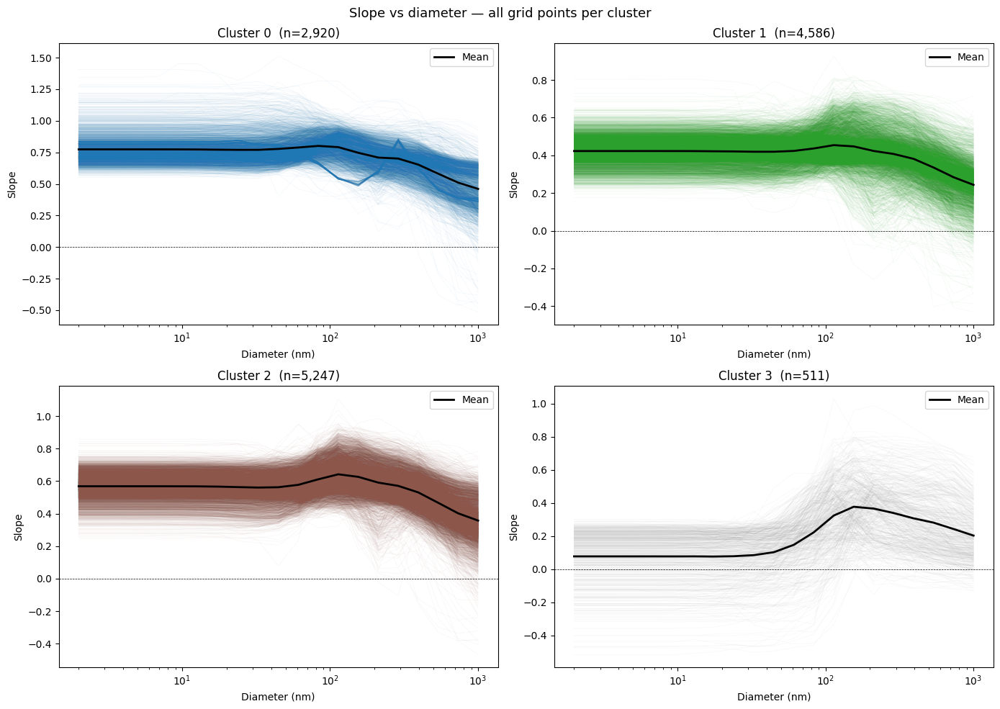

In [92]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i in range(k):
    ax = axes[i]
    cluster_vals = vals_valid[labels_valid == i]  # (n_points, 21)
    n = cluster_vals.shape[0]
    color = mpl.colormaps['tab10'](i / k)

    # Each grid point is a line — plot all of them faintly
    for j in range(n):
        ax.plot(diameter, cluster_vals[j], color=color, alpha=0.05, linewidth=0.5)

    # Overlay mean
    mean = cluster_vals.mean(axis=0)
    ax.plot(diameter, mean, color='black', linewidth=2, label='Mean')

    ax.set_xscale('log')
    ax.set_xlabel('Diameter (nm)')
    ax.set_ylabel('Slope')
    ax.set_title(f'Cluster {i}  (n={n:,})')
    ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
    ax.legend()

plt.suptitle('Slope vs diameter — all grid points per cluster', fontsize=13)
plt.tight_layout()
plt.show()

In [101]:
from scipy.stats import f_oneway
from itertools import combinations
from statsmodels.stats.multitest import multipletests

# ── One-way ANOVA at each diameter point ─────────────────────
print("ANOVA p-values across diameter bins:\n")

anova_pvals = []
for d_idx in range(len(diameter)):
    groups = [vals_valid[labels_valid == i, d_idx] for i in range(k)]
    f_stat, p_val = f_oneway(*groups)
    anova_pvals.append(p_val)

anova_pvals = np.array(anova_pvals)

# Correct for multiple testing across 21 diameter bins
rejected, pvals_corrected, _, _ = multipletests(anova_pvals, method='fdr_bh')

print(f"{'Diameter (nm)':<16} {'p-value':<12} {'p-corrected':<14} {'Significant'}")
print("-" * 55)
for d, p, pc, sig in zip(diameter, anova_pvals, pvals_corrected, rejected):
    print(f"{d:<16.1f} {p:<12.2e} {pc:<14.2e} {'***' if sig else ''}")

ANOVA p-values across diameter bins:

Diameter (nm)    p-value      p-corrected    Significant
-------------------------------------------------------
2.0              0.00e+00     0.00e+00       ***
2.7              0.00e+00     0.00e+00       ***
3.7              0.00e+00     0.00e+00       ***
5.1              0.00e+00     0.00e+00       ***
6.9              0.00e+00     0.00e+00       ***
9.5              0.00e+00     0.00e+00       ***
12.9             0.00e+00     0.00e+00       ***
17.6             0.00e+00     0.00e+00       ***
24.0             0.00e+00     0.00e+00       ***
32.8             0.00e+00     0.00e+00       ***
44.8             0.00e+00     0.00e+00       ***
61.1             0.00e+00     0.00e+00       ***
83.4             0.00e+00     0.00e+00       ***
113.8            0.00e+00     0.00e+00       ***
155.2            0.00e+00     0.00e+00       ***
211.9            0.00e+00     0.00e+00       ***
289.1            0.00e+00     0.00e+00       ***
394.5           

In [103]:
from scipy.stats import mannwhitneyu

# ── Pairwise Mann-Whitney at each diameter ────────────────────
# (non-parametric, more robust than t-test given your sample sizes)
pairs = list(combinations(range(k), 2))

print("\nPairwise Mann-Whitney U (FDR corrected):\n")
print(f"{'Diameter':>10}", end="")
for a, b in pairs:
    print(f"  C{a}vsC{b}", end="")
print()

for d_idx, d in enumerate(diameter):
    print(f"{d:>10.1f}", end="")
    pvals_pair = []
    for a, b in pairs:
        _, p = mannwhitneyu(vals_valid[labels_valid == a, d_idx],
                            vals_valid[labels_valid == b, d_idx],
                            alternative='two-sided')
        pvals_pair.append(p)

    # Correct across pairs at this diameter
    _, pvals_pair_corr, _, _ = multipletests(pvals_pair, method='fdr_bh')
    for pc in pvals_pair_corr:
        sig = '***' if pc < 0.001 else '**' if pc < 0.01 else '*' if pc < 0.05 else 'ns'
        print(f"  {sig:>5}", end="")
    print()


Pairwise Mann-Whitney U (FDR corrected):

  Diameter  C0vsC1  C0vsC2  C0vsC3  C1vsC2  C1vsC3  C2vsC3
       2.0    ***    ***    ***    ***    ***    ***
       2.7    ***    ***    ***    ***    ***    ***
       3.7    ***    ***    ***    ***    ***    ***
       5.1    ***    ***    ***    ***    ***    ***
       6.9    ***    ***    ***    ***    ***    ***
       9.5    ***    ***    ***    ***    ***    ***
      12.9    ***    ***    ***    ***    ***    ***
      17.6    ***    ***    ***    ***    ***    ***
      24.0    ***    ***    ***    ***    ***    ***
      32.8    ***    ***    ***    ***    ***    ***
      44.8    ***    ***    ***    ***    ***    ***
      61.1    ***    ***    ***    ***    ***    ***
      83.4    ***    ***    ***    ***    ***    ***
     113.8    ***    ***    ***    ***    ***    ***
     155.2    ***    ***    ***    ***    ***    ***
     211.9    ***    ***    ***    ***    ***    ***
     289.1    ***    ***    ***    ***    ***    *

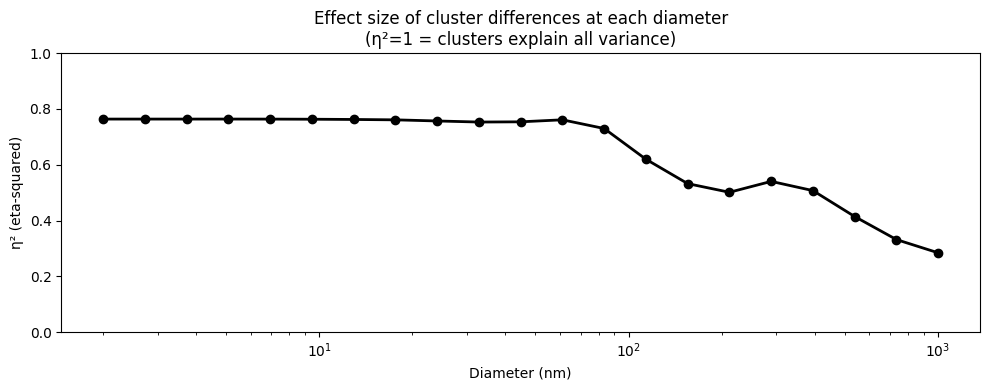

In [106]:
# Effect size: eta-squared = SS_between / SS_total
eta_squared = []
overall_mean_val = vals_valid.mean(axis=0)

for d_idx in range(len(diameter)):
    groups = [vals_valid[labels_valid == i, d_idx] for i in range(k)]
    grand_mean = vals_valid[:, d_idx].mean()
    
    ss_between = sum(len(g) * (g.mean() - grand_mean)**2 for g in groups)
    ss_total   = ((vals_valid[:, d_idx] - grand_mean)**2).sum()
    eta_squared.append(ss_between / ss_total)

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(diameter, eta_squared, 'k-o', linewidth=2)
ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('η² (eta-squared)')
ax.set_title('Effect size of cluster differences at each diameter\n(η²=1 = clusters explain all variance)')
ax.set_ylim(0, 1)
plt.tight_layout()
plt.show()

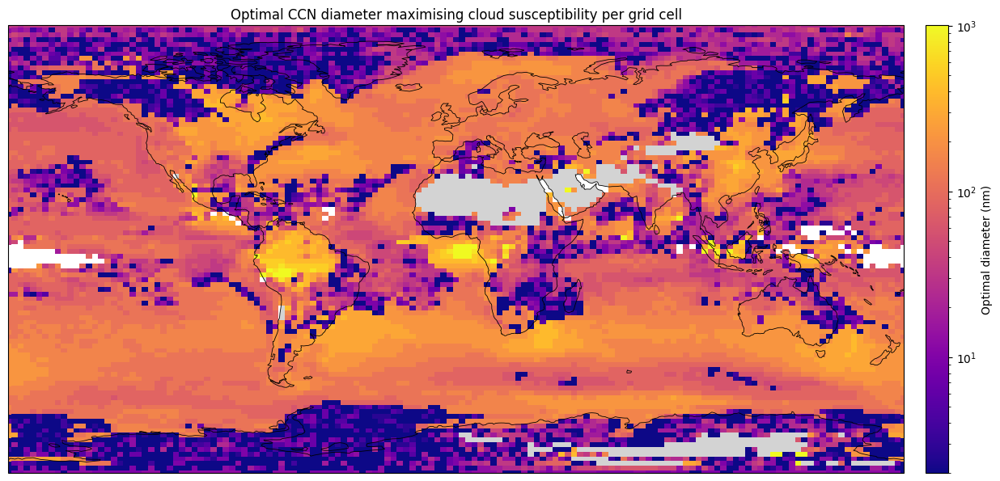

Min optimal diameter:    2.0 nm
Max optimal diameter:    1002.4 nm
Mean optimal diameter:   95.9 nm
Median optimal diameter: 83.4 nm


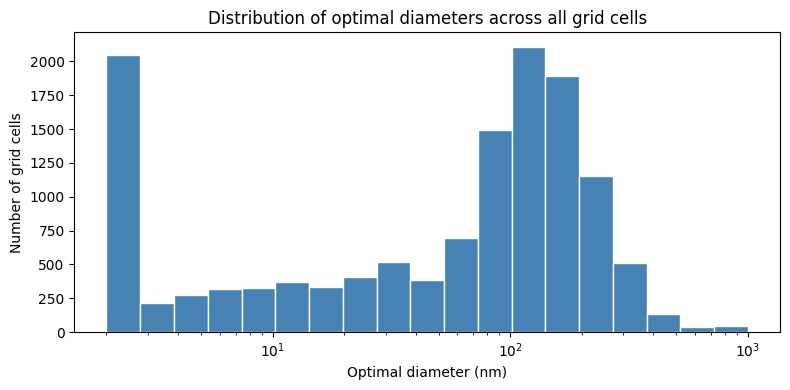

In [124]:
from scipy.ndimage import gaussian_filter1d

# ── Find optimal diameter for each valid grid point ───────────
optimal_diameters = np.full(len(nan_mask), np.nan)

for idx in range(len(vals_valid)):
    profile      = vals_valid[idx]                        # (21,) slope vs diameter
    smooth       = gaussian_filter1d(profile, sigma=1.5)
    optimal_idx  = np.argmax(smooth)
    optimal_diameters[valid_mask] = diameter[optimal_idx] # will overwrite each iter

# Fix: build array correctly
optimal_diameters_valid = np.array([
    diameter[np.argmax(gaussian_filter1d(vals_valid[idx], sigma=1.5))]
    for idx in range(len(vals_valid))
])

optimal_diameters_full = np.full(len(nan_mask), np.nan)
optimal_diameters_full[valid_mask] = optimal_diameters_valid
optimal_diameters_2d = optimal_diameters_full.reshape(len(lat), len(lon))

# ── Plot ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = ax.pcolormesh(lon, lat, optimal_diameters_2d,
                   cmap='plasma',
                   norm=mpl.colors.LogNorm(
                       vmin=np.nanmin(optimal_diameters_2d),
                       vmax=np.nanmax(optimal_diameters_2d)
                   ),
                   transform=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Optimal diameter (nm)')
ax.set_title('Optimal CCN diameter maximising cloud susceptibility per grid cell')
plt.tight_layout()
plt.show()

# ── Summary statistics ────────────────────────────────────────
print(f"Min optimal diameter:    {np.nanmin(optimal_diameters_2d):.1f} nm")
print(f"Max optimal diameter:    {np.nanmax(optimal_diameters_2d):.1f} nm")
print(f"Mean optimal diameter:   {np.nanmean(optimal_diameters_2d):.1f} nm")
print(f"Median optimal diameter: {np.nanmedian(optimal_diameters_2d):.1f} nm")

# ── Distribution of optimal diameters ────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)

ax.hist(optimal_diameters_valid, bins=log_bins,
        color='steelblue', edgecolor='white')
ax.set_xscale('log')
ax.set_xlabel('Optimal diameter (nm)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Distribution of optimal diameters across all grid cells')
plt.tight_layout()
plt.show()

In [114]:
optimal_diameters_valid

array([ 2.        , 12.91308458,  9.46302518, ..., 32.81179546,
       32.81179546, 32.81179546], shape=(13264,))

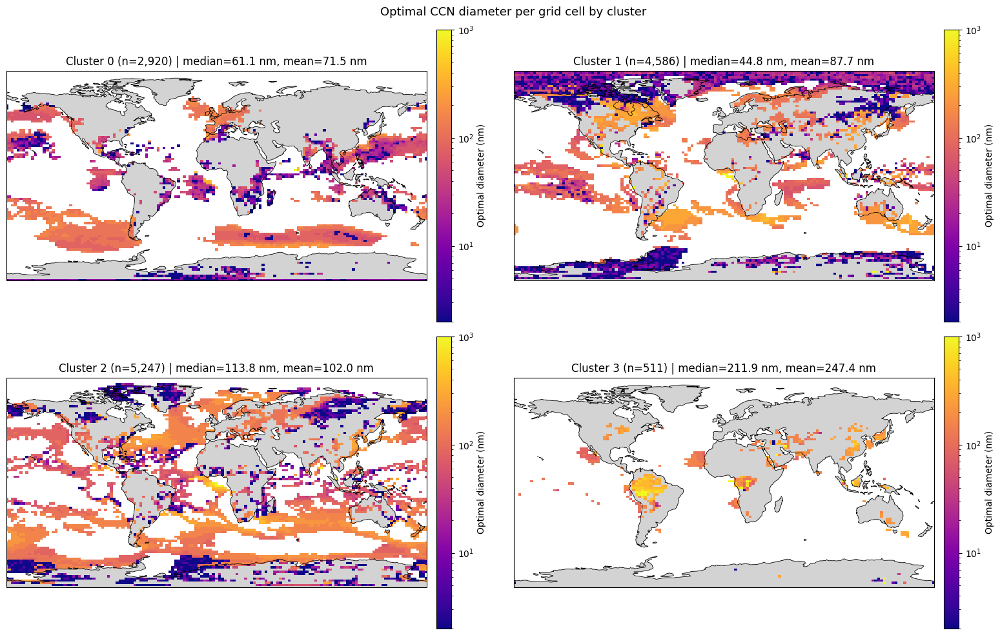

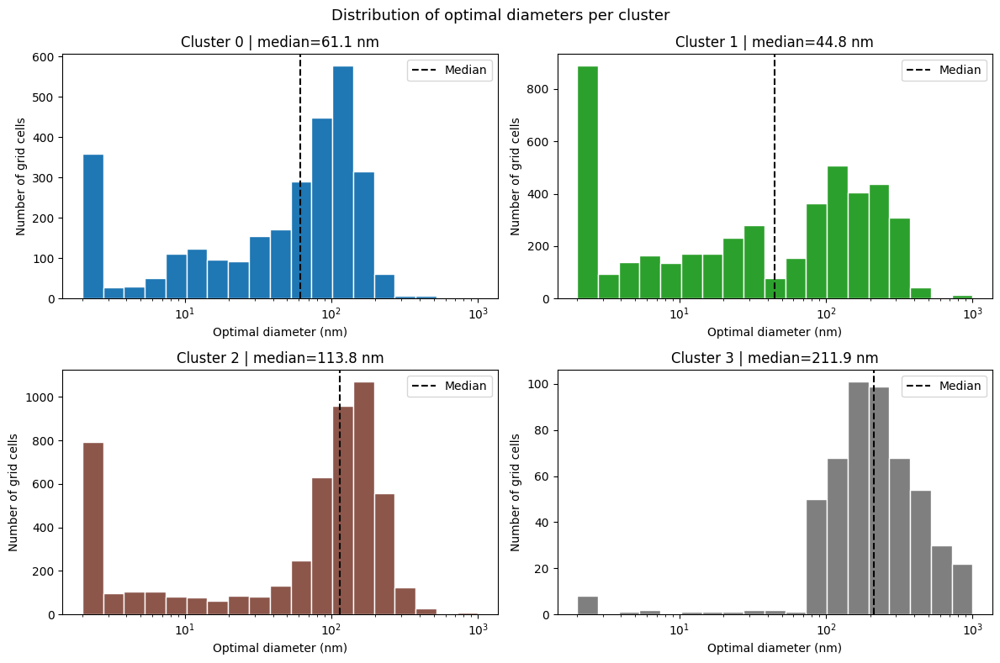

In [122]:
fig, axes = plt.subplots(2, 2, figsize=(16, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

# Use consistent color scale across all clusters
vmin = np.nanmin(optimal_diameters_valid)
vmax = np.nanmax(optimal_diameters_valid)

for i in range(k):
    ax = axes[i]
    
    # Mask to this cluster only
    cluster_optimal = np.full(len(nan_mask), np.nan)
    cluster_mask    = np.zeros(len(nan_mask), dtype=bool)
    cluster_mask[valid_mask] = (labels_valid == i)
    
    cluster_optimal[cluster_mask] = optimal_diameters_full[cluster_mask]
    cluster_optimal_2d = cluster_optimal.reshape(len(lat), len(lon))

    im = ax.pcolormesh(lon, lat, cluster_optimal_2d,
                       cmap='plasma',
                       norm=mpl.colors.LogNorm(vmin=vmin, vmax=vmax),
                       transform=ccrs.PlateCarree())

    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

    cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cb.set_label('Optimal diameter (nm)')

    # Stats for this cluster
    vals_this = optimal_diameters_full[cluster_mask]
    ax.set_title(f'Cluster {i} (n={(labels_valid==i).sum():,}) | '
                 f'median={np.nanmedian(vals_this):.1f} nm, '
                 f'mean={np.nanmean(vals_this):.1f} nm')

plt.suptitle('Optimal CCN diameter per grid cell by cluster', fontsize=13)
plt.tight_layout()
plt.show()

log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for i in range(k):
    ax = axes[i]
    cluster_mask_valid = labels_valid == i
    vals_this = optimal_diameters_valid[cluster_mask_valid]
    color = mpl.colormaps['tab10'](i / k)

    ax.hist(vals_this, bins=log_bins, color=color, edgecolor='white')
    ax.set_xscale('log')
    ax.set_xlabel('Optimal diameter (nm)')
    ax.set_ylabel('Number of grid cells')
    ax.set_title(f'Cluster {i} | median={np.nanmedian(vals_this):.1f} nm')
    ax.axvline(np.nanmedian(vals_this), color='black',
               linewidth=1.5, linestyle='--', label='Median')
    ax.legend()

plt.suptitle('Distribution of optimal diameters per cluster', fontsize=13)
plt.tight_layout()
plt.show()


Cluster 0: median optimal diameter = 61.1 nm → nearest bin = 61.1 nm
Cluster 1: median optimal diameter = 44.8 nm → nearest bin = 44.8 nm
Cluster 2: median optimal diameter = 113.8 nm → nearest bin = 113.8 nm
Cluster 3: median optimal diameter = 211.9 nm → nearest bin = 211.9 nm


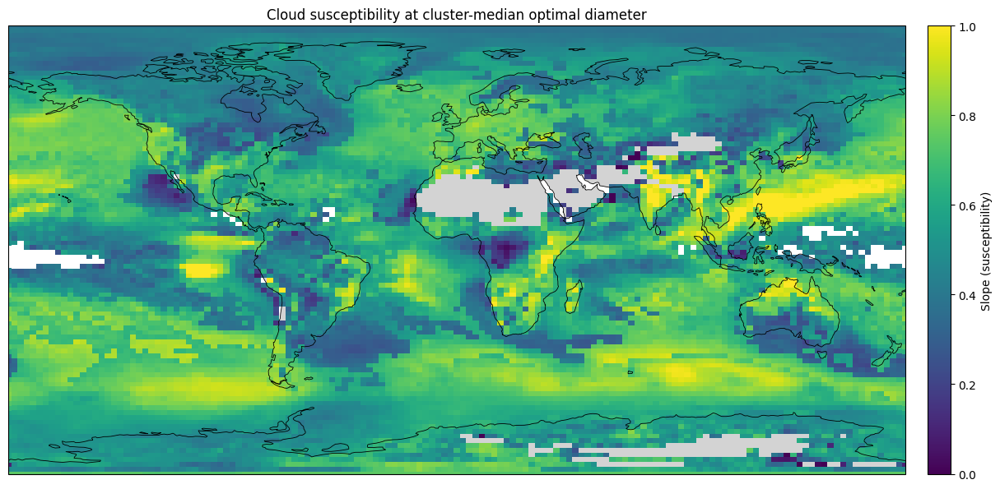

In [121]:
fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

slope_at_median_opt = np.full(len(nan_mask), np.nan)

for i in range(k):
    cluster_mask_valid = labels_valid == i
    vals_this          = optimal_diameters_valid[cluster_mask_valid]

    median_opt_diam = np.nanmedian(vals_this)
    nearest_idx     = np.argmin(np.abs(diameter - median_opt_diam))
    nearest_diam    = diameter[nearest_idx]

    print(f"Cluster {i}: median optimal diameter = {median_opt_diam:.1f} nm "
          f"→ nearest bin = {nearest_diam:.1f} nm")

    cluster_mask_full = np.zeros(len(nan_mask), dtype=bool)
    cluster_mask_full[valid_mask] = cluster_mask_valid

    slope_at_median_opt[cluster_mask_full] = vals_valid[cluster_mask_valid, nearest_idx]  # fix here

slope_at_median_opt_2d = slope_at_median_opt.reshape(len(lat), len(lon))
slope_masked           = np.ma.masked_invalid(slope_at_median_opt_2d)

cmap = plt.cm.viridis.copy()
cmap.set_bad(alpha=0)

im = ax.pcolormesh(lon, lat, slope_masked,
                   cmap=cmap,
                   vmin=0, vmax=1,
                   transform=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)

cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Slope (susceptibility)')
ax.set_title('Cloud susceptibility at cluster-median optimal diameter')
plt.tight_layout()
plt.show()

Smallest diameter bin: 2.0 nm
Grid cells with smallest optimal diameter: 1876 (14.1% of valid points)


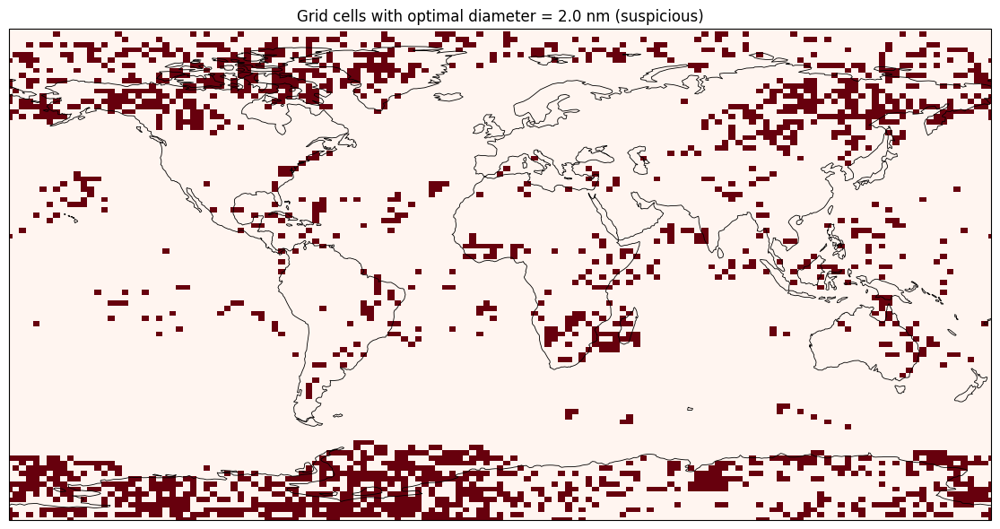

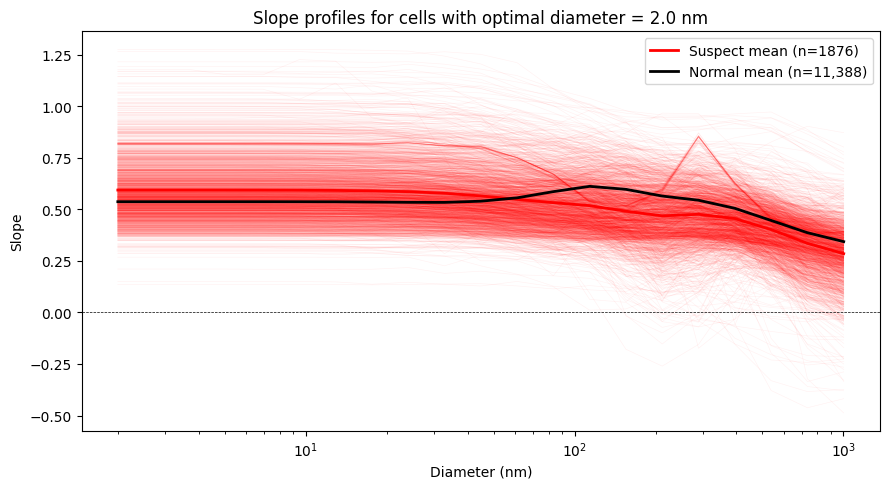


Cluster membership of suspect cells:
  Cluster 0: 334 (17.8%)
  Cluster 1: 808 (43.1%)
  Cluster 2: 726 (38.7%)
  Cluster 3: 8 (0.4%)


In [125]:
# ── Find cells where optimal diameter is the smallest bin ─────
smallest_bin = diameter[0]
print(f"Smallest diameter bin: {smallest_bin:.1f} nm")

is_smallest = optimal_diameters_valid == smallest_bin
print(f"Grid cells with smallest optimal diameter: {is_smallest.sum()} "
      f"({100*is_smallest.mean():.1f}% of valid points)")

# ── Where are they spatially? ─────────────────────────────────
smallest_full = np.zeros(len(nan_mask), dtype=bool)
smallest_full[valid_mask] = is_smallest
smallest_2d = smallest_full.reshape(len(lat), len(lon))

fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})
ax.pcolormesh(lon, lat, smallest_2d.astype(float),
              cmap='Reds', vmin=0, vmax=1,
              transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
ax.set_title(f'Grid cells with optimal diameter = {smallest_bin:.1f} nm (suspicious)')
plt.tight_layout()
plt.show()

# ── Examine their slope profiles ──────────────────────────────
suspect_profiles = vals_valid[is_smallest]
normal_profiles  = vals_valid[~is_smallest]

fig, ax = plt.subplots(figsize=(9, 5))

# Plot each suspect profile faintly
for j in range(len(suspect_profiles)):
    ax.plot(diameter, suspect_profiles[j],
            color='red', alpha=0.05, linewidth=0.5)

# Overlay means
ax.plot(diameter, suspect_profiles.mean(axis=0),
        color='red', linewidth=2, label=f'Suspect mean (n={is_smallest.sum()})')
ax.plot(diameter, normal_profiles.mean(axis=0),
        color='black', linewidth=2, label=f'Normal mean (n={(~is_smallest).sum():,})')

ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Slope')
ax.set_title(f'Slope profiles for cells with optimal diameter = {smallest_bin:.1f} nm')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

# ── Which clusters do they belong to? ─────────────────────────
print("\nCluster membership of suspect cells:")
for i in range(k):
    n_in_cluster = (labels_valid[is_smallest] == i).sum()
    pct = 100 * n_in_cluster / is_smallest.sum()
    print(f"  Cluster {i}: {n_in_cluster} ({pct:.1f}%)")

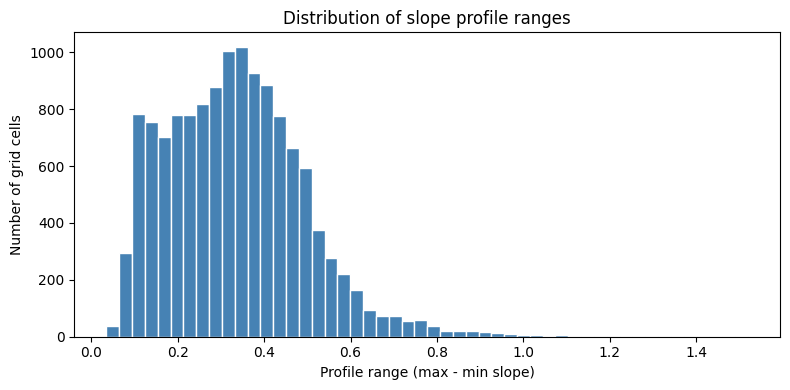

Profile range percentiles:
  5th percentile: 0.1112
  10th percentile: 0.1320
  25th percentile: 0.2117
  50th percentile: 0.3253


In [126]:
# ── Flag unreliable argmax: profile range too small ──────────
profile_range = vals_valid.max(axis=1) - vals_valid.min(axis=1)

# Look at distribution of ranges to pick a threshold
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(profile_range, bins=50, color='steelblue', edgecolor='white')
ax.set_xlabel('Profile range (max - min slope)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Distribution of slope profile ranges')
plt.tight_layout()
plt.show()

print(f"Profile range percentiles:")
for p in [5, 10, 25, 50]:
    print(f"  {p}th percentile: {np.percentile(profile_range, p):.4f}")

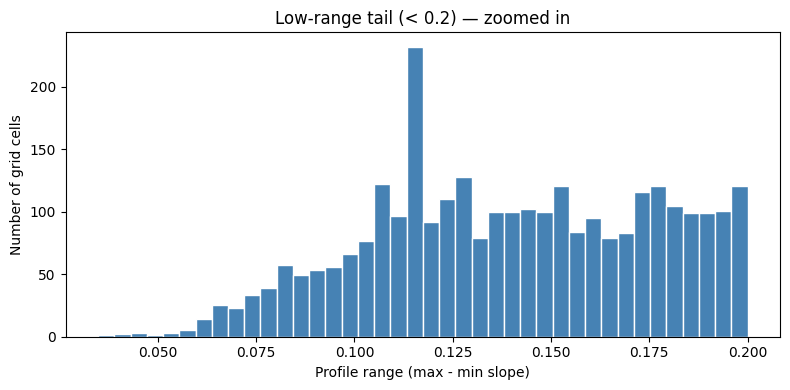

Threshold    Excluded     Smallest-bin remaining
---------------------------------------------
0.02         0            1876
0.05         7            1874
0.08         146          1847
0.10         419          1795
0.15         1762         1571
0.20         2993         1304


In [128]:
# ── Zoom into the low-range tail ──────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(profile_range[profile_range < 0.2], bins=40,
        color='steelblue', edgecolor='white')
ax.set_xlabel('Profile range (max - min slope)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Low-range tail (< 0.2) — zoomed in')
plt.tight_layout()
plt.show()

# ── How many cells are smallest-bin at each range threshold? ──
thresholds = [0.02, 0.05, 0.08, 0.10, 0.15, 0.20]
print(f"{'Threshold':<12} {'Excluded':<12} {'Smallest-bin remaining'}")
print("-" * 45)
for t in thresholds:
    excluded      = (profile_range < t).sum()
    still_small   = ((optimal_diameters_valid == diameter[0]) & 
                     (profile_range >= t)).sum()
    print(f"{t:<12.2f} {excluded:<12} {still_small}")

Suspect cells:              1876
Monotonically decreasing:   4 (0.2%)


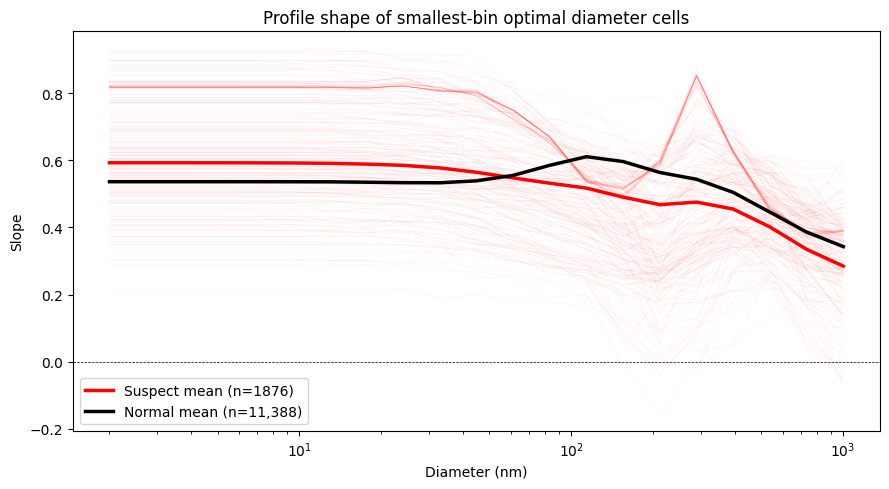

In [129]:
# ── Verify profiles are monotonically decreasing ──────────────
is_smallest    = optimal_diameters_valid == diameter[0]
suspect_profiles = vals_valid[is_smallest]

# Fraction of suspect profiles that are monotonically decreasing
def is_monotone_decreasing(profile):
    return np.all(np.diff(profile) <= 0)

n_monotone = sum(is_monotone_decreasing(p) for p in suspect_profiles)
print(f"Suspect cells:              {is_smallest.sum()}")
print(f"Monotonically decreasing:   {n_monotone} ({100*n_monotone/is_smallest.sum():.1f}%)")

# ── Plot mean profile shape ───────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 5))

for j in range(min(200, len(suspect_profiles))):  # plot up to 200
    ax.plot(diameter, suspect_profiles[j],
            color='red', alpha=0.05, linewidth=0.5)

ax.plot(diameter, suspect_profiles.mean(axis=0),
        color='red', linewidth=2.5, label=f'Suspect mean (n={is_smallest.sum()})')
ax.plot(diameter, vals_valid[~is_smallest].mean(axis=0),
        color='black', linewidth=2.5, label=f'Normal mean (n={(~is_smallest).sum():,})')

ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Slope')
ax.set_title('Profile shape of smallest-bin optimal diameter cells')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()


Excluding cells with profile range < 0.1320 (1327 cells, 10.0%)

Smallest-bin cells before filtering: 1876
Smallest-bin cells after filtering:  1654


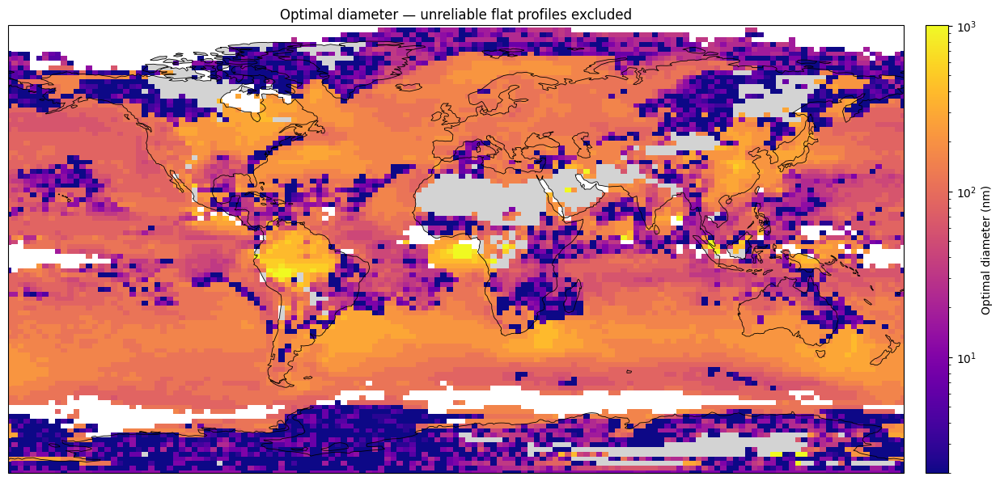

In [127]:
# ── Recompute optimal diameter, masking unreliable cells ──────
range_threshold = np.percentile(profile_range, 10)  # adjust as needed
print(f"\nExcluding cells with profile range < {range_threshold:.4f} "
      f"({(profile_range < range_threshold).sum()} cells, "
      f"{100*(profile_range < range_threshold).mean():.1f}%)")

reliable = profile_range >= range_threshold

optimal_diameters_reliable = np.where(
    reliable,
    optimal_diameters_valid,
    np.nan
)

optimal_diameters_full_v2 = np.full(len(nan_mask), np.nan)
optimal_diameters_full_v2[valid_mask] = optimal_diameters_reliable
optimal_diameters_2d_v2 = optimal_diameters_full_v2.reshape(len(lat), len(lon))

# ── Check how many smallest-bin cells are now excluded ────────
still_smallest = (optimal_diameters_reliable == diameter[0])
print(f"\nSmallest-bin cells before filtering: {is_smallest.sum()}")
print(f"Smallest-bin cells after filtering:  {np.nansum(still_smallest)}")

# ── Replot map ────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

cmap = plt.cm.plasma.copy()
cmap.set_bad(alpha=0)

im = ax.pcolormesh(lon, lat,
                   np.ma.masked_invalid(optimal_diameters_2d_v2),
                   cmap=cmap,
                   norm=mpl.colors.LogNorm(
                       vmin=np.nanmin(optimal_diameters_2d_v2),
                       vmax=np.nanmax(optimal_diameters_2d_v2)),
                   transform=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Optimal diameter (nm)')
ax.set_title('Optimal diameter — unreliable flat profiles excluded')
plt.tight_layout()
plt.show()

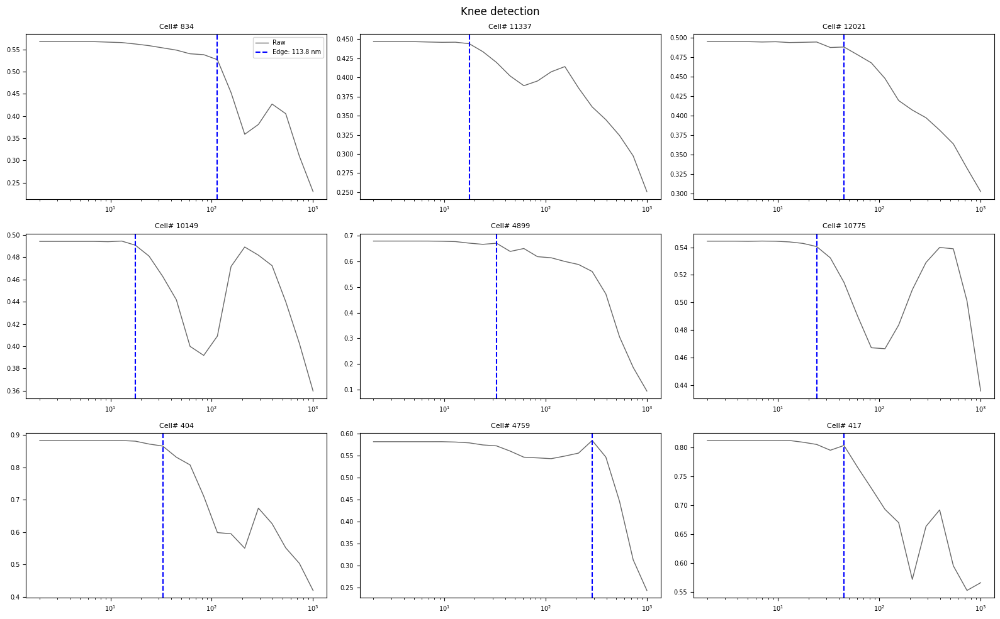

In [215]:
from scipy.ndimage import gaussian_filter1d

def find_plateau_edge(profile, diameter, sigma=2.0, drop_threshold=0.05):
    """
    Find the right edge of the initial plateau.
    
    Method: smooth the profile, compute the gradient, find where
    the gradient first drops below a threshold (i.e. where the 
    decline begins), return the diameter at that point.
    
    drop_threshold: fraction of total profile range at which 
                    gradient is considered significant decline.
    """
    smooth   = gaussian_filter1d(profile, sigma=sigma)
    gradient = np.gradient(smooth)  # dy/d(index)
    
    # Normalize gradient by profile range so threshold is scale-independent
    profile_range = smooth.max() - smooth.min()
    if profile_range == 0:
        return np.nan
    norm_gradient = gradient / profile_range
    
    # Find first index where gradient drops below -threshold
    # (i.e. start of meaningful decline)
    decline_indices = np.where(norm_gradient < -drop_threshold)[0]
    
    if len(decline_indices) == 0:
        # No significant decline found — return last bin
        return diameter[-1]
    
    # Plateau edge = one step before the decline starts
    edge_idx = max(0, decline_indices[0] - 1)
    return diameter[edge_idx]

# ── Test on a sample of suspect profiles ─────────────────────
fig, axes = plt.subplots(3, 3, figsize=(16, 10))
axes = axes.flatten()

rng = np.random.default_rng(42)
sample_idx = rng.choice(np.where(is_smallest)[0], size=9, replace=False)

for ax, idx in zip(axes, sample_idx):
    profile = vals_valid[idx]
    smooth  = gaussian_filter1d(profile, sigma=2.0)
    edge    = find_plateau_edge_kneedle(profile, diameter, sigma=0.5, S = 5)

    ax.plot(diameter, profile, 'k-',  linewidth=1,   alpha=0.6, label='Raw')
    ax.plot(diameter, smooth,  'r-',  linewidth=1.5, label='Smoothed')
    ax.axvline(edge, color='blue', linewidth=1.5, linestyle='--',
               label=f'Edge: {edge:.1f} nm')
    ax.set_xscale('log')
    ax.set_title(f'Cell# {idx}', fontsize=8)
    ax.tick_params(labelsize=7)

axes[0].legend(fontsize=7)
plt.suptitle('Knee detection', fontsize=12)
plt.tight_layout()
plt.show()

In [132]:
# ── Apply plateau edge to all left-censored cells ─────────────
optimal_diameters_corrected = optimal_diameters_valid.copy().astype(float)

for idx in np.where(is_smallest)[0]:
    edge = find_plateau_edge(vals_valid[idx], diameter, sigma=2.0, drop_threshold=0.05)
    optimal_diameters_corrected[idx] = edge

# ── Check improvement ─────────────────────────────────────────
still_smallest = (optimal_diameters_corrected == diameter[0]).sum()
print(f"Smallest-bin cells before correction: {is_smallest.sum()}")
print(f"Smallest-bin cells after correction:  {still_smallest}")
print(f"\nCorrected diameter distribution for previously censored cells:")
corrected_vals = optimal_diameters_corrected[is_smallest]
for p in [10, 25, 50, 75, 90]:
    print(f"  {p}th percentile: {np.percentile(corrected_vals, p):.1f} nm")

Smallest-bin cells before correction: 1876
Smallest-bin cells after correction:  0

Corrected diameter distribution for previously censored cells:
  10th percentile: 17.6 nm
  25th percentile: 24.0 nm
  50th percentile: 44.8 nm
  75th percentile: 83.4 nm
  90th percentile: 113.8 nm


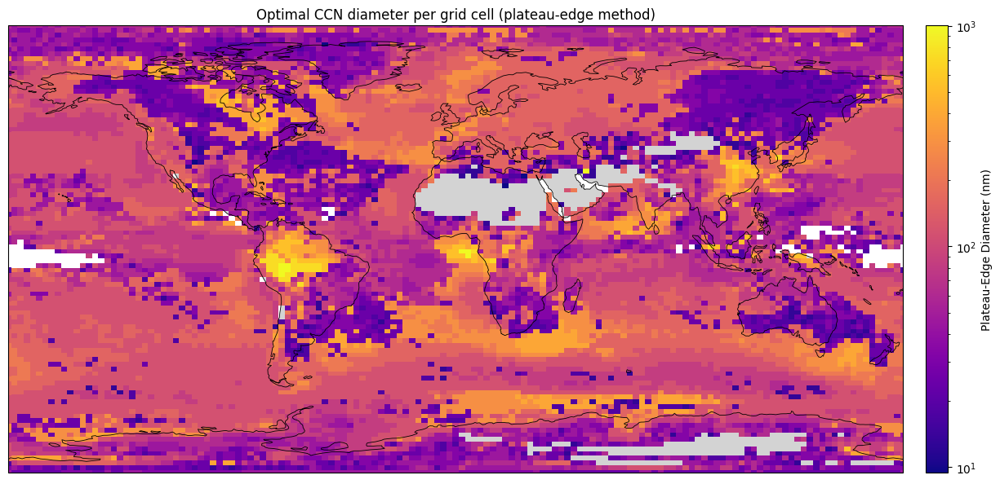

Min optimal diameter:    9.5 nm
Max optimal diameter:    1002.4 nm
Mean optimal diameter:   115.1 nm
Median optimal diameter: 113.8 nm


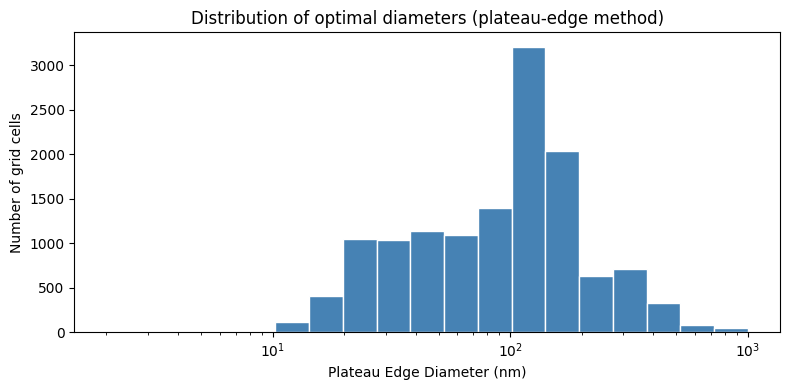

In [222]:
from kneed import KneeLocator
from scipy.ndimage import gaussian_filter1d

def find_plateau_edge_kneedle(profile, diameter, sigma=2.0, S=1.0):
    # Pre-smooth before passing to Kneedle
    smooth = gaussian_filter1d(profile, sigma=sigma)
    
    kl = KneeLocator(
        x=np.log10(diameter),
        y=smooth,               
        S=S,
        curve='concave',
        direction='decreasing',
        interp_method='interp1d',
        online=True
    )
    if kl.knee is None:
        return np.nan
    return 10 ** kl.knee

# Apply — can now tune both sigma and S
optimal_diameters_valid = np.array([
    find_plateau_edge_kneedle(vals_valid[idx], diameter, sigma=2.0, S=1.0)
    for idx in range(len(vals_valid))
])

# ── Apply to all valid grid points ────────────────────────────
optimal_diameters_valid = np.array([
    find_plateau_edge_kneedle(vals_valid[idx], diameter, sigma=0.5, S = 5)
    for idx in range(len(vals_valid))
])

# ── Rebuild full grid ─────────────────────────────────────────
optimal_diameters_full = np.full(len(nan_mask), np.nan)
optimal_diameters_full[valid_mask] = optimal_diameters_valid
optimal_diameters_2d = optimal_diameters_full.reshape(len(lat), len(lon))

# ── Map ───────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

cmap = plt.cm.plasma.copy()
cmap.set_bad(alpha=0)

im = ax.pcolormesh(lon, lat,
                   np.ma.masked_invalid(optimal_diameters_2d),
                   cmap=cmap,
                   norm=mpl.colors.LogNorm(
                       vmin=np.nanmin(optimal_diameters_2d),
                       vmax=np.nanmax(optimal_diameters_2d)
                   ),
                   transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Plateau-Edge Diameter (nm)')
ax.set_title('Optimal CCN diameter per grid cell (plateau-edge method)')
plt.tight_layout()
plt.show()

# ── Summary statistics ────────────────────────────────────────
print(f"Min optimal diameter:    {np.nanmin(optimal_diameters_2d):.1f} nm")
print(f"Max optimal diameter:    {np.nanmax(optimal_diameters_2d):.1f} nm")
print(f"Mean optimal diameter:   {np.nanmean(optimal_diameters_2d):.1f} nm")
print(f"Median optimal diameter: {np.nanmedian(optimal_diameters_2d):.1f} nm")

# ── Distribution ──────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)
ax.hist(optimal_diameters_valid, bins=log_bins,
        color='steelblue', edgecolor='white')
ax.set_xscale('log')
ax.set_xlabel('Plateau Edge Diameter (nm)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Distribution of optimal diameters (plateau-edge method)')
plt.tight_layout()
plt.show()

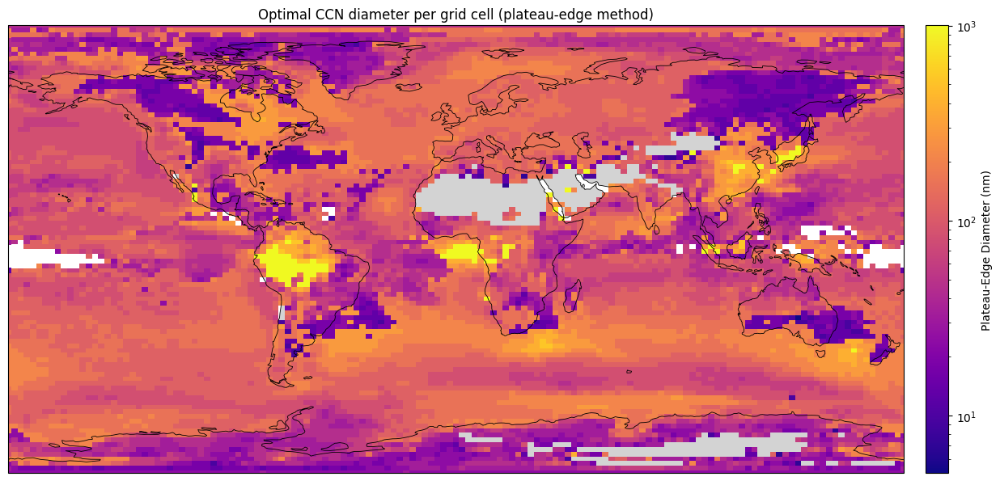

Min optimal diameter:    5.1 nm
Max optimal diameter:    1002.4 nm
Mean optimal diameter:   115.6 nm
Median optimal diameter: 113.8 nm


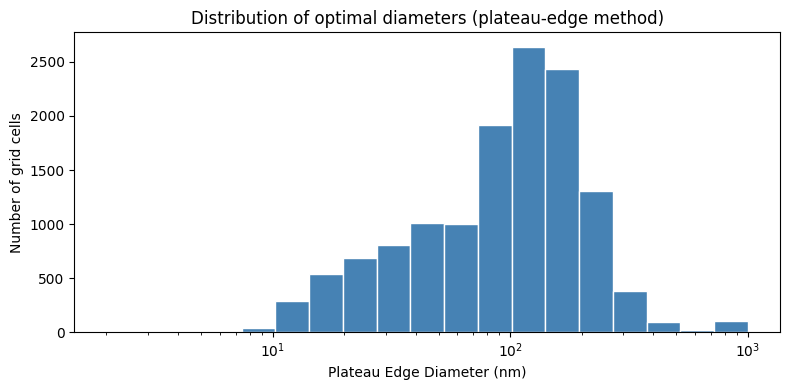

In [254]:
from scipy.ndimage import gaussian_filter1d

def find_plateau_edge(profile, diameter, sigma=2.0, drop_threshold=0.05):
    smooth        = gaussian_filter1d(profile, sigma=sigma)
    gradient      = np.gradient(smooth)
    profile_range = smooth.max() - smooth.min()
    if profile_range == 0:
        return np.nan
    norm_gradient   = gradient / profile_range
    decline_indices = np.where(norm_gradient < -drop_threshold)[0]
    if len(decline_indices) == 0:
        return diameter[-1]
    edge_idx = max(0, decline_indices[0] - 1)
    return diameter[edge_idx]

# ── Apply to all valid grid points ────────────────────────────
optimal_diameters_valid = np.array([
    find_plateau_edge(vals_valid[idx], diameter, sigma=1.5, drop_threshold=0.05)
    for idx in range(len(vals_valid))
])

# ── Rebuild full grid ─────────────────────────────────────────
optimal_diameters_full = np.full(len(nan_mask), np.nan)
optimal_diameters_full[valid_mask] = optimal_diameters_valid
optimal_diameters_2d = optimal_diameters_full.reshape(len(lat), len(lon))

# ── Map ───────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6),
                       subplot_kw={'projection': ccrs.PlateCarree()})

cmap = plt.cm.plasma.copy()
cmap.set_bad(alpha=0)

im = ax.pcolormesh(lon, lat,
                   np.ma.masked_invalid(optimal_diameters_2d),
                   cmap=cmap,
                   norm=mpl.colors.LogNorm(
                       vmin=np.nanmin(optimal_diameters_2d),
                       vmax=np.nanmax(optimal_diameters_2d)
                   ),
                   transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cb.set_label('Plateau-Edge Diameter (nm)')
ax.set_title('Optimal CCN diameter per grid cell (plateau-edge method)')
plt.tight_layout()
plt.show()

# ── Summary statistics ────────────────────────────────────────
print(f"Min optimal diameter:    {np.nanmin(optimal_diameters_2d):.1f} nm")
print(f"Max optimal diameter:    {np.nanmax(optimal_diameters_2d):.1f} nm")
print(f"Mean optimal diameter:   {np.nanmean(optimal_diameters_2d):.1f} nm")
print(f"Median optimal diameter: {np.nanmedian(optimal_diameters_2d):.1f} nm")

# ── Distribution ──────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)
ax.hist(optimal_diameters_valid, bins=log_bins,
        color='steelblue', edgecolor='white')
ax.set_xscale('log')
ax.set_xlabel('Plateau Edge Diameter (nm)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Distribution of optimal diameters (plateau-edge method)')
plt.tight_layout()
plt.show()

Mode 1: median = 34.4 nm, σ(log10) = 0.292
Mode 2: median = 136.2 nm, σ(log10) = 0.190


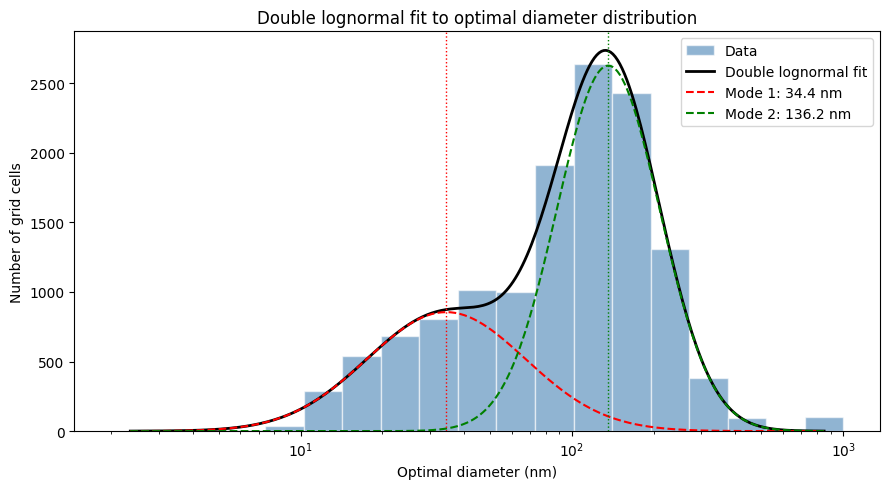

In [255]:
from scipy.stats import lognorm
from scipy.optimize import curve_fit

# ── Fit two lognormals to the distribution ────────────────────
# Work in log10 space — mixture of two Gaussians
log_diameters = np.log10(optimal_diameters_valid[np.isfinite(optimal_diameters_valid)])

def double_gaussian(x, a1, mu1, sig1, a2, mu2, sig2):
    g1 = a1 * np.exp(-0.5 * ((x - mu1) / sig1) ** 2)
    g2 = a2 * np.exp(-0.5 * ((x - mu2) / sig2) ** 2)
    return g1 + g2

# ── Build histogram to fit against ───────────────────────────
log_bins   = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)
counts, edges = np.histogram(optimal_diameters_valid[np.isfinite(optimal_diameters_valid)],
                             bins=log_bins)
bin_centers    = np.sqrt(edges[:-1] * edges[1:])  # geometric mean of edges
log_centers    = np.log10(bin_centers)

# ── Initial guess from visual inspection ─────────────────────
# Mode 1: ~10 nm (log10 ~ 1.0), Mode 2: ~130 nm (log10 ~ 2.1)
p0 = [900, 1.0, 0.3, 2000, 2.1, 0.3]

params, _ = curve_fit(double_gaussian, log_centers, counts, p0=p0, maxfev=10000)
a1, mu1, sig1, a2, mu2, sig2 = params

median1 = 10 ** mu1
median2 = 10 ** mu2

print(f"Mode 1: median = {median1:.1f} nm, σ(log10) = {sig1:.3f}")
print(f"Mode 2: median = {median2:.1f} nm, σ(log10) = {sig2:.3f}")

# ── Plot ──────────────────────────────────────────────────────
x_smooth     = np.linspace(log_centers.min(), log_centers.max(), 300)
x_smooth_lin = 10 ** x_smooth

fig, ax = plt.subplots(figsize=(9, 5))

ax.hist(optimal_diameters_valid[np.isfinite(optimal_diameters_valid)],
        bins=log_bins, color='steelblue', edgecolor='white',
        alpha=0.6, label='Data')

ax.plot(x_smooth_lin, double_gaussian(x_smooth, *params),
        'k-', linewidth=2, label='Double lognormal fit')
ax.plot(x_smooth_lin,
        double_gaussian(x_smooth, a1, mu1, sig1, 0, mu2, sig2),
        'r--', linewidth=1.5, label=f'Mode 1: {median1:.1f} nm')
ax.plot(x_smooth_lin,
        double_gaussian(x_smooth, 0, mu1, sig1, a2, mu2, sig2),
        'g--', linewidth=1.5, label=f'Mode 2: {median2:.1f} nm')

ax.axvline(median1, color='red',   linewidth=1, linestyle=':')
ax.axvline(median2, color='green', linewidth=1, linestyle=':')

ax.set_xscale('log')
ax.set_xlabel('Optimal diameter (nm)')
ax.set_ylabel('Number of grid cells')
ax.set_title('Double lognormal fit to optimal diameter distribution')
ax.legend()
plt.tight_layout()
plt.show()

In [260]:
# ── Which mode does each cluster belong to? ───────────────────
mode_boundary = np.sqrt(median1 * median2)  # geometric mean as boundary
print(f"Mode boundary (geometric mean): {mode_boundary:.1f} nm\n")

for i in range(4):
    cluster_mask_valid = labels_valid == i
    cluster_diameters  = optimal_diameters_valid[cluster_mask_valid]
    cluster_diameters  = cluster_diameters[np.isfinite(cluster_diameters)]

    pct_mode1 = 100 * (cluster_diameters < mode_boundary).mean()
    pct_mode2 = 100 * (cluster_diameters >= mode_boundary).mean()

    print(f"Cluster {i} (n={cluster_mask_valid.sum():,}): "
          f"Mode 1 (<{mode_boundary:.0f} nm) = {pct_mode1:.1f}%  |  "
          f"Mode 2 (≥{mode_boundary:.0f} nm) = {pct_mode2:.1f}%")

Mode boundary (geometric mean): 68.5 nm

Cluster 0 (n=2,920): Mode 1 (<68 nm) = 41.1%  |  Mode 2 (≥68 nm) = 58.9%
Cluster 1 (n=4,586): Mode 1 (<68 nm) = 40.5%  |  Mode 2 (≥68 nm) = 59.5%
Cluster 2 (n=5,247): Mode 1 (<68 nm) = 24.4%  |  Mode 2 (≥68 nm) = 75.6%
Cluster 3 (n=511): Mode 1 (<68 nm) = 8.6%  |  Mode 2 (≥68 nm) = 91.4%


In [261]:
k

9

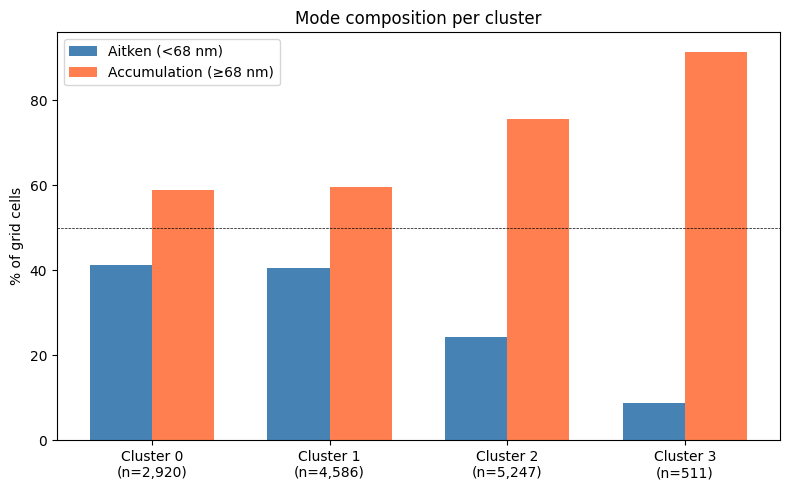

In [268]:
mode_labels = np.where(optimal_diameters_valid < mode_boundary, 'Aitken', 'Accumulation')

fig, ax = plt.subplots(figsize=(8, 5))

x       = np.arange(4)
width   = 0.35
mode1_counts = [(((labels_valid == i) & (optimal_diameters_valid < mode_boundary)).sum() /
                  (labels_valid == i).sum() * 100) for i in range(4)]
mode2_counts = [100 - m for m in mode1_counts]

bars1 = ax.bar(x - width/2, mode1_counts, width,
               label=f'Aitken (<{mode_boundary:.0f} nm)',
               color='steelblue')
bars2 = ax.bar(x + width/2, mode2_counts, width,
               label=f'Accumulation (≥{mode_boundary:.0f} nm)',
               color='coral')

ax.set_xticks(x)
ax.set_xticklabels([f'Cluster {i}\n(n={(labels_valid==i).sum():,})' for i in range(4)])
ax.set_ylabel('% of grid cells')
ax.set_title('Mode composition per cluster')
ax.axhline(50, color='k', linewidth=0.5, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

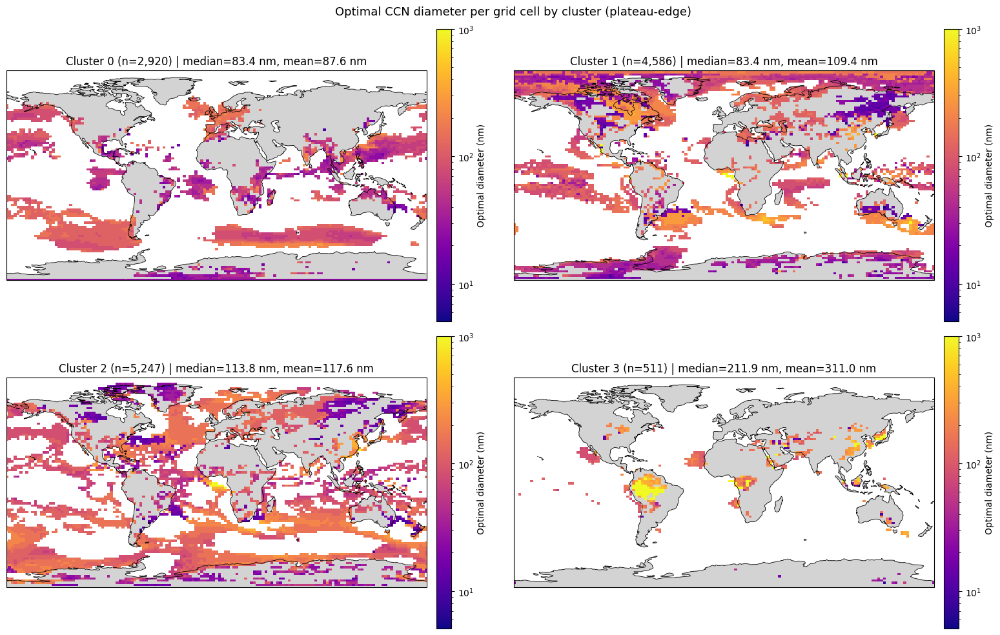

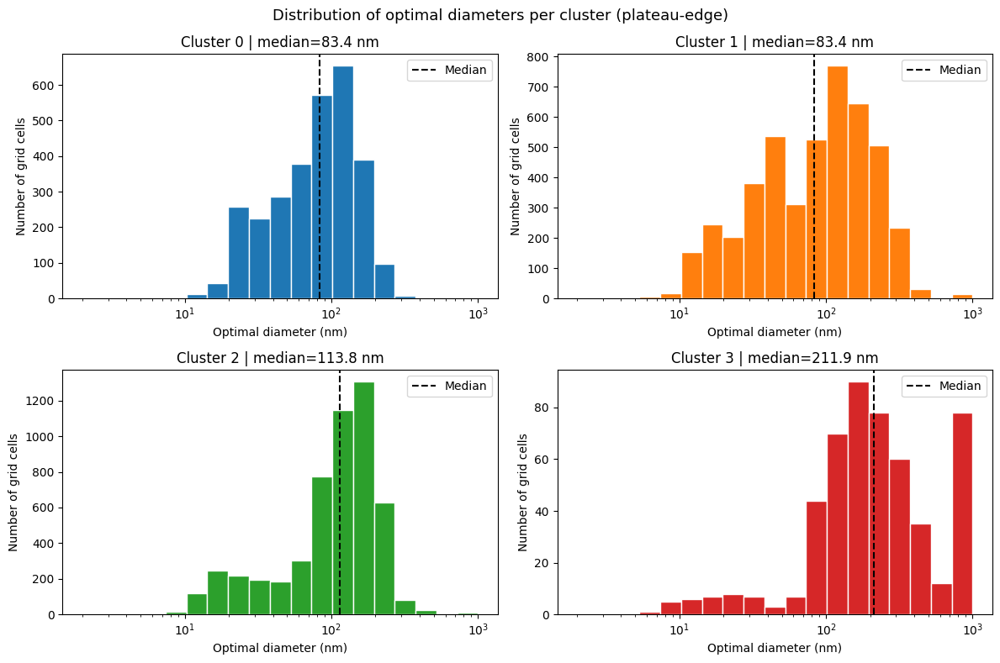

In [269]:
# ── Rebuild full grid with plateau-edge corrected values ──────
optimal_diameters_full = np.full(len(nan_mask), np.nan)
optimal_diameters_full[valid_mask] = optimal_diameters_valid

vmin = np.nanmin(optimal_diameters_valid)
vmax = np.nanmax(optimal_diameters_valid)

# ── Maps per cluster ──────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 10),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for i in range(4):
    ax = axes[i]

    cluster_optimal = np.full(len(nan_mask), np.nan)
    cluster_mask    = np.zeros(len(nan_mask), dtype=bool)
    cluster_mask[valid_mask] = (labels_valid == i)

    cluster_optimal[cluster_mask] = optimal_diameters_full[cluster_mask]
    cluster_optimal_2d = cluster_optimal.reshape(len(lat), len(lon))

    cmap = plt.cm.plasma.copy()
    cmap.set_bad(alpha=0)

    im = ax.pcolormesh(lon, lat,
                       np.ma.masked_invalid(cluster_optimal_2d),
                       cmap=cmap,
                       norm=mpl.colors.LogNorm(vmin=vmin, vmax=vmax),
                       transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cb.set_label('Optimal diameter (nm)')

    vals_this = optimal_diameters_full[cluster_mask]
    ax.set_title(f'Cluster {i} (n={(labels_valid==i).sum():,}) | '
                 f'median={np.nanmedian(vals_this):.1f} nm, '
                 f'mean={np.nanmean(vals_this):.1f} nm')

plt.suptitle('Optimal CCN diameter per grid cell by cluster (plateau-edge)', fontsize=13)
plt.tight_layout()
plt.show()

# ── Histograms per cluster ────────────────────────────────────
log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for i in range(4):
    ax = axes[i]
    cluster_mask_valid = labels_valid == i
    vals_this = optimal_diameters_valid[cluster_mask_valid]
    color = mpl.colormaps['tab10'](i / k)

    ax.hist(vals_this, bins=log_bins, color=color, edgecolor='white')
    ax.set_xscale('log')
    ax.set_xlabel('Optimal diameter (nm)')
    ax.set_ylabel('Number of grid cells')
    ax.set_title(f'Cluster {i} | median={np.nanmedian(vals_this):.1f} nm')
    ax.axvline(np.nanmedian(vals_this), color='black',
               linewidth=1.5, linestyle='--', label='Median')
    ax.legend()

plt.suptitle('Distribution of optimal diameters per cluster (plateau-edge)', fontsize=13)
plt.tight_layout()
plt.show()

In [177]:
optimal_diameters_valid

array([1002.37446725,  289.08795415,  289.08795415, ...,  289.08795415,
        289.08795415,  289.08795415], shape=(13264,))

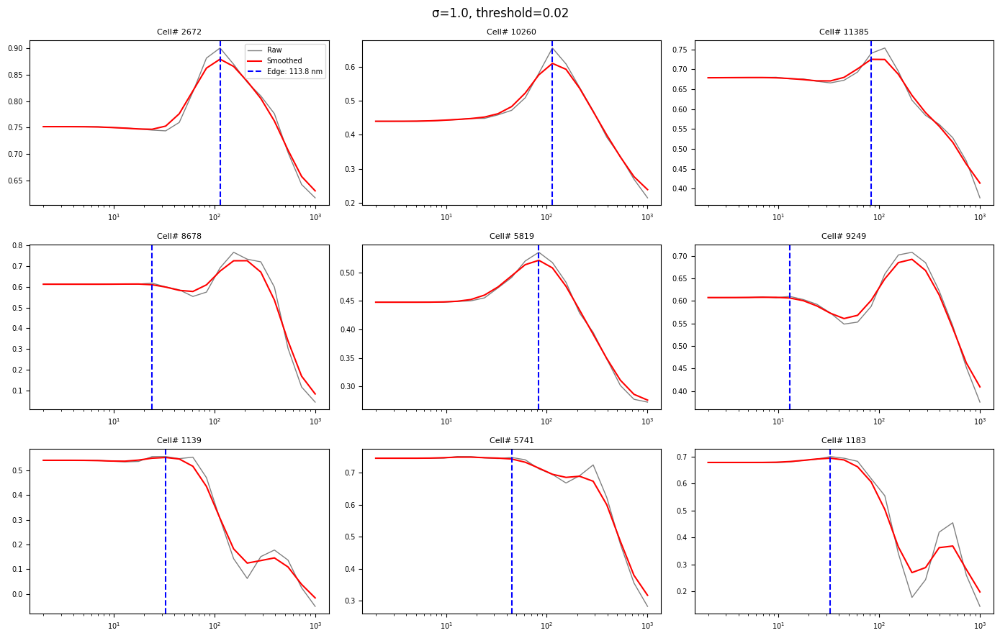

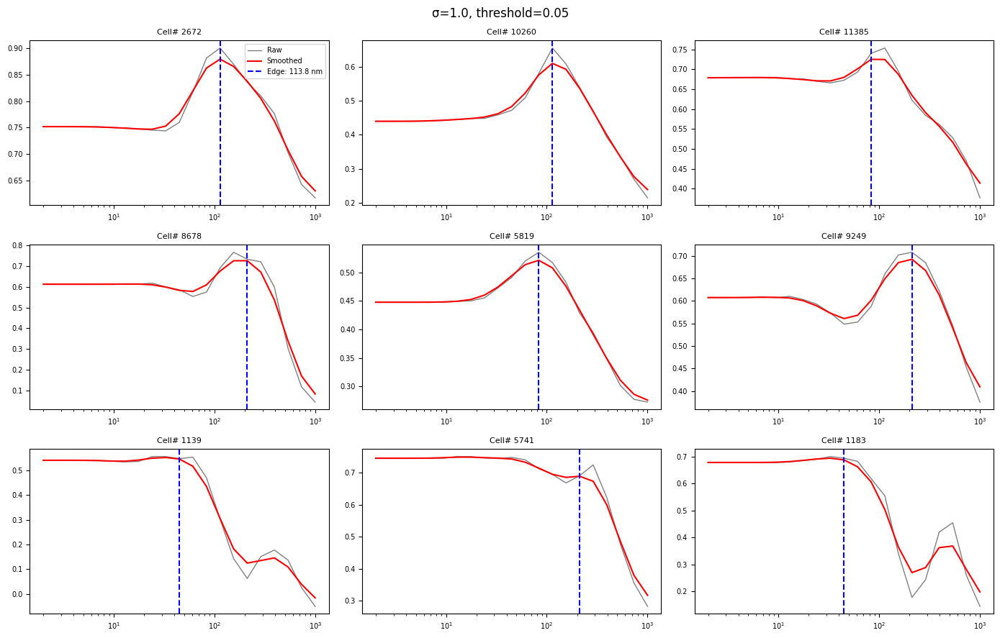

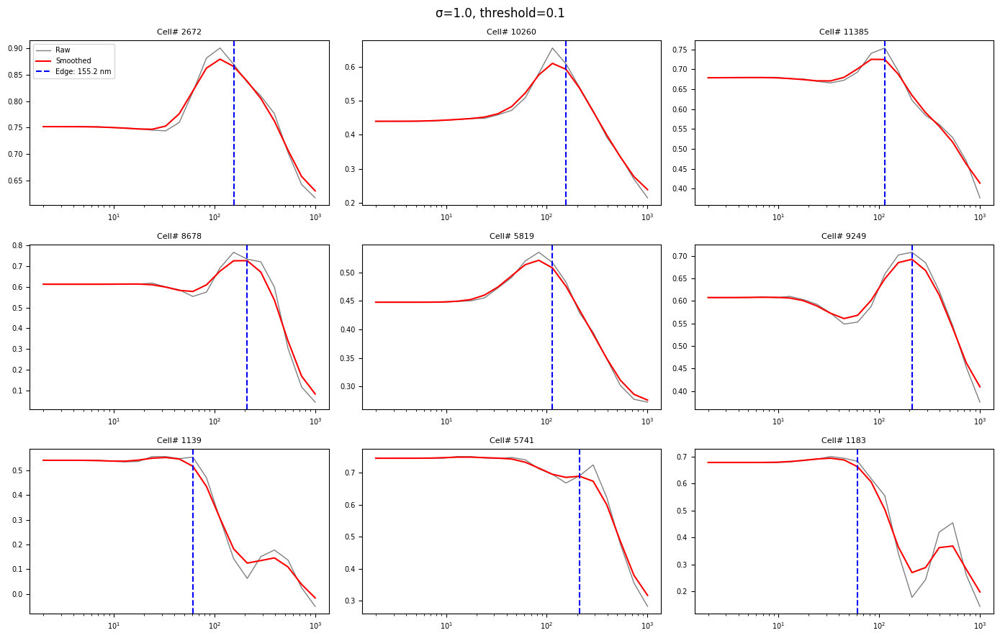

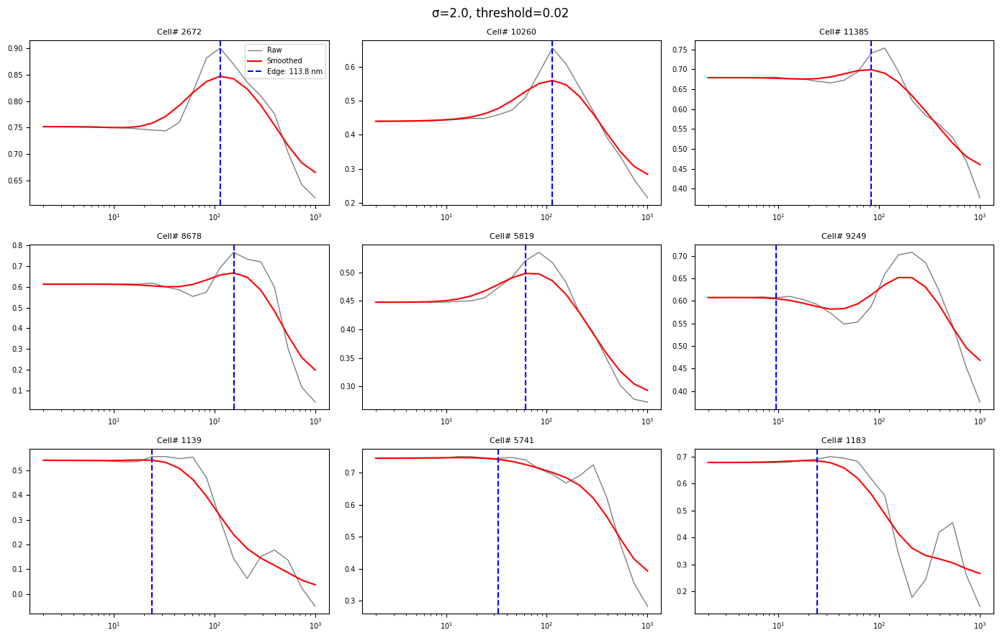

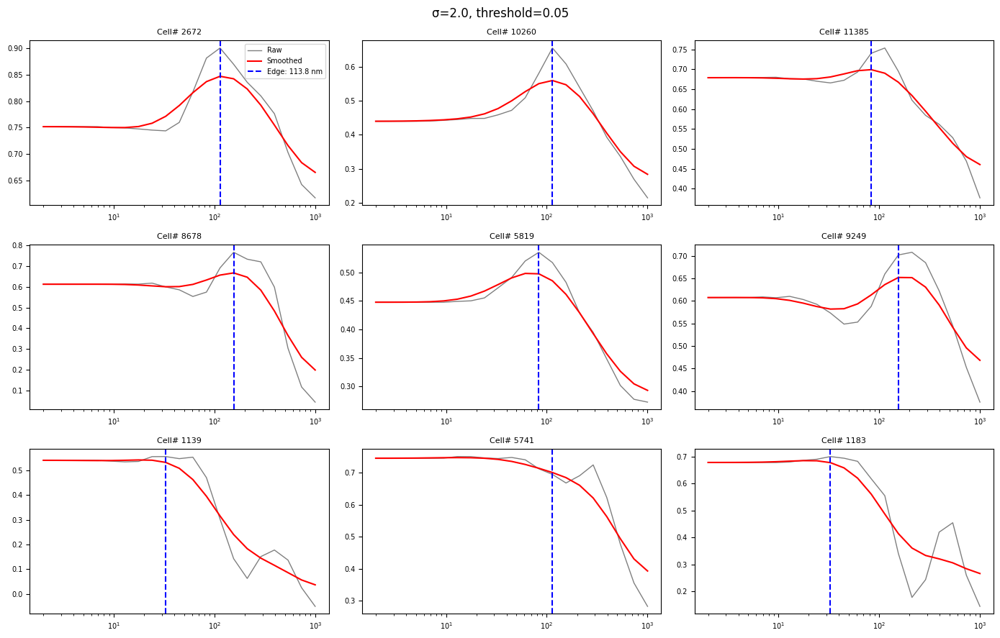

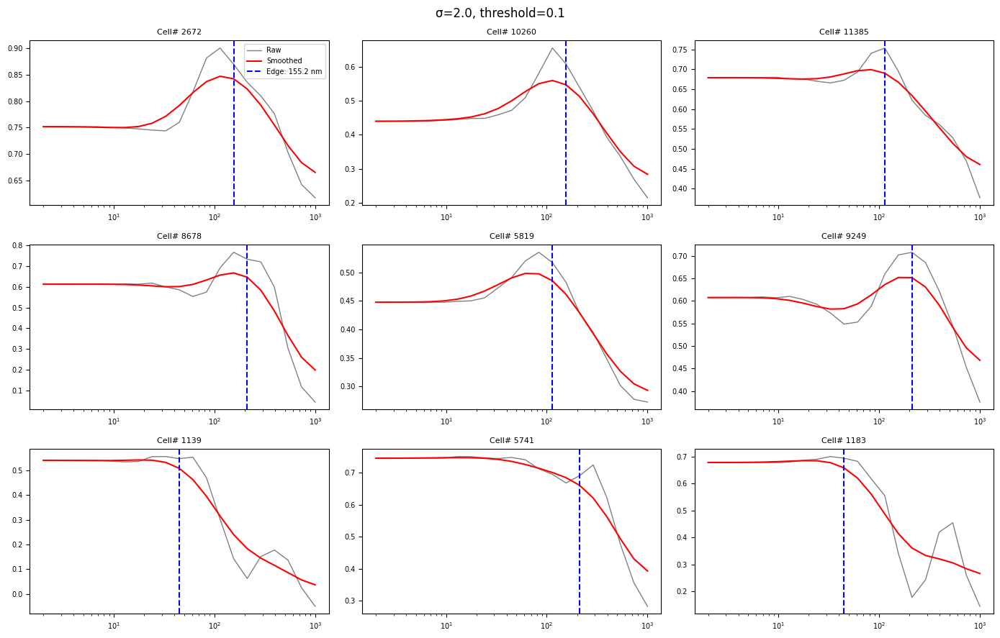

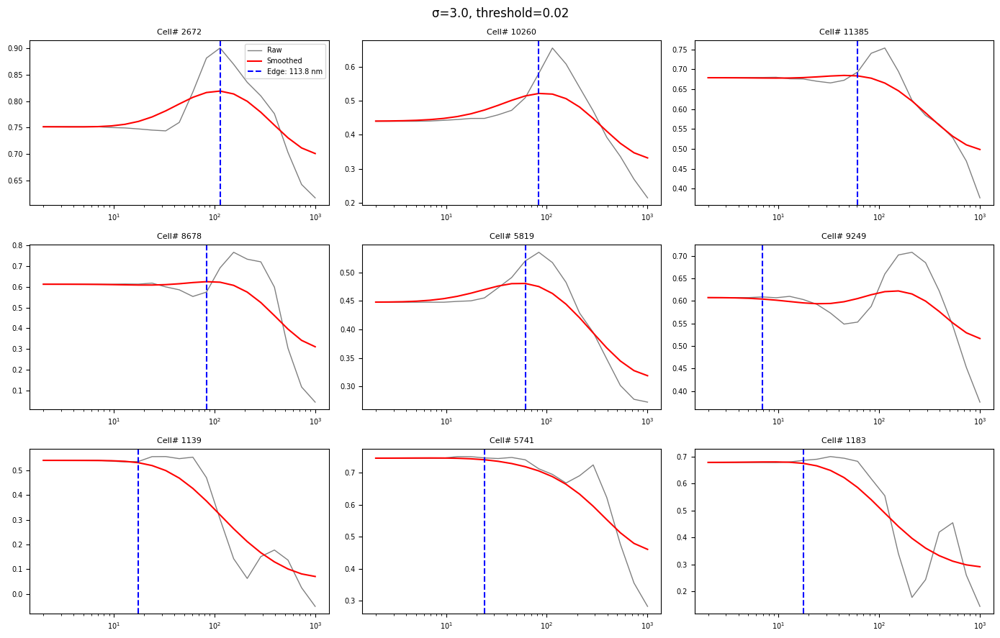

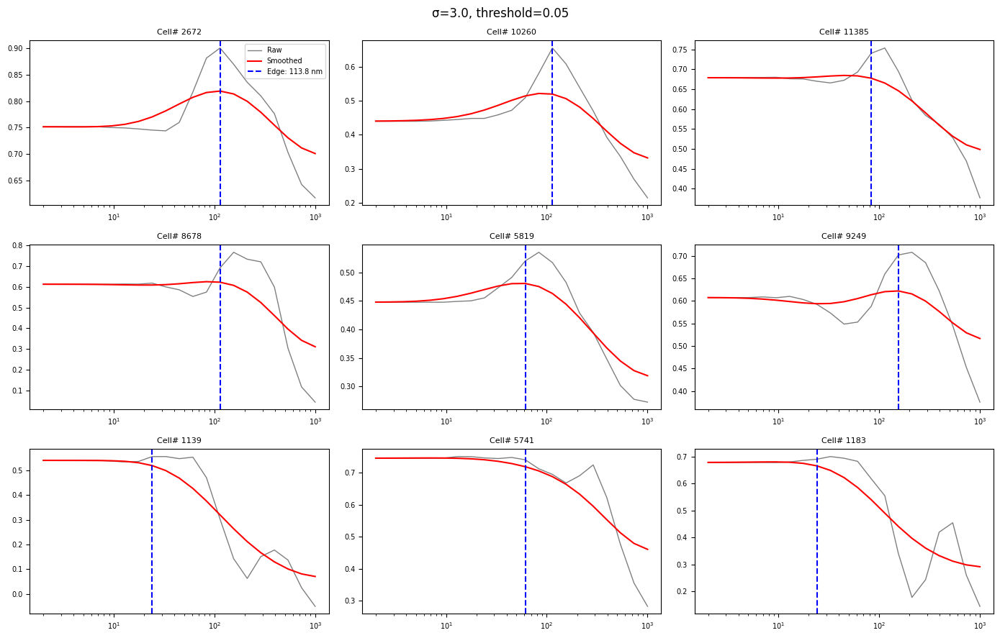

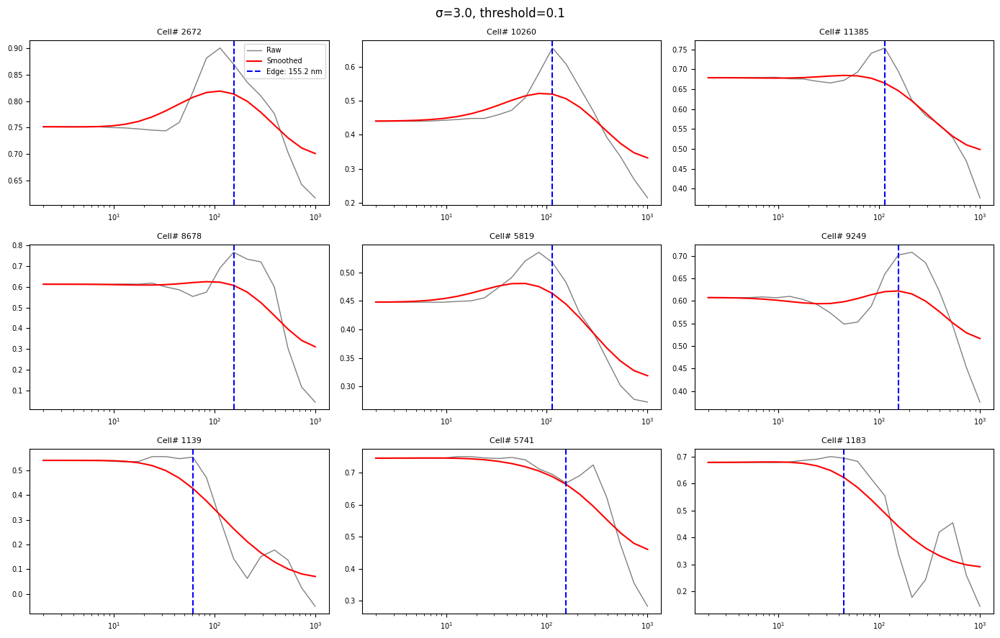

In [152]:
# ── Test different parameter combinations on a sample ─────────
rng = np.random.default_rng(42)
sample_idx = rng.choice(len(vals_valid), size=9, replace=False)

sigmas     = [1.0, 2.0, 3.0]
thresholds = [0.02, 0.05, 0.10]

for sigma, threshold in [(s, t) for s in sigmas for t in thresholds]:
    fig, axes = plt.subplots(3, 3, figsize=(14, 9))
    axes = axes.flatten()

    for ax, idx in zip(axes, sample_idx):
        profile = vals_valid[idx]
        edge    = find_plateau_edge(profile, diameter,
                                    sigma=sigma,
                                    drop_threshold=threshold)
        smooth  = gaussian_filter1d(profile, sigma=sigma)

        ax.plot(diameter, profile, 'k-',  linewidth=1,   alpha=0.5, label='Raw')
        ax.plot(diameter, smooth,  'r-',  linewidth=1.5, label='Smoothed')
        ax.axvline(edge, color='blue', linewidth=1.5,
                   linestyle='--', label=f'Edge: {edge:.1f} nm')
        ax.set_xscale('log')
        ax.set_title(f'Cell# {idx}', fontsize=8)
        ax.tick_params(labelsize=7)

    axes[0].legend(fontsize=7)
    fig.suptitle(f'σ={sigma}, threshold={threshold}', fontsize=12)
    plt.tight_layout()
    plt.show()

In [179]:
print(np.log10(diameter))


[0.30103 0.43603 0.57103 0.70603 0.84103 0.97603 1.11103 1.24603 1.38103
 1.51603 1.65103 1.78603 1.92103 2.05603 2.19103 2.32603 2.46103 2.59603
 2.73103 2.86603 3.00103]


Optimal k (Kneedle): 4


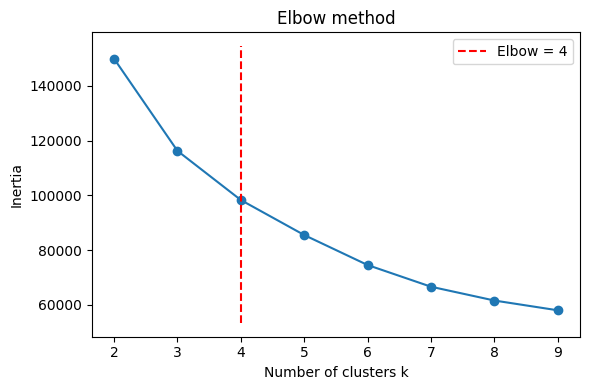

In [220]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from kneed import KneeLocator
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ── Extract data ──────────────────────────────────────────────
data = ds_alllevels.slope.sel(updraft_q='Total')

lat    = data.lat.values
lon    = data.lon.values
radius = data.radius.values

vals = data.values.reshape(-1, len(radius))  # (13824, 21)

# ── Handle NaNs ───────────────────────────────────────────────
nan_mask   = np.any(np.isnan(vals), axis=1)
valid_mask = ~nan_mask
vals_valid = vals[valid_mask]

# ── Standardize ───────────────────────────────────────────────
scaler     = StandardScaler()
vals_scaled = scaler.fit_transform(vals_valid)

# ── Elbow method with Kneedle ─────────────────────────────────
inertias = []
k_range  = range(2, 10)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(vals_scaled)
    inertias.append(km.inertia_)

# Detect elbow — convex + decreasing for inertia curves
kl = KneeLocator(list(k_range), inertias,
                 curve='convex',
                 direction='decreasing',
                 S=1.0)

print(f"Optimal k (Kneedle): {kl.elbow}")

# ── Plot ──────────────────────────────────────────────────────
plt.figure(figsize=(6, 4))
plt.plot(k_range, inertias, 'o-')
plt.vlines(kl.elbow, plt.ylim()[0], plt.ylim()[1],
           linestyles='--', colors='r',
           label=f'Elbow = {kl.elbow}')
plt.xlabel('Number of clusters k')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.legend()
plt.tight_layout()
plt.show()

Computing gradient-threshold method...
Computing Kneedle method...


/tmp/ipykernel_459229/3741905094.py:135: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


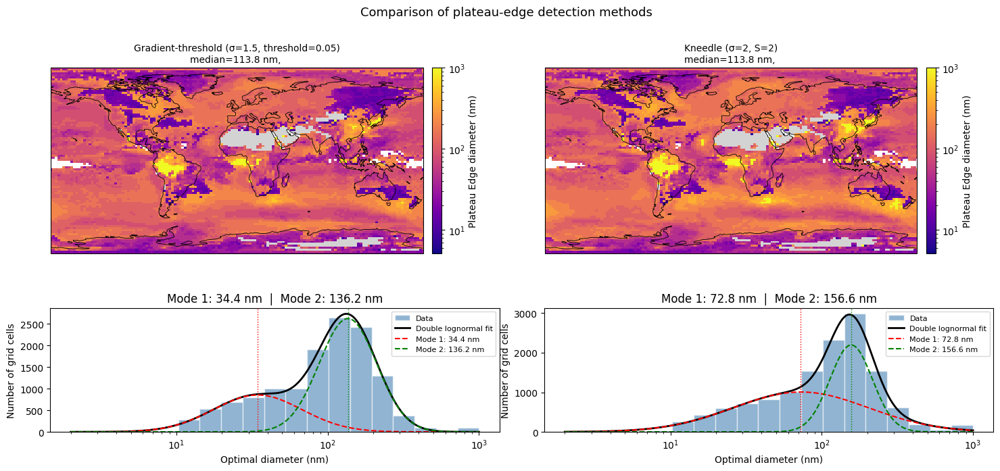

In [249]:
from scipy.stats import lognorm
from scipy.optimize import curve_fit
from kneed import KneeLocator
from scipy.ndimage import gaussian_filter1d

def double_gaussian(x, a1, mu1, sig1, a2, mu2, sig2):
    g1 = a1 * np.exp(-0.5 * ((x - mu1) / sig1) ** 2)
    g2 = a2 * np.exp(-0.5 * ((x - mu2) / sig2) ** 2)
    return g1 + g2

def fit_lognormal(optimal_diameters_valid, diameter):
    log_bins    = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)
    counts, edges = np.histogram(optimal_diameters_valid[np.isfinite(optimal_diameters_valid)],
                                 bins=log_bins)
    bin_centers = np.sqrt(edges[:-1] * edges[1:])
    log_centers = np.log10(bin_centers)
    p0 = [900, 1.0, 0.3, 2000, 2.1, 0.3]
    params, _ = curve_fit(double_gaussian, log_centers, counts, p0=p0, maxfev=10000)
    return params, log_bins, counts, bin_centers

# ── Compute both methods ──────────────────────────────────────
def find_plateau_edge(profile, diameter, sigma=1.0, drop_threshold=0.055):
    smooth        = gaussian_filter1d(profile, sigma=sigma)
    gradient      = np.gradient(smooth)
    profile_range = smooth.max() - smooth.min()
    if profile_range == 0:
        return np.nan
    norm_gradient   = gradient / profile_range
    decline_indices = np.where(norm_gradient < -drop_threshold)[0]
    if len(decline_indices) == 0:
        return diameter[-1]
    edge_idx = max(0, decline_indices[0] - 1)
    return diameter[edge_idx]

def find_plateau_edge_kneedle(profile, diameter, sigma=0.5, S=5):
    smooth = gaussian_filter1d(profile, sigma=sigma)
    kl = KneeLocator(
        x=np.log10(diameter), y=smooth,
        S=S, curve='concave', direction='decreasing',
        interp_method='interp1d', online=True
    )
    if kl.knee is None:
        return np.nan
    return 10 ** kl.knee

print("Computing gradient-threshold method...")
opt_grad = np.array([
    find_plateau_edge(vals_valid[idx], diameter, sigma=1.5, drop_threshold=0.05)
    for idx in range(len(vals_valid))
])

print("Computing Kneedle method...")
opt_knee = np.array([
    find_plateau_edge_kneedle(vals_valid[idx], diameter, sigma=2, S=2)
    for idx in range(len(vals_valid))
])

# ── Fit lognormals for both ───────────────────────────────────
params_grad, log_bins, _, _ = fit_lognormal(opt_grad, diameter)
params_knee, _,        _, _ = fit_lognormal(opt_knee, diameter)

log_bins = np.logspace(np.log10(diameter.min()), np.log10(diameter.max()), 20)
x_smooth     = np.linspace(np.log10(diameter.min()), np.log10(diameter.max()), 300)
x_smooth_lin = 10 ** x_smooth

# ── Rebuild 2D grids ──────────────────────────────────────────
def to_2d(opt_valid, nan_mask, valid_mask, lat, lon):
    full = np.full(len(nan_mask), np.nan)
    full[valid_mask] = opt_valid
    return full.reshape(len(lat), len(lon))

grad_2d = to_2d(opt_grad, nan_mask, valid_mask, lat, lon)
knee_2d = to_2d(opt_knee, nan_mask, valid_mask, lat, lon)

vmin = np.nanmin([np.nanmin(grad_2d), np.nanmin(knee_2d)])
vmax = np.nanmax([np.nanmax(grad_2d), np.nanmax(knee_2d)])

fig = plt.figure(figsize=(18, 7))
gs  = fig.add_gridspec(2, 2, hspace=0.35, wspace=0.1,
                        height_ratios=[1.5, 1])

map_axes  = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()),
             fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())]
hist_axes = [fig.add_subplot(gs[1, 0]),
             fig.add_subplot(gs[1, 1])]

methods = [
    (grad_2d, opt_grad, params_grad, 'Gradient-threshold (σ=1.5, threshold=0.05)'),
    (knee_2d, opt_knee, params_knee, 'Kneedle (σ=2, S=2)'),
]

cmap_map = plt.cm.plasma.copy()
cmap_map.set_bad(alpha=0)

for col, (data_2d, opt_valid, params, title) in enumerate(methods):

    # ── Map ───────────────────────────────────────────────────
    ax = map_axes[col]
    im = ax.pcolormesh(lon, lat,
                       np.ma.masked_invalid(data_2d),
                       cmap=cmap_map,
                       norm=mpl.colors.LogNorm(vmin=vmin, vmax=vmax),
                       transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
    cb = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cb.set_label('Plateau Edge diameter (nm)')
    ax.set_title(f'{title}\nmedian={np.nanmedian(opt_valid):.1f} nm, ', fontsize=10)

    # ── Histogram + double lognormal ──────────────────────────
    ax3 = hist_axes[col]
    a1, mu1, sig1, a2, mu2, sig2 = params
    med1, med2 = 10**mu1, 10**mu2

    ax3.hist(opt_valid[np.isfinite(opt_valid)],
             bins=log_bins, color='steelblue', edgecolor='white',
             alpha=0.6, label='Data')
    ax3.plot(x_smooth_lin, double_gaussian(x_smooth, *params),
             'k-', linewidth=2, label='Double lognormal fit')
    ax3.plot(x_smooth_lin,
             double_gaussian(x_smooth, a1, mu1, sig1, 0, mu2, sig2),
             'r--', linewidth=1.5, label=f'Mode 1: {med1:.1f} nm')
    ax3.plot(x_smooth_lin,
             double_gaussian(x_smooth, 0, mu1, sig1, a2, mu2, sig2),
             'g--', linewidth=1.5, label=f'Mode 2: {med2:.1f} nm')
    ax3.axvline(med1, color='red',   linewidth=1, linestyle=':')
    ax3.axvline(med2, color='green', linewidth=1, linestyle=':')
    ax3.set_xscale('log')
    ax3.set_xlabel('Optimal diameter (nm)')
    ax3.set_ylabel('Number of grid cells')
    ax3.set_title(f'Mode 1: {med1:.1f} nm  |  Mode 2: {med2:.1f} nm')
    ax3.legend(fontsize=8)

fig.suptitle('Comparison of plateau-edge detection methods', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

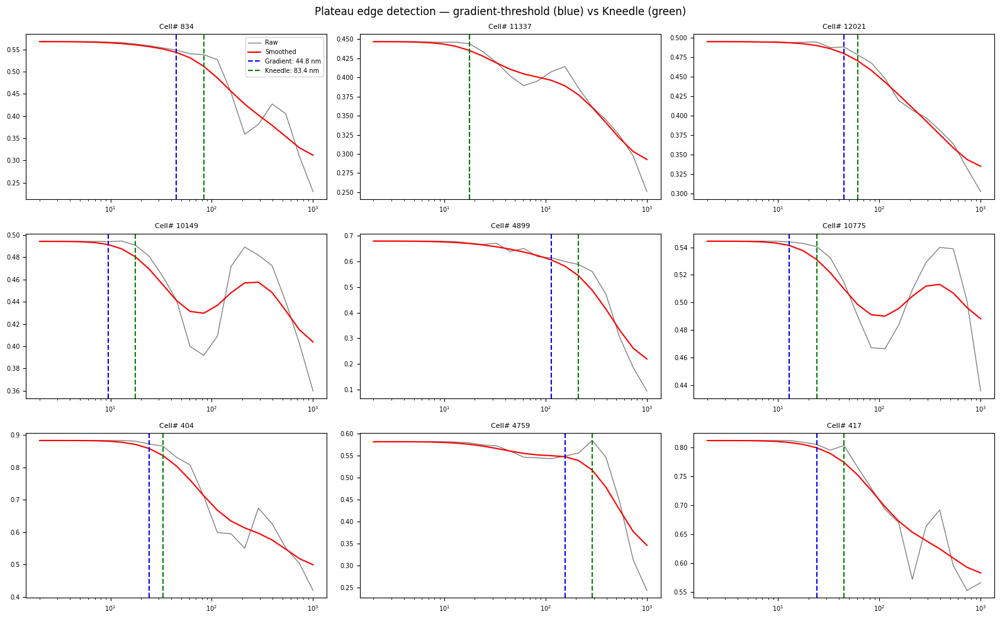

In [242]:
fig, axes = plt.subplots(3, 3, figsize=(16, 10))
axes = axes.flatten()

rng = np.random.default_rng(42)
sample_idx = rng.choice(np.where(is_smallest)[0], size=9, replace=False)

for ax, idx in zip(axes, sample_idx):
    profile = vals_valid[idx]
    smooth  = gaussian_filter1d(profile, sigma=2.0)

    edge_grad  = find_plateau_edge(profile, diameter, sigma=2.0, drop_threshold=0.05)
    edge_knee  = find_plateau_edge_kneedle(profile, diameter, sigma=0.5, S=5)

    ax.plot(diameter, profile, 'k-', linewidth=1,   alpha=0.5, label='Raw')
    ax.plot(diameter, smooth,  'r-', linewidth=1.5, label='Smoothed')
    ax.axvline(edge_grad, color='blue',  linewidth=1.5, linestyle='--',
               label=f'Gradient: {edge_grad:.1f} nm')
    ax.axvline(edge_knee, color='green', linewidth=1.5, linestyle='--',
               label=f'Kneedle: {edge_knee:.1f} nm')

    ax.set_xscale('log')
    ax.set_title(f'Cell# {idx}', fontsize=8)
    ax.tick_params(labelsize=7)

axes[0].legend(fontsize=7)
plt.suptitle('Plateau edge detection — gradient-threshold (blue) vs Kneedle (green)', fontsize=12)
plt.tight_layout()
plt.show()

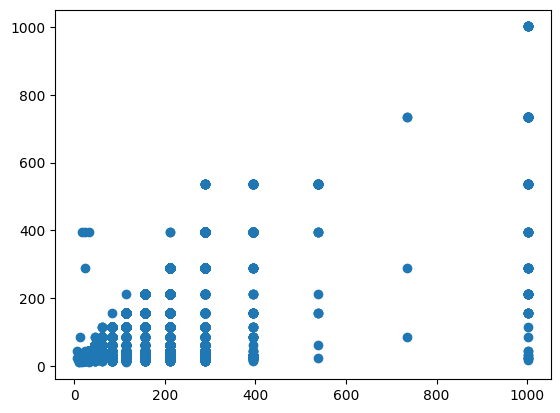

In [245]:
plt.scatter(grad_2d,knee_2d)

In [246]:
from itertools import product

# ── Parameter grids ───────────────────────────────────────────
sigmas_grad  = [1.0, 1.5, 2.0, 3.0]
thresholds   = [0.02, 0.05, 0.08, 0.10]
sigmas_knee  = [0.5, 1.0, 1.5, 2.0]
S_values     = [1.0, 2.0, 5.0, 10.0]

# ── Subsample for speed (use all if fast enough) ──────────────
rng        = np.random.default_rng(42)
sample_idx = rng.choice(len(vals_valid), size=500, replace=False)
vals_sample = vals_valid[sample_idx]

# ── Agreement metrics ─────────────────────────────────────────
def agreement(opt1, opt2):
    """Metrics comparing two arrays of optimal diameters (log space)."""
    valid    = np.isfinite(opt1) & np.isfinite(opt2)
    log_diff = np.log10(opt1[valid]) - np.log10(opt2[valid])
    return {
        'mean_abs_log_diff': np.abs(log_diff).mean(),   # lower = better
        'median_abs_log_diff': np.median(np.abs(log_diff)),
        'correlation': np.corrcoef(np.log10(opt1[valid]),
                                   np.log10(opt2[valid]))[0, 1],
        'nan_frac_grad': (~np.isfinite(opt1)).mean(),
        'nan_frac_knee': (~np.isfinite(opt2)).mean(),
        'n_valid': valid.sum(),
    }

# ── Grid search ───────────────────────────────────────────────
results = []

total = len(sigmas_grad) * len(thresholds) * len(sigmas_knee) * len(S_values)
print(f"Running {total} parameter combinations on {len(vals_sample)} sampled cells...\n")

for sg, thr, sk, S in product(sigmas_grad, thresholds, sigmas_knee, S_values):
    opt_grad = np.array([
        find_plateau_edge(vals_sample[i], diameter, sigma=sg, drop_threshold=thr)
        for i in range(len(vals_sample))
    ])
    opt_knee = np.array([
        find_plateau_edge_kneedle(vals_sample[i], diameter, sigma=sk, S=S)
        for i in range(len(vals_sample))
    ])

    metrics = agreement(opt_grad, opt_knee)
    results.append({
        'sigma_grad': sg, 'threshold': thr,
        'sigma_knee': sk, 'S': S,
        **metrics
    })

import pandas as pd
df = pd.DataFrame(results).sort_values('mean_abs_log_diff')

print("Top 10 parameter combinations by mean abs log difference:\n")
print(df[['sigma_grad', 'threshold', 'sigma_knee', 'S',
          'mean_abs_log_diff', 'median_abs_log_diff', 'correlation']
         ].head(10).to_string(index=False))

Running 256 parameter combinations on 500 sampled cells...

Top 10 parameter combinations by mean abs log difference:

 sigma_grad  threshold  sigma_knee   S  mean_abs_log_diff  median_abs_log_diff  correlation
        1.5       0.05         2.0 2.0            0.06696                0.000     0.929328
        1.5       0.05         2.0 1.0            0.06696                0.000     0.929328
        1.0       0.05         1.5 1.0            0.07263                0.000     0.909764
        1.0       0.05         1.5 2.0            0.07263                0.000     0.909764
        1.0       0.05         1.0 2.0            0.07290                0.000     0.949255
        1.0       0.05         1.0 1.0            0.07290                0.000     0.949255
        1.0       0.05         1.5 5.0            0.07479                0.000     0.899922
        1.0       0.05         1.0 5.0            0.07506                0.000     0.939525
        2.0       0.05         2.0 2.0            0.0

Computing on full dataset...

Full dataset agreement (n=13,264):
  Mean |Δlog10|:    0.0625  (~15% diameter difference)
  Median |Δlog10|:  0.0000
  Correlation:      0.9421
  NaN frac (grad):  0.0%
  NaN frac (knee):  0.0%


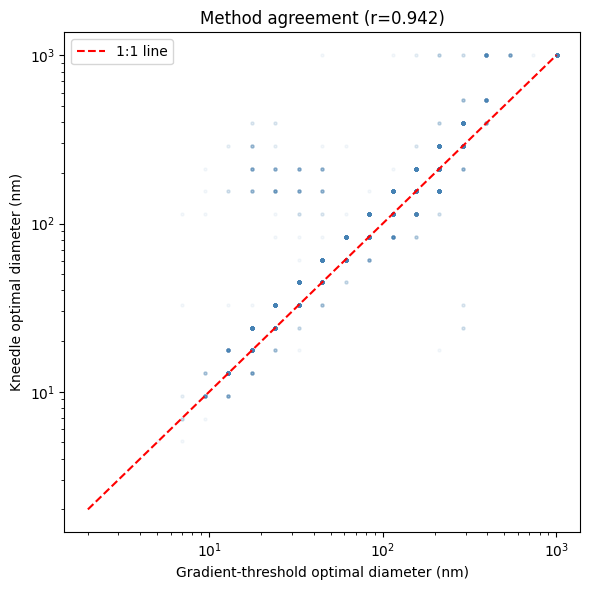

In [247]:
# ── Rerun on full dataset with best parameters ────────────────
best_sigma_grad  = 1.5
best_threshold   = 0.05
best_sigma_knee  = 2.0
best_S           = 1.0   # S doesn't matter much, use 1.0

print("Computing on full dataset...")

opt_grad = np.array([
    find_plateau_edge(vals_valid[idx], diameter,
                      sigma=best_sigma_grad,
                      drop_threshold=best_threshold)
    for idx in range(len(vals_valid))
])

opt_knee = np.array([
    find_plateau_edge_kneedle(vals_valid[idx], diameter,
                              sigma=best_sigma_knee,
                              S=best_S)
    for idx in range(len(vals_valid))
])

# ── Full dataset agreement ────────────────────────────────────
metrics = agreement(opt_grad, opt_knee)
print(f"\nFull dataset agreement (n={len(vals_valid):,}):")
print(f"  Mean |Δlog10|:    {metrics['mean_abs_log_diff']:.4f}  (~{100*(10**metrics['mean_abs_log_diff']-1):.0f}% diameter difference)")
print(f"  Median |Δlog10|:  {metrics['median_abs_log_diff']:.4f}")
print(f"  Correlation:      {metrics['correlation']:.4f}")
print(f"  NaN frac (grad):  {metrics['nan_frac_grad']*100:.1f}%")
print(f"  NaN frac (knee):  {metrics['nan_frac_knee']*100:.1f}%")

# ── Scatter plot of the two methods ──────────────────────────
valid = np.isfinite(opt_grad) & np.isfinite(opt_knee)
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(opt_grad[valid], opt_knee[valid],
           alpha=0.05, s=5, color='steelblue')
ax.plot([diameter.min(), diameter.max()],
        [diameter.min(), diameter.max()],
        'r--', linewidth=1.5, label='1:1 line')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Gradient-threshold optimal diameter (nm)')
ax.set_ylabel('Kneedle optimal diameter (nm)')
ax.set_title(f'Method agreement (r={metrics["correlation"]:.3f})')
ax.legend()
plt.tight_layout()
plt.show()

Cells with >2x diameter disagreement: 212 (1.6%)


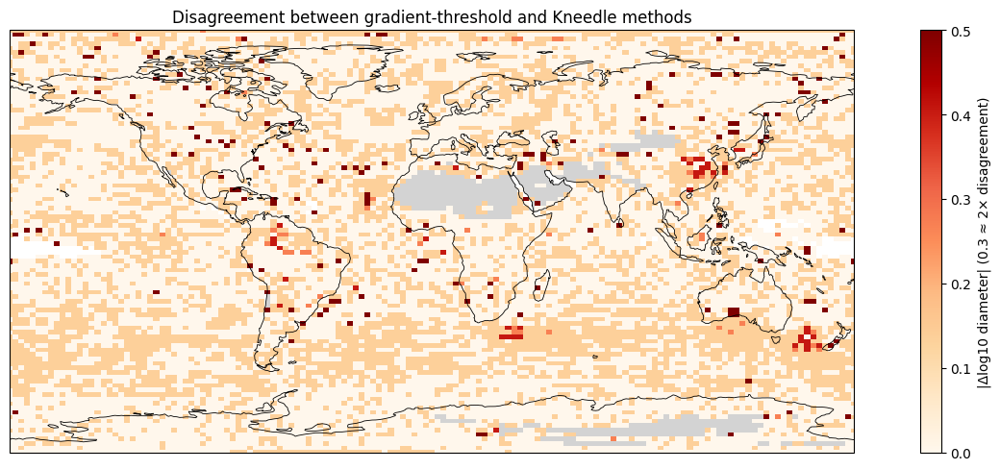

In [250]:
# ── Where do the methods disagree most? ───────────────────────
valid    = np.isfinite(opt_grad) & np.isfinite(opt_knee)
log_diff = np.abs(np.log10(opt_grad[valid]) - np.log10(opt_knee[valid]))

# Top disagreement threshold — e.g. > 0.3 log units (~2x diameter)
disagree_mask = log_diff > 0.3
print(f"Cells with >2x diameter disagreement: {disagree_mask.sum()} "
      f"({100*disagree_mask.mean():.1f}%)")

# Map the disagreement
diff_full = np.full(len(nan_mask), np.nan)
diff_full[valid_mask] = np.where(valid, log_diff, np.nan)
diff_2d   = diff_full.reshape(len(lat), len(lon))

fig, ax = plt.subplots(figsize=(14, 5),
                       subplot_kw={'projection': ccrs.PlateCarree()})
cmap_diff = plt.cm.OrRd.copy()
cmap_diff.set_bad(alpha=0)
im = ax.pcolormesh(lon, lat, np.ma.masked_invalid(diff_2d),
                   cmap=cmap_diff, vmin=0, vmax=0.5,
                   transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=0)
plt.colorbar(im, ax=ax, label='|Δlog10 diameter|').set_label(
    '|Δlog10 diameter| (0.3 ≈ 2× disagreement)')
ax.set_title('Disagreement between gradient-threshold and Kneedle methods')
plt.tight_layout()
plt.show()

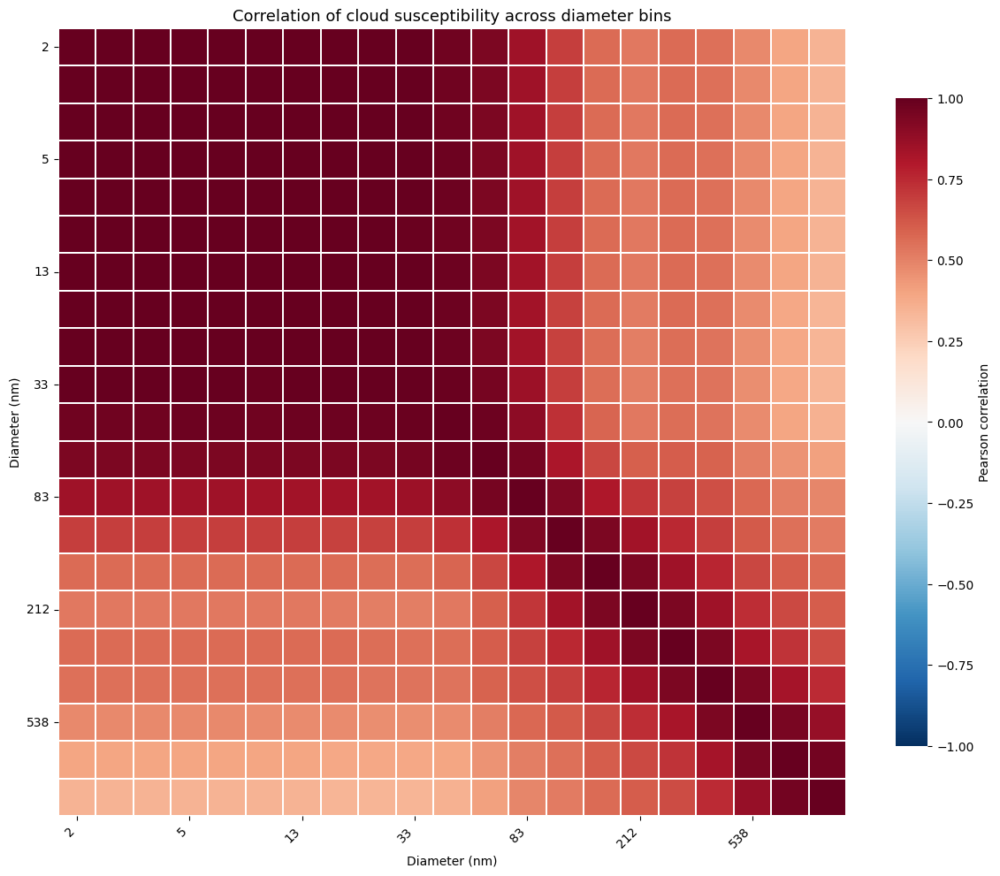

Most negatively correlated pairs:
Diameter 1 Diameter 2  Correlation
   32.8 nm  1002.4 nm     0.338103
   24.0 nm  1002.4 nm     0.338351
   17.6 nm  1002.4 nm     0.343202
   12.9 nm  1002.4 nm     0.345761
    9.5 nm  1002.4 nm     0.347007

Most positively correlated pairs (excluding self):
Diameter 1 Diameter 2  Correlation
    2.7 nm     5.1 nm     0.999991
    3.7 nm     5.1 nm     0.999991
    2.0 nm     3.7 nm     1.000000
    2.7 nm     3.7 nm     1.000000
    2.0 nm     2.7 nm     1.000000


In [251]:
import pandas as pd
import seaborn as sns

# ── Build dataframe: one row per grid cell ────────────────────
# vals_valid shape: (13264, 21) — slope at each diameter
df_corr = pd.DataFrame(
    vals_valid,
    columns=[f'{d:.1f} nm' for d in diameter]
)

# ── Compute correlation matrix ────────────────────────────────
corr_matrix = df_corr.corr()

# ── Plot ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(
    corr_matrix,
    ax=ax,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    center=0,
    square=True,
    linewidths=0.3,
    annot=False,
    cbar_kws={'label': 'Pearson correlation', 'shrink': 0.8}
)

ax.set_title('Correlation of cloud susceptibility across diameter bins', fontsize=13)
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Diameter (nm)')

# Thin out tick labels to avoid overcrowding
n_ticks = len(diameter)
tick_every = 3
ax.set_xticks(np.arange(0, n_ticks, tick_every) + 0.5)
ax.set_yticks(np.arange(0, n_ticks, tick_every) + 0.5)
ax.set_xticklabels([f'{d:.0f}' for d in diameter[::tick_every]], rotation=45, ha='right')
ax.set_yticklabels([f'{d:.0f}' for d in diameter[::tick_every]], rotation=0)

plt.tight_layout()
plt.show()

# ── Print strongest and weakest correlations ──────────────────
# Get upper triangle only
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
corr_pairs = upper.stack().reset_index()
corr_pairs.columns = ['Diameter 1', 'Diameter 2', 'Correlation']
corr_pairs = corr_pairs.sort_values('Correlation')

print("Most negatively correlated pairs:")
print(corr_pairs.head(5).to_string(index=False))
print("\nMost positively correlated pairs (excluding self):")
print(corr_pairs.tail(5).to_string(index=False))

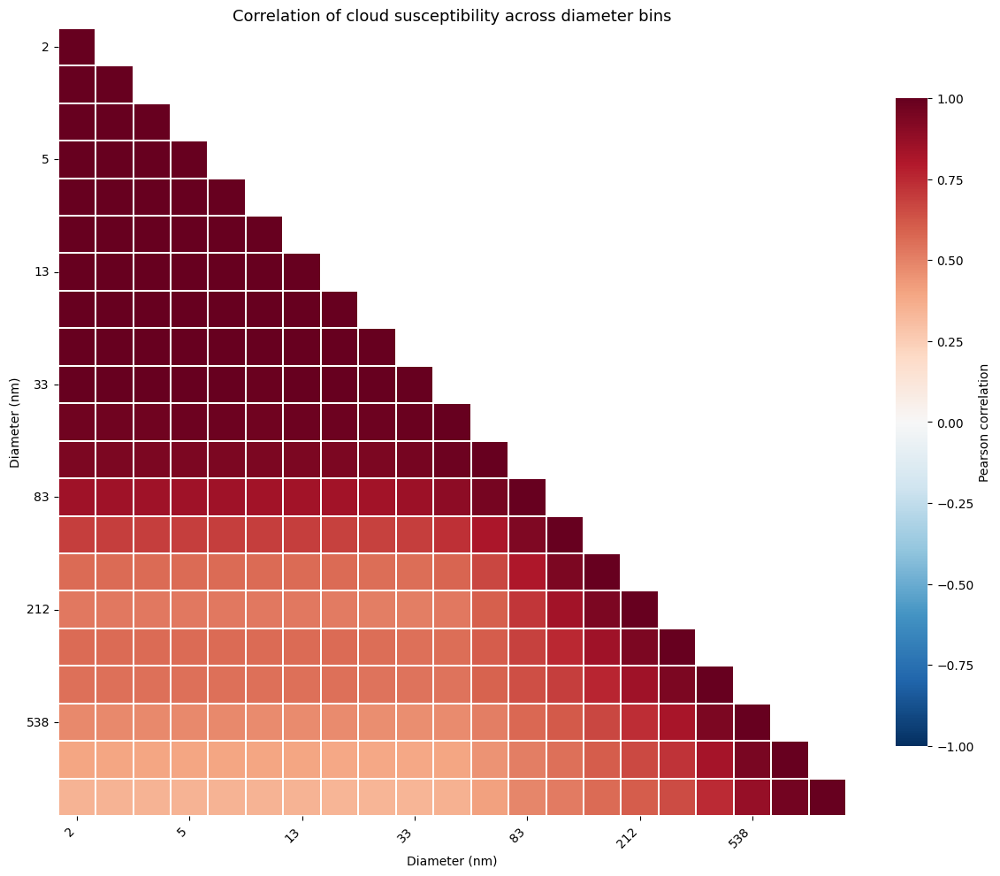

In [252]:
fig, ax = plt.subplots(figsize=(12, 10))

# Generate mask for upper triangle
mask = np.triu(np.ones(corr_matrix.shape), k=1)  # mask upper triangle, keep lower

sns.heatmap(
    corr_matrix,
    ax=ax,
    mask=mask,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    center=0,
    square=True,
    linewidths=0.3,
    annot=False,
    cbar_kws={'label': 'Pearson correlation', 'shrink': 0.8}
)

ax.set_title('Correlation of cloud susceptibility across diameter bins', fontsize=13)
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Diameter (nm)')

tick_every = 3
ax.set_xticks(np.arange(0, len(diameter), tick_every) + 0.5)
ax.set_yticks(np.arange(0, len(diameter), tick_every) + 0.5)
ax.set_xticklabels([f'{d:.0f}' for d in diameter[::tick_every]], rotation=45, ha='right')
ax.set_yticklabels([f'{d:.0f}' for d in diameter[::tick_every]], rotation=0)

plt.tight_layout()
plt.show()


Optimal diameter (argmax vs plateau-edge methods):

  Cluster 0 (n=2,920):
    Argmax:    83.4 nm  (slope=0.8009)
    Gradient:  83.4 nm  (slope=0.8009)
    Kneedle:   83.4 nm  (slope=0.8009)

  Cluster 1 (n=4,586):
    Argmax:    113.8 nm  (slope=0.4543)
    Gradient:  113.8 nm  (slope=0.4543)
    Kneedle:   155.2 nm  (slope=0.4476)

  Cluster 2 (n=5,247):
    Argmax:    113.8 nm  (slope=0.6422)
    Gradient:  113.8 nm  (slope=0.6422)
    Kneedle:   155.2 nm  (slope=0.6265)

  Cluster 3 (n=511):
    Argmax:    155.2 nm  (slope=0.3770)
    Gradient:  211.9 nm  (slope=0.3660)
    Kneedle:   289.1 nm  (slope=0.3392)

  Overall (n=13,264):
    Argmax:   113.8 nm
    Gradient: 113.8 nm
    Kneedle:  155.2 nm


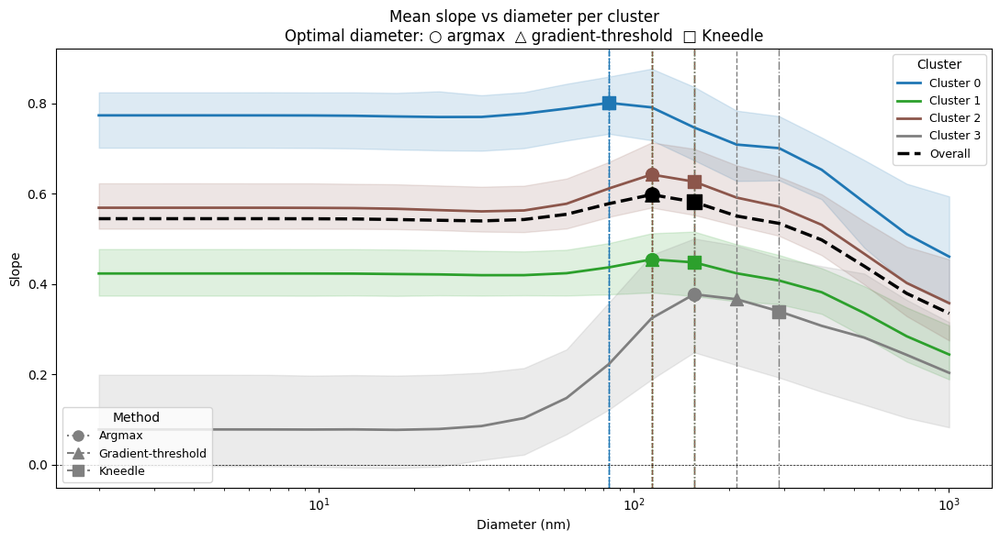

In [272]:
from scipy.ndimage import gaussian_filter1d
from kneed import KneeLocator
k = 4
diameter = radius * 2  # nm

print("Optimal diameter (argmax vs plateau-edge methods):\n")

fig, ax = plt.subplots(figsize=(11, 6))

for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean = cluster_vals.mean(axis=0)
    q25  = np.percentile(cluster_vals, 25, axis=0)
    q75  = np.percentile(cluster_vals, 75, axis=0)

    # ── Three methods on the cluster mean profile ─────────────
    # 1. Argmax
    argmax_idx  = np.argmax(mean)
    argmax_diam = diameter[argmax_idx]
    argmax_slope = mean[argmax_idx]

    # 2. Gradient-threshold
    grad_diam  = find_plateau_edge(mean, diameter,
                                   sigma=1.5, drop_threshold=0.05)
    grad_slope = mean[np.argmin(np.abs(diameter - grad_diam))]

    # 3. Kneedle
    knee_diam  = find_plateau_edge_kneedle(mean, diameter,
                                           sigma=2.0, S=1.0)
    knee_slope = mean[np.argmin(np.abs(diameter - knee_diam))] if np.isfinite(knee_diam) else np.nan

    print(f"  Cluster {i} (n={(labels_valid==i).sum():,}):")
    print(f"    Argmax:    {argmax_diam:.1f} nm  (slope={argmax_slope:.4f})")
    print(f"    Gradient:  {grad_diam:.1f} nm  (slope={grad_slope:.4f})")
    print(f"    Kneedle:   {knee_diam:.1f} nm  (slope={knee_slope:.4f})\n")

    color = mpl.colormaps['tab10'](i / k)

    ax.plot(diameter, mean, color=color, linewidth=2,
            label=f'Cluster {i}')
    ax.fill_between(diameter, q25, q75, color=color, alpha=0.15)

    # Argmax — circle
    ax.scatter(argmax_diam, argmax_slope, color=color,
               s=100, zorder=5, marker='o')
    ax.axvline(argmax_diam, color=color, linewidth=1, linestyle=':')

    # Gradient — triangle
    ax.scatter(grad_diam, grad_slope, color=color,
               s=100, zorder=5, marker='^')
    ax.axvline(grad_diam, color=color, linewidth=1, linestyle='--')

    # Kneedle — square
    if np.isfinite(knee_diam):
        ax.scatter(knee_diam, knee_slope, color=color,
                   s=100, zorder=5, marker='s')
        ax.axvline(knee_diam, color=color, linewidth=1, linestyle='-.')

# ── Overall ───────────────────────────────────────────────────
overall_mean = vals_valid.mean(axis=0)

overall_argmax_diam  = diameter[np.argmax(overall_mean)]
overall_grad_diam    = find_plateau_edge(overall_mean, diameter,
                                         sigma=1.5, drop_threshold=0.05)
overall_knee_diam    = find_plateau_edge_kneedle(overall_mean, diameter,
                                                  sigma=2.0, S=1.0)

print(f"  Overall (n={len(vals_valid):,}):")
print(f"    Argmax:   {overall_argmax_diam:.1f} nm")
print(f"    Gradient: {overall_grad_diam:.1f} nm")
print(f"    Kneedle:  {overall_knee_diam:.1f} nm")

ax.plot(diameter, overall_mean, color='black', linewidth=2.5,
        linestyle='--', label='Overall')
ax.scatter(overall_argmax_diam, overall_mean[np.argmax(overall_mean)],
           color='black', s=120, marker='o', zorder=6)
ax.scatter(overall_grad_diam,
           overall_mean[np.argmin(np.abs(diameter - overall_grad_diam))],
           color='black', s=120, marker='^', zorder=6)
if np.isfinite(overall_knee_diam):
    ax.scatter(overall_knee_diam,
               overall_mean[np.argmin(np.abs(diameter - overall_knee_diam))],
               color='black', s=120, marker='s', zorder=6)

# ── Legend entries for methods ────────────────────────────────
from matplotlib.lines import Line2D
method_legend = [
    Line2D([0], [0], marker='o', color='gray', linestyle=':',
           markersize=8, label='Argmax'),
    Line2D([0], [0], marker='^', color='gray', linestyle='--',
           markersize=8, label='Gradient-threshold'),
    Line2D([0], [0], marker='s', color='gray', linestyle='-.',
           markersize=8, label='Kneedle'),
]
legend1 = ax.legend(handles=method_legend, loc='lower left', fontsize=9,
                    title='Method')
ax.add_artist(legend1)
ax.legend(loc='upper right', fontsize=9, title='Cluster')

ax.set_xscale('log')
ax.set_xlabel('Diameter (nm)')
ax.set_ylabel('Slope')
ax.set_title('Mean slope vs diameter per cluster\n'
             'Optimal diameter: ○ argmax  △ gradient-threshold  □ Kneedle')
ax.axhline(0, color='k', linewidth=0.5, linestyle='--')
plt.tight_layout()
plt.show()

In [275]:
def methods_agree(d1, d2, d3, tol=1e-6):
    """Check if all three diameters are identical within floating point tolerance."""
    all_equal = (abs(d1 - d2) < tol) and (abs(d1 - d3) < tol)
    max_logdiff = max(
        abs(np.log10(d1) - np.log10(d2)),
        abs(np.log10(d1) - np.log10(d3)),
        abs(np.log10(d2) - np.log10(d3))
    )
    if all_equal:
        return '✓'
    elif max_logdiff < 0.2:
        return '~'
    else:
        return '✗'

rows = []
for i in range(k):
    cluster_vals = vals_valid[labels_valid == i]
    mean = cluster_vals.mean(axis=0)

    argmax_diam = diameter[np.argmax(mean)]
    grad_diam   = find_plateau_edge(mean, diameter, sigma=1.5, drop_threshold=0.05)
    knee_diam   = find_plateau_edge_kneedle(mean, diameter, sigma=2.0, S=1.0)

    rows.append({
        'Cluster':       i,
        'n':             (labels_valid == i).sum(),
        'Argmax (nm)':   f'{argmax_diam:.1f}',
        'Gradient (nm)': f'{grad_diam:.1f}',
        'Kneedle (nm)':  f'{knee_diam:.1f}' if np.isfinite(knee_diam) else 'NaN',
        'Agreement':     methods_agree(argmax_diam, grad_diam, knee_diam),
    })

overall_mean   = vals_valid.mean(axis=0)
overall_argmax = diameter[np.argmax(overall_mean)]
overall_grad   = find_plateau_edge(overall_mean, diameter, sigma=1.5, drop_threshold=0.05)
overall_knee   = find_plateau_edge_kneedle(overall_mean, diameter, sigma=2.0, S=1.0)

rows.append({
    'Cluster':       'Overall',
    'n':             len(vals_valid),
    'Argmax (nm)':   f'{overall_argmax:.1f}',
    'Gradient (nm)': f'{overall_grad:.1f}',
    'Kneedle (nm)':  f'{overall_knee:.1f}',
    'Agreement':     methods_agree(overall_argmax, overall_grad, overall_knee),
})

df_summary = pd.DataFrame(rows)
print(df_summary.to_string(index=False))

Cluster     n Argmax (nm) Gradient (nm) Kneedle (nm) Agreement
      0  2920        83.4          83.4         83.4         ✓
      1  4586       113.8         113.8        155.2         ~
      2  5247       113.8         113.8        155.2         ~
      3   511       155.2         211.9        289.1         ✗
Overall 13264       113.8         113.8        155.2         ~


In [276]:
smax = xr.open_dataset("/share/pech2273/smax_ratios/smax_ratios.nc")


In [281]:
print(smax)
print(ds)

<xarray.Dataset> Size: 13GB
Dimensions:      (lat: 96, lon: 144, lev: 10, time: 11689)
Coordinates:
  * lat          (lat) float64 768B -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * lon          (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * lev          (lev) float64 80B 691.4 763.4 820.9 859.5 ... 957.5 976.3 992.6
  * time         (time) datetime64[ns] 94kB 2011-01-01 ... 2015-01-01
Data variables:
    cldv_ratio   (time, lev, lat, lon) float32 6GB ...
    incld_ratio  (time, lev, lat, lon) float32 6GB ...
<xarray.DataArray 'CDNC' (time: 11689, lev: 10, lat: 96, lon: 144)> Size: 6GB
dask.array<open_dataset-CDNC, shape=(11689, 10, 96, 144), dtype=float32, chunksize=(50, 1, 96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 768B -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * lon      (lon) float64 1kB 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * lev      (lev) float64 80B 691.4 763.4 820.9 859.5 ... 957.5 976.3 992.6
  * time     

In [279]:
ds

<xarray.DataArray 'CDNC' (time: 11689, lev: 10, lat: 96, lon: 144)> Size: 6GB
dask.array<open_dataset-CDNC, shape=(11689, 10, 96, 144), dtype=float32, chunksize=(50, 1, 96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 768B -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * lon      (lon) float64 1kB 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * lev      (lev) float64 80B 691.4 763.4 820.9 859.5 ... 957.5 976.3 992.6
  * time     (time) datetime64[ns] 94kB 2011-01-01 ... 2015-01-01
Attributes:
    mdims:      1
    long_name:  Cloud Droplet Number Concentration
    units:      cm-3

In [284]:
# if ds is a Dataset containing CDNC:
fields = {
    'cldv_ratio':  smax['cldv_ratio'],
    'incld_ratio': smax['incld_ratio'],
    'CDNC':        ds,
}

# if ds IS the CDNC DataArray already, use this line instead:
#   'CDNC': ds,

In [285]:
for name, da in fields.items():
    print(name, '|', type(da).__name__, '|', dict(da.sizes))

cldv_ratio | DataArray | {'time': 11689, 'lev': 10, 'lat': 96, 'lon': 144}
incld_ratio | DataArray | {'time': 11689, 'lev': 10, 'lat': 96, 'lon': 144}
CDNC | DataArray | {'time': 11689, 'lev': 10, 'lat': 96, 'lon': 144}


In [289]:
import pandas as pd
import numpy as np

rows = []
for name, da in fields.items():
    valid = da.count().compute().item()
    total = da.size

    # subsample, load to numpy, flatten, drop NaN
    arr = da.isel(time=slice(0, None, 20)).values.ravel()
    arr = arr[np.isfinite(arr)]

    rows.append({
        'variable': name,
        'mean':   float(da.mean().compute()),
        'std':    float(da.std().compute()),
        'min':    float(da.min().compute()),
        'p25':    float(np.nanquantile(arr, 0.25)),
        'median': float(np.nanquantile(arr, 0.50)),
        'p75':    float(np.nanquantile(arr, 0.75)),
        'max':    float(da.max().compute()),
        'valid_frac': valid / total,
    })

stats = pd.DataFrame(rows).set_index('variable')
stats

,mean,std,min,p25,median,p75,max,valid_frac
variable,,,,,,,,
cldv_ratio,3.703840e-03,6.962569e-03,0.000113,1.938535e-03,2.924615e-03,5.306725e-03,7.190025e-01,0.035527
incld_ratio,2.434734e-03,5.608601e-03,0.000113,2.176100e-03,3.116033e-03,5.039138e-03,7.190025e-01,0.074746
CDNC,3.387890e+07,4.348479e+07,505863.531250,9.408667e+06,2.065323e+07,4.178536e+07,2.328415e+09,0.074746


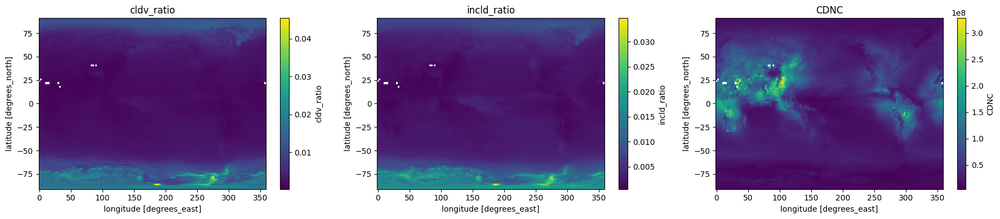

In [290]:
# reduce over time AND lev to get a lat-lon map; mean skips NaN
maps = {name: da.mean(dim=['time', 'lev']).compute() for name, da in fields.items()}

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
for ax, (name, m) in zip(axes, maps.items()):
    im = m.plot(ax=ax, cmap='viridis', add_colorbar=True,
                cbar_kwargs={'label': name})
    ax.set_title(name)
plt.tight_layout()
plt.show()

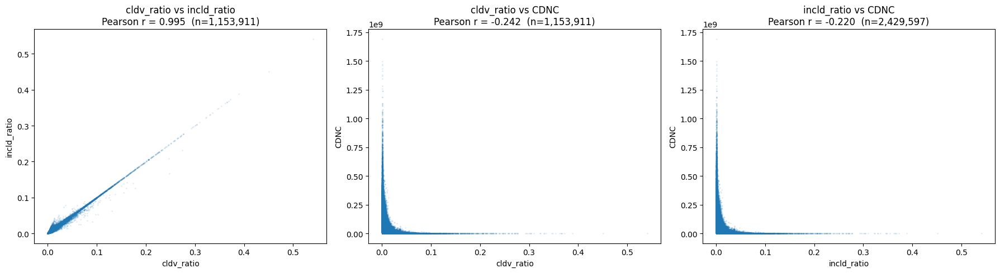

In [291]:
# Flatten to 1-D, drop NaN. Subsample so the scatter is plottable and fast.
def flat_sample(da, step=50):
    a = da.isel(time=slice(0, None, step)).values.ravel()
    return a

samples = {name: flat_sample(da) for name, da in fields.items()}

# align on common valid (non-NaN) points for pairwise comparison
import itertools
pairs = list(itertools.combinations(fields.keys(), 2))

fig, axes = plt.subplots(1, len(pairs), figsize=(6*len(pairs), 5))
if len(pairs) == 1: axes = [axes]
for ax, (x, y) in zip(axes, pairs):
    xa, ya = samples[x], samples[y]
    mask = np.isfinite(xa) & np.isfinite(ya)
    xv, yv = xa[mask], ya[mask]
    ax.scatter(xv, yv, s=1, alpha=0.1)
    r = np.corrcoef(xv, yv)[0, 1]
    ax.set_xlabel(x); ax.set_ylabel(y)
    ax.set_title(f'{x} vs {y}\nPearson r = {r:.3f}  (n={mask.sum():,})')
plt.tight_layout()
plt.show()

In [292]:
from scipy.stats import spearmanr
rho, _ = spearmanr(xv, yv)   # xv, yv = the masked pair from a scatter
print('Spearman rho =', rho)

Spearman rho = -0.5287294214398218


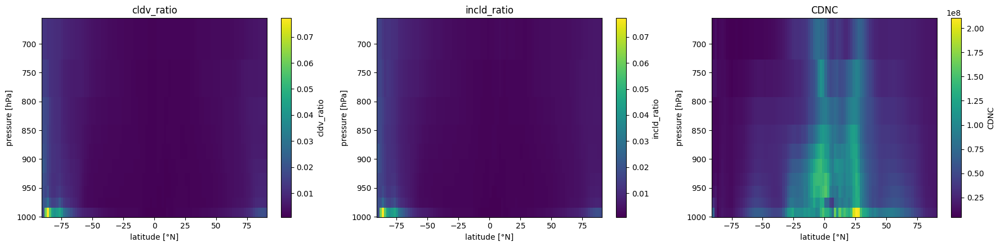

In [293]:
import numpy as np
import matplotlib.pyplot as plt

# zonal + time mean → (lev, lat) for each field
sections = {name: da.mean(dim=['time', 'lon']).compute() for name, da in fields.items()}

fig, axes = plt.subplots(1, 3, figsize=(18, 4.5))
for ax, (name, sec) in zip(axes, sections.items()):
    # sec dims are (lev, lat); pcolormesh wants (y, x) = (lev, lat)
    im = ax.pcolormesh(sec['lat'], sec['lev'], sec.values,
                       cmap='viridis', shading='auto')
    ax.invert_yaxis()                      # surface (high hPa) at bottom
    ax.set_xlabel('latitude [°N]')
    ax.set_ylabel('pressure [hPa]')
    ax.set_title(name)
    fig.colorbar(im, ax=ax, label=name)
plt.tight_layout()
plt.show()

In [294]:
import numpy as np
import xarray as xr
from scipy.special import erfcinv
from scipy.stats import pearsonr, spearmanr

# --- your DataArrays ---
# smax, cdnc  (already in your notebook)

# 1. Flatten and drop NaNs / nonpositive S_max (log needs > 0)
s = smax.cldv_ratio.values.ravel()
c = ds.values.ravel()
m = np.isfinite(s) & np.isfinite(c) & (s > 0) & (c > 0)
s, c = s[m], c[m]

log_s = np.log(s)

def report(name, x, y):
    r, _ = pearsonr(x, y)
    rho, _ = spearmanr(x, y)
    print(f"{name:34s} Pearson r = {r:+.4f}   Spearman = {rho:+.4f}")

print("="*64)
report("raw S_max      vs CDNC", s, c)
report("ln(S_max)      vs CDNC", log_s, c)

# 2. Optional probit transform using a ceiling proxy (no true N_total).
#    N is unknown, so we approximate the activated fraction with a ceiling
#    slightly above the max observed CDNC. Treat this result as indicative,
#    not definitive — it's only as good as the proxy.
N_proxy = c.max() * 1.02
frac = np.clip(c / N_proxy, 1e-6, 1 - 1e-6)
probit = erfcinv(2.0 * frac)
report("ln(S_max)      vs erfc^-1(2*frac)", log_s, probit)
print("="*64)
print("Spearman is the same across transforms (rank-based) -> your ceiling.")
print("Sign on the probit row is negative by construction; magnitude matters.")

raw S_max      vs CDNC             Pearson r = -0.2446   Spearman = -0.5618
ln(S_max)      vs CDNC             Pearson r = -0.4325   Spearman = -0.5618
ln(S_max)      vs erfc^-1(2*frac)  Pearson r = +0.5956   Spearman = +0.5618
Spearman is the same across transforms (rank-based) -> your ceiling.
Sign on the probit row is negative by construction; magnitude matters.


In [4]:
Updraft = xr.open_dataset("/share/pech2273/smax_ratios/WSUB.nc")
NorPath = "/share/pech2273/combined.nc"
CDNC = xr.open_dataset(NorPath, chunks={})
smax = xr.open_dataset("/share/pech2273/smax_ratios/smax_ratios.nc")
CDNC = CDNC.CDNC

In [6]:
print(CDNC)
print(smax)
print(Updraft)

<xarray.DataArray 'CDNC' (time: 11689, lev: 10, lat: 96, lon: 144)> Size: 6GB
dask.array<open_dataset-CDNC, shape=(11689, 10, 96, 144), dtype=float32, chunksize=(50, 1, 96, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 768B -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * lon      (lon) float64 1kB 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * lev      (lev) float64 80B 691.4 763.4 820.9 859.5 ... 957.5 976.3 992.6
  * time     (time) datetime64[ns] 94kB 2011-01-01 ... 2015-01-01
Attributes:
    mdims:      1
    long_name:  Cloud Droplet Number Concentration
    units:      cm-3
<xarray.Dataset> Size: 13GB
Dimensions:      (lat: 96, lon: 144, lev: 10, time: 11689)
Coordinates:
  * lat          (lat) float64 768B -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * lon          (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * lev          (lev) float64 80B 691.4 763.4 820.9 859.5 ... 957.5 976.3 992.6
  * time         (time) datetime64[ns] 94

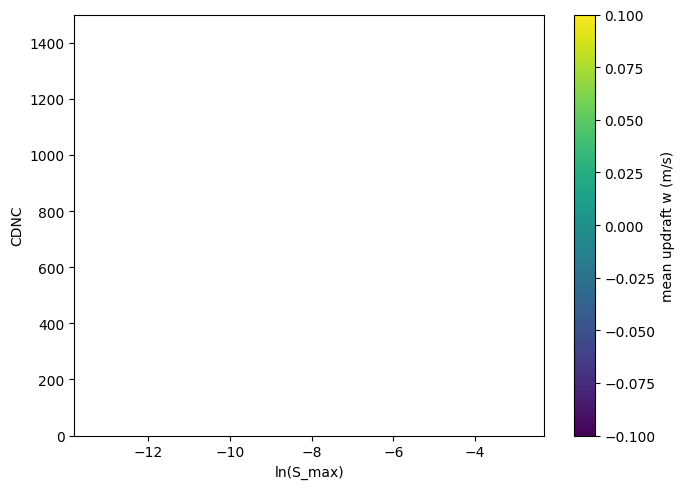

In [11]:
import dask.array as da
import numpy as np, dask
import matplotlib.pyplot as plt

def as_dask(x, chunk="auto"):
    arr = x.data
    return arr if hasattr(arr, "numblocks") else da.from_array(arr, chunks=chunk)

s_da = as_dask(smax.incld_ratio).ravel()
c_da = as_dask(CDNC).ravel()
w_da = as_dask(Updraft.WSUB).ravel()

m  = da.isfinite(s_da) & da.isfinite(c_da) & da.isfinite(w_da) & (s_da > 0) & (c_da > 0)
ls = da.log(s_da[m]); c = c_da[m]; w = w_da[m]

xr_, yr_, bins = [np.log(1e-6), np.log(1e-1)], [0.0, 1500.0], [200, 200]
Hw, xe, ye = da.histogram2d(ls, c, bins=bins, range=[xr_, yr_], weights=w)
Hn, _, _   = da.histogram2d(ls, c, bins=bins, range=[xr_, yr_])
Hw, Hn = dask.compute(Hw, Hn)
mean_w = np.where(Hn > 0, Hw/np.maximum(Hn,1), np.nan)

fig, ax = plt.subplots(figsize=(7,5))
pc = ax.pcolormesh(xe, ye, mean_w.T, cmap="viridis", shading="auto")
fig.colorbar(pc, ax=ax, label="mean updraft w (m/s)")
ax.set_xlabel("ln(S_max)"); ax.set_ylabel("CDNC")
plt.tight_layout(); plt.show()

In [13]:
print(type(smax.incld_ratio.data), type(CDNC.data), type(Updraft.WSUB.data))

<class 'numpy.ndarray'> <class 'dask.array.core.Array'> <class 'numpy.ndarray'>


In [14]:
import numpy as np

s = np.asarray(smax.incld_ratio.values).ravel()
c = np.asarray(CDNC.values).ravel()
w = np.asarray(Updraft.WSUB.values).ravel()
m = np.isfinite(s) & np.isfinite(c) & np.isfinite(w) & (s > 0) & (c > 0)
s, c, w = s[m], c[m], w[m]
ls = np.log(s)

print("points kept:", s.size)
print("S_max   min/max:", s.min(), s.max())
print("ln(S_max) min/max:", ls.min(), ls.max())
print("CDNC    min/max:", c.min(), c.max())
print("WSUB    min/max:", w.min(), w.max())

points kept: 120781281
S_max   min/max: 0.000113469374 0.71900254
ln(S_max) min/max: -9.083978 -0.32989037
CDNC    min/max: 505863.53 2328414700.0
WSUB    min/max: 0.2 2.9858484


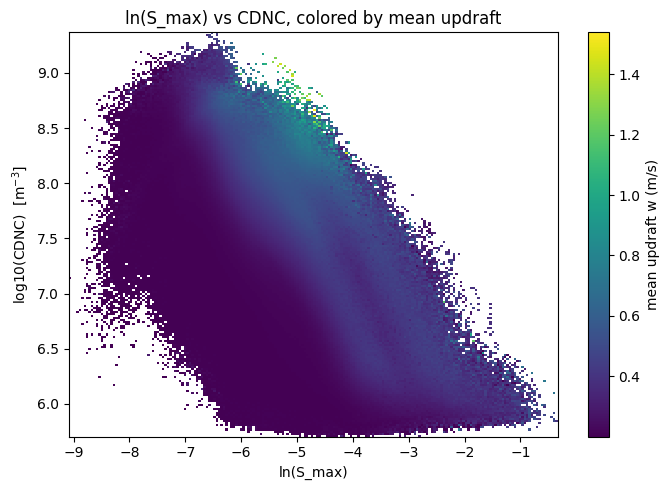

In [15]:
import numpy as np, matplotlib.pyplot as plt

# s, c, w, ls already defined and masked from your diagnostic cell
lc = np.log10(c)   # log10 CDNC, since it spans 5e5–2e9

bins = [200, 200]
Hw, xe, ye = np.histogram2d(ls, lc, bins=bins, weights=w)   # no range -> auto-fit
Hn, _, _   = np.histogram2d(ls, lc, bins=bins)
mean_w = np.where(Hn > 0, Hw/np.maximum(Hn, 1), np.nan)

fig, ax = plt.subplots(figsize=(7,5))
pc = ax.pcolormesh(xe, ye, mean_w.T, cmap="viridis", shading="auto")
fig.colorbar(pc, ax=ax, label="mean updraft w (m/s)")
ax.set_xlabel("ln(S_max)")
ax.set_ylabel("log10(CDNC)  [m$^{-3}$]")
ax.set_title("ln(S_max) vs CDNC, colored by mean updraft")
plt.tight_layout(); plt.show()

In [18]:
import numpy as np

# threshold for "cloudy" — CDNC is in m^-3 here; pick a sensible cutoff.
# e.g. 1e6 m^-3 = 1 cm^-3. Adjust to taste.
THRESH = 1e6


# make sure lev is descending in hPa so the FIRST cloudy level = highest hPa = cloud base
cdnc = CDNC.sortby("lev", ascending=False)
smx  = smax.incld_ratio.sortby("lev", ascending=False)
wsub = Updraft.WSUB.sortby("lev", ascending=False)

cloudy = cdnc > THRESH                      # bool, (time, lev, lat, lon)
has_cloud = cloudy.any("lev")               # columns with any cloud at all
base_idx = cloudy.argmax("lev").compute()             # index of FIRST cloudy level = cloud base

# select cloud-base level in each column
cb_cdnc = cdnc.isel(lev=base_idx)
cb_smax = smx.isel(lev=base_idx)
cb_wsub = wsub.isel(lev=base_idx)

# drop columns that had no cloud (argmax returned 0 spuriously there)
cb_cdnc = cb_cdnc.where(has_cloud)
cb_smax = cb_smax.where(has_cloud)
cb_wsub = cb_wsub.where(has_cloud)

In [6]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import xarray as xr
from pathlib import Path

SUSC_DIR = Path('/share/pech2273/susceptibility')

ds_alllevels = xr.open_dataset(SUSC_DIR/'susceptibility_all_levels.nc')
# X: array of shape (n_profiles, n_points)
X = ds_alllevels.slope.sel(updraft_q = 'Total')
# Normalize each profile (row-wise) to remove average-level differences
# z-score per profile captures shape, not magnitude
X_norm = (X - X.mean(axis=1, keepdims=True)) / X.std(axis=1, keepdims=True)

# Cluster
km = KMeans(n_clusters=k, random_state=0, n_init=10)
labels = km.fit_predict(X_norm)

ValueError: cannot reindex or align along dimension 'lon' because of conflicting dimension sizes: {144, 1} (note: an index is found along that dimension with size=144)

In [7]:
print(X.dims, X.shape)

('lat', 'lon', 'radius') (96, 144, 21)


In [8]:
import numpy as np
from sklearn.cluster import KMeans
import xarray as xr
from pathlib import Path

SUSC_DIR = Path('/share/pech2273/susceptibility')
ds_alllevels = xr.open_dataset(SUSC_DIR/'susceptibility_all_levels.nc')

X = ds_alllevels.slope.sel(updraft_q='Total')   # (lat, lon, radius)

# z-score along the profile axis (radius) — shape only
X_norm = (X - X.mean(dim='radius')) / X.std(dim='radius')

# stack (lat, lon) into one sample axis -> (n_profiles, radius)
X_stacked = X_norm.stack(sample=('lat', 'lon')).transpose('sample', 'radius')
arr = X_stacked.values

# drop profiles with NaNs (missing data, or std=0 -> divide-by-zero)
valid = ~np.isnan(arr).any(axis=1)
arr_valid = arr[valid]

k = 4   # set your cluster count
km = KMeans(n_clusters=k, random_state=0, n_init=10)
labels_valid = km.fit_predict(arr_valid)

# map labels back to the (lat, lon) grid
labels_full = np.full(arr.shape[0], -1)
labels_full[valid] = labels_valid
labels_da = (xr.DataArray(labels_full, dims='sample',
                          coords={'sample': X_stacked['sample']})
             .unstack('sample'))   # back to (lat, lon), -1 = excluded

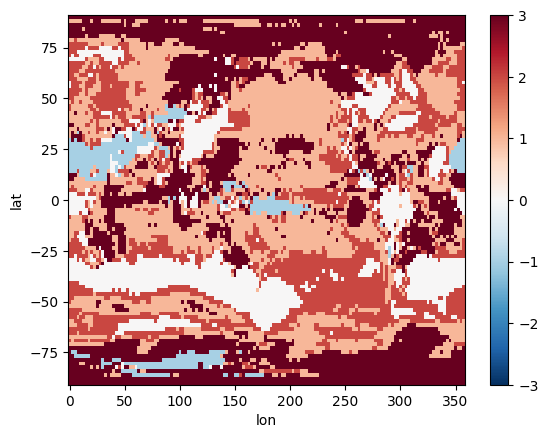

In [15]:

labels_da.plot()

In [16]:
from sklearn.metrics import silhouette_score
for k in range(2, 8):
    lbl = KMeans(n_clusters=k, n_init=10, random_state=0).fit_predict(arr_valid)
    print(k, silhouette_score(arr_valid, lbl))

2 0.4716916698836624
3 0.34251782662588953
4 0.2595793389543627
5 0.27569490061837926
6 0.2556918345907601
7 0.24641478588237542


/tmp/ipykernel_761778/426942065.py:14: RuntimeWarning: Mean of empty slice.
  ax.plot(radius, members.mean(axis=0), color=cmap(c), lw=2.5,


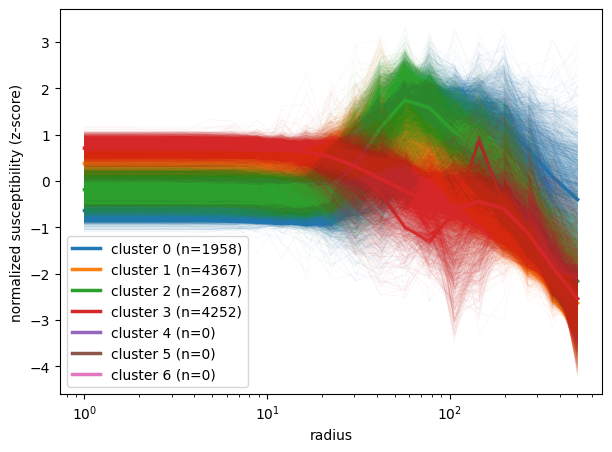

In [18]:
import matplotlib.pyplot as plt

radius = X_stacked['radius'].values   # x-axis

fig, ax = plt.subplots(figsize=(7, 5))

# faint individual profiles, colored by cluster
cmap = plt.get_cmap('tab10')
for c in range(k):
    members = arr_valid[labels_valid == c]
    for prof in members:
        ax.plot(radius, prof, color=cmap(c), alpha=0.05, lw=0.5)
    # bold cluster mean
    ax.plot(radius, members.mean(axis=0), color=cmap(c), lw=2.5,
            label=f'cluster {c} (n={len(members)})')
ax.set_xscale('log')
ax.set_xlabel('radius')
ax.set_ylabel('normalized susceptibility (z-score)')
ax.legend()
plt.show()

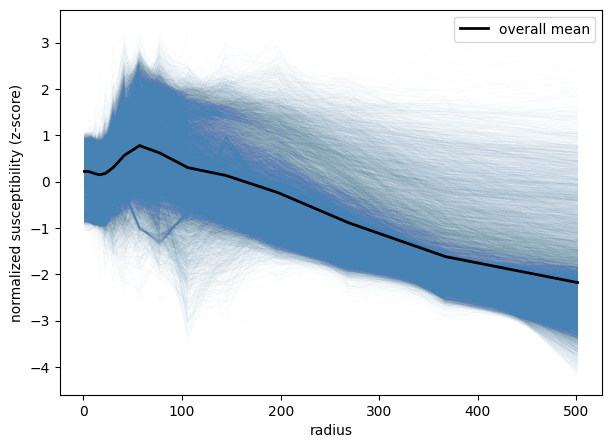

In [19]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(radius, arr_valid.T, color='steelblue', alpha=0.02, lw=0.5)
ax.plot(radius, arr_valid.mean(axis=0), color='black', lw=2, label='overall mean')
ax.set_xlabel('radius')
ax.set_ylabel('normalized susceptibility (z-score)')
ax.legend()
plt.show()

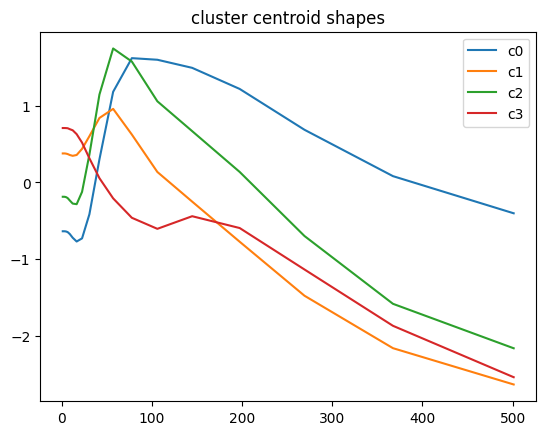

In [21]:
import matplotlib.pyplot as plt

n_clusters = km.cluster_centers_.shape[0]   # source of truth
for c in range(n_clusters):
    plt.plot(radius, km.cluster_centers_[c], label=f'c{c}')
plt.legend(); plt.title('cluster centroid shapes'); plt.show()

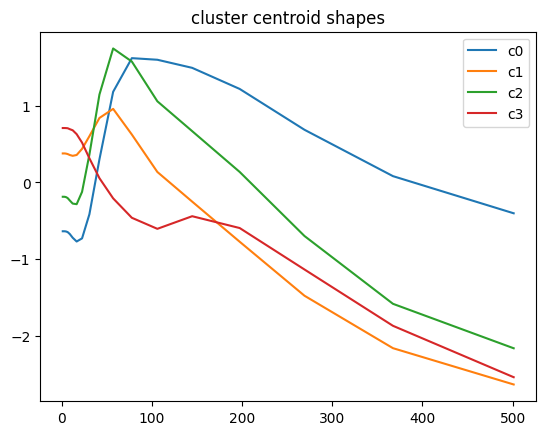

2 0.472
3 0.343
4 0.26
5 0.276
6 0.256
7 0.246
8 0.245


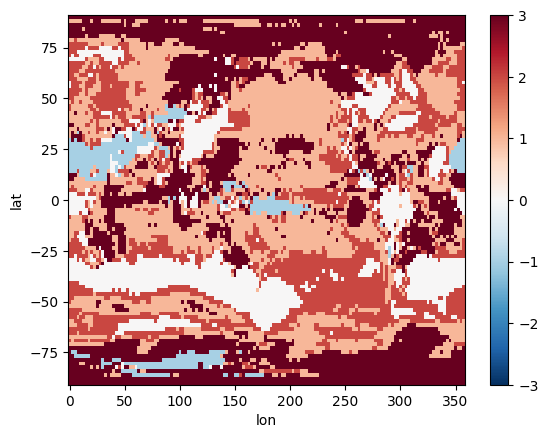

In [23]:
# 1. Plot centroids — do they look like genuinely distinct shapes?
import matplotlib.pyplot as plt
for c in range(4):
    plt.plot(radius, km.cluster_centers_[c], label=f'c{c}')
plt.legend(); plt.title('cluster centroid shapes'); plt.show()

# 2. Map — are clusters spatially coherent?
labels_da.plot()

# 3. Silhouette per-k — is there a clear k, or is it ambiguous?
from sklearn.metrics import silhouette_score
for kk in range(2, 9):
    lbl = KMeans(n_clusters=kk, n_init=10, random_state=0).fit_predict(arr_valid)
    print(kk, round(silhouette_score(arr_valid, lbl), 3))

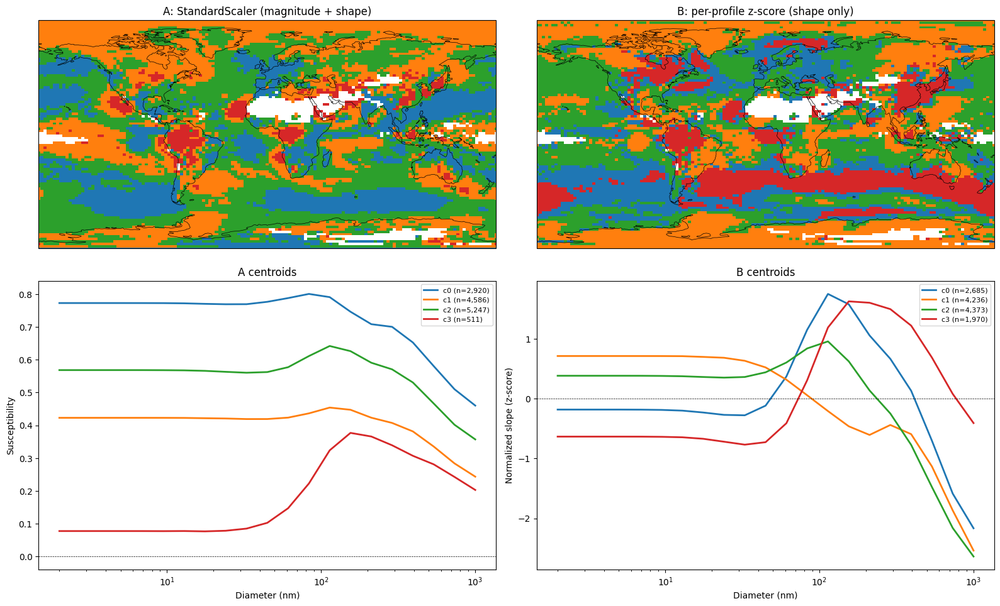

8,216 of 13,264 profiles (61.9%) changed cluster between methods


In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.optimize import linear_sum_assignment
from matplotlib.colors import BoundaryNorm, ListedColormap

# ── Load ──────────────────────────────────────────────────────
SUSC_DIR = Path('/share/pech2273/susceptibility')
ds = xr.open_dataset(SUSC_DIR / 'susceptibility_all_levels.nc')
X = ds.slope.sel(updraft_q='Total')          # (lat, lon, radius)
lat, lon, radius = X['lat'].values, X['lon'].values, X['radius'].values

k = 4   # use the same k for both so the comparison is fair

# ── Stack to (n_profiles, radius) and find valid rows ─────────
X_stacked = X.stack(sample=('lat', 'lon')).transpose('sample', 'radius')
vals = X_stacked.values                       # (n_profiles, 21)
valid = ~np.isnan(vals).any(axis=1)
vals_valid = vals[valid]

# ── Method A: StandardScaler (previous approach) ──────────────
# standardizes each radius COLUMN across grid points -> keeps per-profile level/amplitude
scaler = StandardScaler()
vals_scaledA = scaler.fit_transform(vals_valid)
kmA = KMeans(n_clusters=k, random_state=42, n_init=10)
labelsA = kmA.fit_predict(vals_scaledA)
centroidsA = scaler.inverse_transform(kmA.cluster_centers_)   # back to slope units

# ── Method B: per-profile z-score (shape-only) ────────────────
# standardizes each ROW (profile) -> removes level and amplitude
row_mean = vals_valid.mean(axis=1, keepdims=True)
row_std  = vals_valid.std(axis=1, keepdims=True)
vals_scaledB = (vals_valid - row_mean) / row_std
kmB = KMeans(n_clusters=k, random_state=42, n_init=10)
labelsB = kmB.fit_predict(vals_scaledB)
centroidsB = kmB.cluster_centers_              # already in z-score units

# ── Align B's cluster labels to A's for comparable colors ─────
# match clusters by spatial overlap (Hungarian on confusion matrix)
conf = np.zeros((k, k), dtype=int)
for a in range(k):
    for b in range(k):
        conf[a, b] = np.sum((labelsA == a) & (labelsB == b))
row_ind, col_ind = linear_sum_assignment(-conf)   # maximize overlap
remap = {old: new for new, old in zip(row_ind, col_ind)}
labelsB_aligned = np.array([remap[l] for l in labelsB])
inv_remap = {new: old for old, new in remap.items()}

# ── Put labels back on the (lat, lon) grid ────────────────────
def to_grid(labels_valid):
    full = np.full(vals.shape[0], -1)
    full[valid] = labels_valid
    da = xr.DataArray(full, dims='sample',
                      coords={'sample': X_stacked['sample']}).unstack('sample')
    return da

mapA = to_grid(labelsA)
mapB = to_grid(labelsB_aligned)
mapA_plot = mapA.where(mapA >= 0)   # -1 (empty cells) -> NaN -> not drawn
mapB_plot = mapB.where(mapB >= 0)

# ── Figure: 2 maps + 2 centroid panels ────────────────────────
fig = plt.figure(figsize=(16, 10))
cmap = plt.get_cmap('tab10')

# discrete colormap so cluster i -> cmap(i) on the maps too (matches centroids)
cluster_cmap = ListedColormap([cmap(i) for i in range(k)])
norm = BoundaryNorm(np.arange(-0.5, k, 1), cluster_cmap.N)

# Map A
axA = fig.add_subplot(2, 2, 1, projection=ccrs.PlateCarree())
imA = axA.pcolormesh(mapA_plot['lon'], mapA_plot['lat'], mapA_plot.values,
                     cmap=cluster_cmap, norm=norm,
                     transform=ccrs.PlateCarree(), shading='nearest')
axA.add_feature(cfeature.COASTLINE, linewidth=0.5)
axA.set_global(); axA.set_title('A: StandardScaler (magnitude + shape)')

# Map B
axB = fig.add_subplot(2, 2, 2, projection=ccrs.PlateCarree())
imB = axB.pcolormesh(mapB_plot['lon'], mapB_plot['lat'], mapB_plot.values,
                     cmap=cluster_cmap, norm=norm,
                     transform=ccrs.PlateCarree(), shading='nearest')
axB.add_feature(cfeature.COASTLINE, linewidth=0.5)
axB.set_global(); axB.set_title('B: per-profile z-score (shape only)')

# Centroids A (original slope units)
axCA = fig.add_subplot(2, 2, 3)
for i in range(k):
    n = np.sum(labelsA == i)
    axCA.plot(radius*2, centroidsA[i], color=cmap(i), lw=2, label=f'c{i} (n={n:,})')
axCA.set_xscale('log'); axCA.axhline(0, color='k', lw=0.5, ls='--')
axCA.set_xlabel('Diameter (nm)'); axCA.set_ylabel('Susceptibility')
axCA.set_title('A centroids'); axCA.legend(fontsize=8)

# Centroids B (z-score units, colors aligned to A)
axCB = fig.add_subplot(2, 2, 4)
for i in range(k):
    orig = inv_remap[i]
    n = np.sum(labelsB_aligned == i)
    axCB.plot(radius*2, centroidsB[orig], color=cmap(i), lw=2, label=f'c{i} (n={n:,})')
axCB.set_xscale('log'); axCB.axhline(0, color='k', lw=0.5, ls='--')
axCB.set_xlabel('Diameter (nm)'); axCB.set_ylabel('Normalized Susceptibility (z-score)')
axCB.set_title('B centroids'); axCB.legend(fontsize=8)

plt.tight_layout()
plt.show()

# ── Quick numeric summary of how much moved ───────────────────
moved = np.sum(labelsA != labelsB_aligned)
print(f"{moved:,} of {len(labelsA):,} profiles "
      f"({100*moved/len(labelsA):.1f}%) changed cluster between methods")

In [28]:
n_any = np.isnan(vals).any(axis=1).sum()
n_all = np.isnan(vals).all(axis=1).sum()
print(f"profiles with any NaN: {n_any:,}   all NaN: {n_all:,}")

profiles with any NaN: 560   all NaN: 560


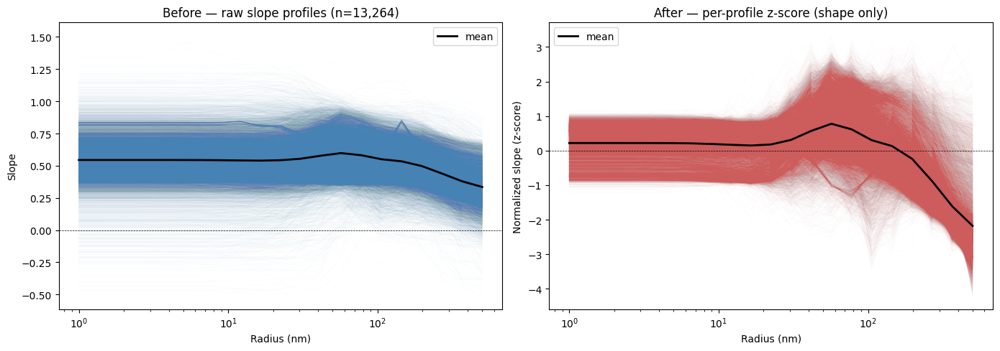

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# uses vals_valid (raw) and vals_scaledB (per-profile z-scored) from your cell
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# ── Before: raw slope profiles ────────────────────────────────
ax1.plot(radius, vals_valid.T, color='steelblue', alpha=0.02, lw=0.5)
ax1.plot(radius, vals_valid.mean(axis=0), color='black', lw=2, label='mean')
ax1.set_xscale('log')
ax1.axhline(0, color='k', lw=0.5, ls='--')
ax1.set_xlabel('Radius (nm)'); ax1.set_ylabel('Slope')
ax1.set_title(f'Before — raw slope profiles (n={vals_valid.shape[0]:,})')
ax1.legend()

# ── After: per-profile z-scored profiles ──────────────────────
ax2.plot(radius, vals_scaledB.T, color='indianred', alpha=0.02, lw=0.5)
ax2.plot(radius, vals_scaledB.mean(axis=0), color='black', lw=2, label='mean')
ax2.set_xscale('log')
ax2.axhline(0, color='k', lw=0.5, ls='--')
ax2.set_xlabel('Radius (nm)'); ax2.set_ylabel('Normalized slope (z-score)')
ax2.set_title('After — per-profile z-score (shape only)')
ax2.legend()

plt.tight_layout()
plt.show()

In [37]:
print(vals_scaledB.mean(axis=1).max())   # max row-mean -> ~0 (each profile centered)
print(vals_scaledB.mean(axis=0))         # column-means -> NOT all 0, traces avg shape
print(vals_scaledB.mean())               # grand mean -> ~0

9.198990775465583e-15
[ 0.21978172  0.21978003  0.21978218  0.21978645  0.21925628  0.21703989
  0.21101856  0.19301779  0.16969167  0.14827271  0.17753538  0.31140891
  0.57075634  0.77703016  0.61604852  0.30138423  0.13259751 -0.23718865
 -0.89014252 -1.61864969 -2.17820747]
-8.526441403434053e-18


In [42]:
vals_scaledA

array([[ 1.50438489,  1.50438781,  1.50440154, ...,  0.08933252,
        -0.01888793,  0.35504954],
       [ 1.51087701,  1.51087993,  1.51089383, ...,  0.04677895,
         0.05090313,  0.27631523],
       [ 1.52797046,  1.5279734 ,  1.52798754, ...,  0.05876612,
         0.12332109,  0.25132919],
       ...,
       [-0.93889006, -0.93888895, -0.93887052, ..., -0.81192617,
        -0.5837017 , -0.43756254],
       [-0.94012104, -0.94011993, -0.94014092, ..., -0.81590652,
        -0.58552444, -0.43734193],
       [-0.9341274 , -0.93412628, -0.93414714, ..., -0.82080036,
        -0.58687521, -0.43362543]], shape=(13264, 21))

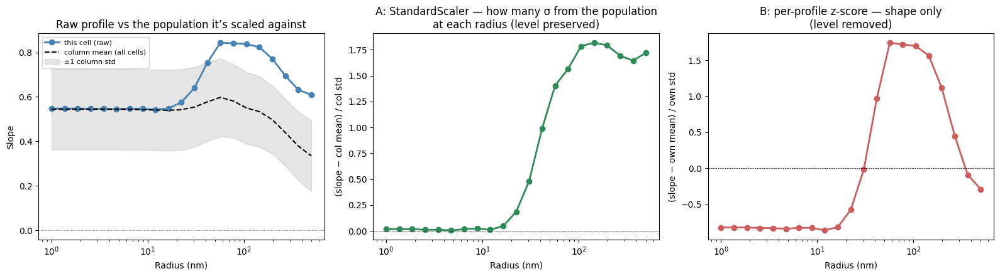

cell index 2555
raw mean across radius:        0.642
scaledA mean across radius:    0.727   (NOT 0 — level preserved)
scaledB mean across radius:    3.384e-16  (≈0 — level removed)


In [44]:
import matplotlib.pyplot as plt
import numpy as np

# pick one example cell (change the index to inspect a different profile)
idx = 2555   # any row in vals_valid

raw_profile    = vals_valid[idx]      # original slope
scaledA_profile = vals_scaledA[idx]   # after StandardScaler (column-wise)
scaledB_profile = vals_scaledB[idx]   # after per-profile z-score (row-wise), for contrast

# the column statistics StandardScaler used (computed across ALL cells)
col_mean = scaler.mean_
col_std  = np.sqrt(scaler.var_)

fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

# ── Panel 1: raw profile + the column mean±std band it sits in ──
axes[0].plot(radius, raw_profile, 'o-', color='steelblue', lw=2, label='this cell (raw)')
axes[0].plot(radius, col_mean, color='black', lw=1.5, ls='--', label='column mean (all cells)')
axes[0].fill_between(radius, col_mean - col_std, col_mean + col_std,
                     color='gray', alpha=0.2, label='±1 column std')
axes[0].set_xscale('log'); axes[0].axhline(0, color='k', lw=0.5, ls=':')
axes[0].set_xlabel('Radius (nm)'); axes[0].set_ylabel('Slope')
axes[0].set_title('Raw profile vs the population it’s scaled against')
axes[0].legend(fontsize=8)

# ── Panel 2: after StandardScaler (method A) ───────────────────
axes[1].plot(radius, scaledA_profile, 'o-', color='seagreen', lw=2)
axes[1].set_xscale('log'); axes[1].axhline(0, color='k', lw=0.5, ls='--')
axes[1].set_xlabel('Radius (nm)'); axes[1].set_ylabel('(slope − col mean) / col std')
axes[1].set_title('A: StandardScaler — how many σ from the population\nat each radius (level preserved)')

# ── Panel 3: per-profile z-score (method B), for contrast ──────
axes[2].plot(radius, scaledB_profile, 'o-', color='indianred', lw=2)
axes[2].set_xscale('log'); axes[2].axhline(0, color='k', lw=0.5, ls='--')
axes[2].set_xlabel('Radius (nm)'); axes[2].set_ylabel('(slope − own mean) / own std')
axes[2].set_title('B: per-profile z-score — shape only\n(level removed)')

plt.tight_layout()
plt.show()

# numbers for this cell
print(f"cell index {idx}")
print(f"raw mean across radius:        {raw_profile.mean():.3f}")
print(f"scaledA mean across radius:    {scaledA_profile.mean():.3f}   (NOT 0 — level preserved)")
print(f"scaledB mean across radius:    {scaledB_profile.mean():.3e}  (≈0 — level removed)")

In [45]:
import numpy as np

# transition counts: rows = method A cluster, cols = method B cluster (aligned labels)
trans = np.zeros((k, k), dtype=int)
for a in range(k):
    for b in range(k):
        trans[a, b] = np.sum((labelsA == a) & (labelsB_aligned == b))

print("rows = A cluster, cols = B cluster (aligned)")
print("diagonal = stayed, off-diagonal = moved\n")
print("      " + "".join(f"B{b:>7}" for b in range(k)))
for a in range(k):
    print(f"A{a}  " + "".join(f"{trans[a,b]:>8,}" for b in range(k)))

rows = A cluster, cols = B cluster (aligned)
diagonal = stayed, off-diagonal = moved

      B      0B      1B      2B      3
A0       748   1,065   1,020      87
A1       651   1,948   1,307     680
A2     1,176   1,204   2,008     859
A3       110      19      38     344


Largest moves (A->B): [('A1->B2', np.int64(1307)), ('A2->B1', np.int64(1204)), ('A2->B0', np.int64(1176))]


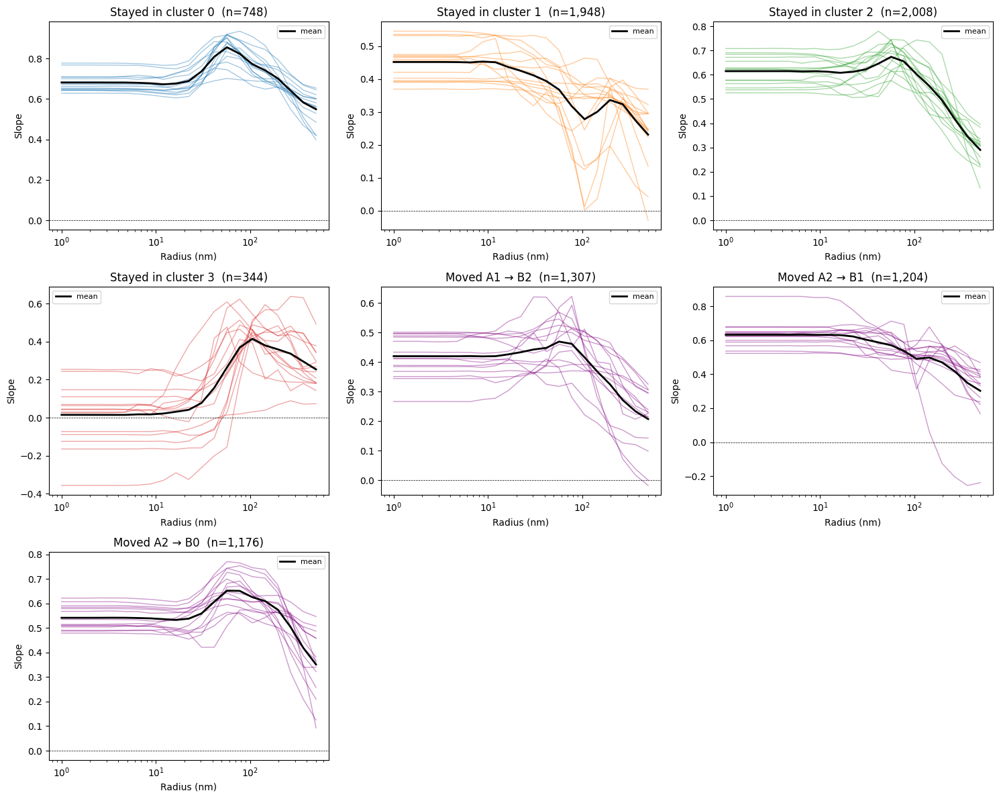

In [46]:
import matplotlib.pyplot as plt

rng = np.random.default_rng(0)
N_SHOW = 15   # profiles drawn per group

def pick(mask, n=N_SHOW):
    """random sample of row-indices (into vals_valid) where mask is True"""
    idx = np.flatnonzero(mask)
    if len(idx) == 0:
        return idx
    return rng.choice(idx, size=min(n, len(idx)), replace=False)

# ── identify the biggest off-diagonal transitions to feature ──
off = [(a, b, trans[a, b]) for a in range(k) for b in range(k) if a != b]
off.sort(key=lambda t: -t[2])
top_moves = off[:3]            # three largest A->B flows
print("Largest moves (A->B):", [(f"A{a}->B{b}", n) for a, b, n in top_moves])

cmap = plt.get_cmap('tab10')
n_panels = k + len(top_moves)
ncols = 3
nrows = int(np.ceil(n_panels / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows),
                         squeeze=False)
axes = axes.ravel()

# ── stayers: same cluster in both methods ─────────────────────
for c in range(k):
    ax = axes[c]
    sel = pick((labelsA == c) & (labelsB_aligned == c))
    for i in sel:
        ax.plot(radius, vals_valid[i], color=cmap(c), alpha=0.4, lw=1)
    if len(sel):
        ax.plot(radius, vals_valid[sel].mean(0), color='black', lw=2, label='mean')
    ax.set_xscale('log'); ax.axhline(0, color='k', lw=0.5, ls='--')
    ax.set_title(f'Stayed in cluster {c}  (n={trans[c,c]:,})')
    ax.set_xlabel('Radius (nm)'); ax.set_ylabel('Slope'); ax.legend(fontsize=8)

# ── movers: largest A->B transitions ──────────────────────────
for j, (a, b, n) in enumerate(top_moves):
    ax = axes[k + j]
    sel = pick((labelsA == a) & (labelsB_aligned == b))
    for i in sel:
        ax.plot(radius, vals_valid[i], color='purple', alpha=0.4, lw=1)
    if len(sel):
        ax.plot(radius, vals_valid[sel].mean(0), color='black', lw=2, label='mean')
    ax.set_xscale('log'); ax.axhline(0, color='k', lw=0.5, ls='--')
    ax.set_title(f'Moved A{a} → B{b}  (n={n:,})')
    ax.set_xlabel('Radius (nm)'); ax.set_ylabel('Slope'); ax.legend(fontsize=8)

# hide any unused panels
for ax in axes[n_panels:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

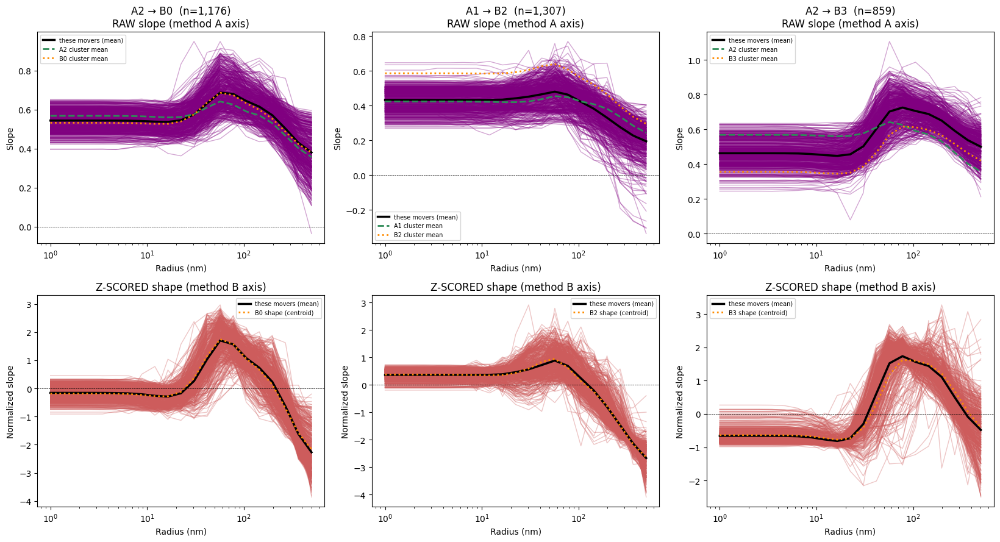

In [48]:
import matplotlib.pyplot as plt
import numpy as np

rng = np.random.default_rng(0)
N_SHOW = 500

moves = [(2, 0), (1, 2), (2, 3)]   # (A cluster, B cluster) off-diagonal flows to inspect

def pick(mask, n=N_SHOW):
    idx = np.flatnonzero(mask)
    return rng.choice(idx, size=min(n, len(idx)), replace=False) if len(idx) else idx

# B-cluster mean shapes (z-scored), for reference overlay
B_mean_shape = {b: vals_scaledB[labelsB_aligned == b].mean(0) for b in range(k)}
# B-cluster mean raw level, for reference overlay
B_mean_raw   = {b: vals_valid[labelsB_aligned == b].mean(0) for b in range(k)}

ncols = len(moves)
fig, axes = plt.subplots(2, ncols, figsize=(5.5 * ncols, 9), squeeze=False)

for j, (a, b) in enumerate(moves):
    sel = pick((labelsA == a) & (labelsB_aligned == b))
    n = np.sum((labelsA == a) & (labelsB_aligned == b))

    # ── top row: RAW slope (what method A saw — level matters) ──
    axR = axes[0, j]
    for i in sel:
        axR.plot(radius, vals_valid[i], color='purple', alpha=0.35, lw=1)
    if len(sel):
        axR.plot(radius, vals_valid[sel].mean(0), color='black', lw=2.5,
                 label=f'these movers (mean)')
    # reference: mean raw level of the A-source and B-dest clusters
    axR.plot(radius, vals_valid[labelsA == a].mean(0), color='seagreen',
             lw=2, ls='--', label=f'A{a} cluster mean')
    axR.plot(radius, B_mean_raw[b], color='darkorange',
             lw=2, ls=':', label=f'B{b} cluster mean')
    axR.set_xscale('log'); axR.axhline(0, color='k', lw=0.5, ls='--')
    axR.set_title(f'A{a} → B{b}  (n={n:,})\nRAW slope (method A axis)')
    axR.set_xlabel('Radius (nm)'); axR.set_ylabel('Slope'); axR.legend(fontsize=7)

    # ── bottom row: Z-SCORED (what method B saw — shape only) ──
    axZ = axes[1, j]
    for i in sel:
        axZ.plot(radius, vals_scaledB[i], color='indianred', alpha=0.35, lw=1)
    if len(sel):
        axZ.plot(radius, vals_scaledB[sel].mean(0), color='black', lw=2.5,
                 label='these movers (mean)')
    # reference: shape of the B-dest cluster they were assigned to
    axZ.plot(radius, B_mean_shape[b], color='darkorange', lw=2, ls=':',
             label=f'B{b} shape (centroid)')
    axZ.set_xscale('log'); axZ.axhline(0, color='k', lw=0.5, ls='--')
    axZ.set_title(f'Z-SCORED shape (method B axis)')
    axZ.set_xlabel('Radius (nm)'); axZ.set_ylabel('Normalized slope'); axZ.legend(fontsize=7)

plt.tight_layout()
plt.show()

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Maldives coordinates (Malé area)
mald_lat, mald_lon = 3.2, 73.2

# handle 0-360 vs -180-180 longitude conventions
lon_vals = X['lon'].values
query_lon = mald_lon % 360 if lon_vals.max() > 180 else mald_lon

# nearest grid cell
cell = X.sel(lat=mald_lat, lon=query_lon, method='nearest')
sel_lat = float(cell['lat']); sel_lon = float(cell['lon'])
print(f"requested ({mald_lat}, {mald_lon}) -> nearest grid cell ({sel_lat:.2f}, {sel_lon:.2f})")

profile = cell.values   # the 21 radius values
print("profile:", profile)
print("any NaN? ", np.isnan(profile).any())

requested (3.2, 73.2) -> nearest grid cell (2.84, 72.50)
profile: [0.69999575 0.69999575 0.69999578 0.69999588 0.69999554 0.69999413
 0.70556811 0.70559467 0.70747814 0.70962149 0.69813285 0.69476588
 0.67453219 0.61016986 0.5841504  0.57262432 0.59125345 0.63338383
 0.7343063  0.65058541 0.61702856]
any NaN?  False


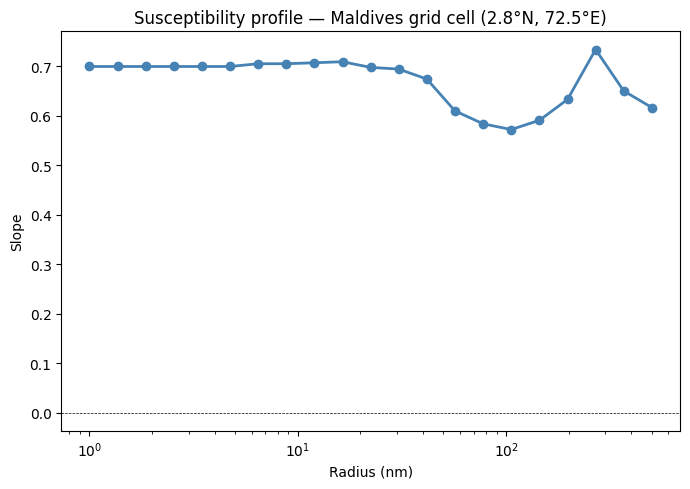

Method A cluster: 0   Method B (shape) cluster: 1


In [50]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(radius, profile, 'o-', color='steelblue', lw=2)
ax.set_xscale('log'); ax.axhline(0, color='k', lw=0.5, ls='--')
ax.set_xlabel('Radius (nm)'); ax.set_ylabel('Slope')
ax.set_title(f'Susceptibility profile — Maldives grid cell ({sel_lat:.1f}°N, {sel_lon:.1f}°E)')
plt.tight_layout(); plt.show()

# which cluster did each method assign this cell?
if not np.isnan(profile).any():
    ca = int(mapA.sel(lat=sel_lat, lon=sel_lon, method='nearest'))
    cb = int(mapB.sel(lat=sel_lat, lon=sel_lon, method='nearest'))
    print(f"Method A cluster: {ca}   Method B (shape) cluster: {cb}")
else:
    print("This cell is one of the excluded (NaN) cells — no cluster assigned.")